In [129]:
from IPython.display import Audio
import librosa
from librosa import display
import numpy as np
import scipy
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

In [130]:
y, sr = librosa.load('/Users/jayksc/Downloads/music-genre-classification-master/wav_files/Wav_Files_1/Wav_Files_1_1/17951_Hip_hop_music.wav', sr = 22050) # Use the default sampling rate of 22,050 Hz

In [131]:
Audio(y, rate = sr)

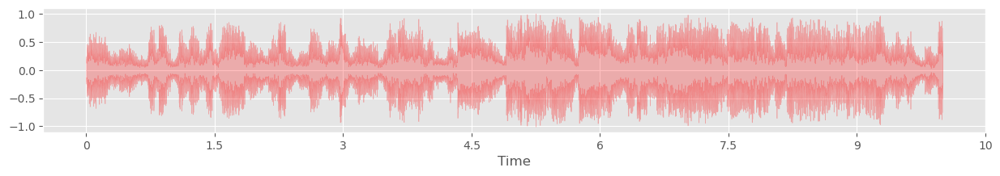

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [132]:
plt.figure(figsize=(15,2))
librosa.display.waveshow(y  = y,
                     sr= sr, 
                     max_points = 11025, 
                     alpha  = 0.25, 
                     color  = 'red')

### Part I: Time Domain Features

1) Statistical moments calculated on the raw audio

In [133]:
print('Signal mean = {:.2f}'.format(np.mean(abs(y))))
print('Signal std dev = {:.2f}'.format(np.std(y)))
print('Signal skewness = {:.2f}'.format(scipy.stats.skew(abs(y))))
print('Signal kurtosis = {:.2f}'.format(scipy.stats.kurtosis(y)))

Signal mean = 0.18
Signal std dev = 0.23
Signal skewness = 1.29
Signal kurtosis = 0.66


2) Zero crossing rate

ZCR mean = 0.13
ZCR std dev = 0.08


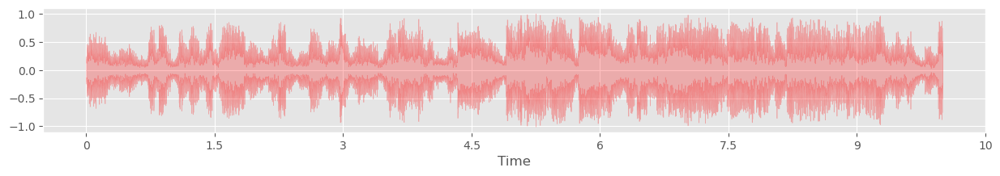

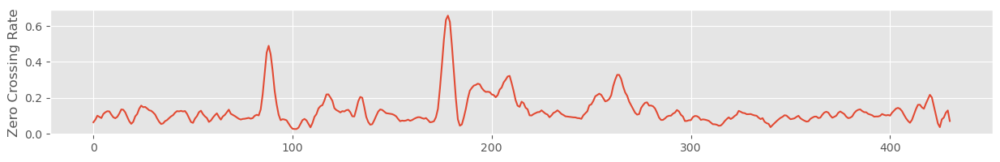

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [134]:
# Add a small constant before computing the zero crossing rate to disregard unwanted silence 'noise'
zcr = librosa.feature.zero_crossing_rate(y + 0.0001, frame_length=2048, hop_length=512)[0]
plt.figure(figsize=(15,2))
plt.plot(zcr)
plt.ylabel('Zero Crossing Rate')
print('ZCR mean = {:.2f}'.format(np.mean(zcr)))
print('ZCR std dev = {:.2f}'.format(np.std(zcr)))

3) Root Mean Squared Energy

RMSE mean = 0.22
RMSE std dev = 0.07


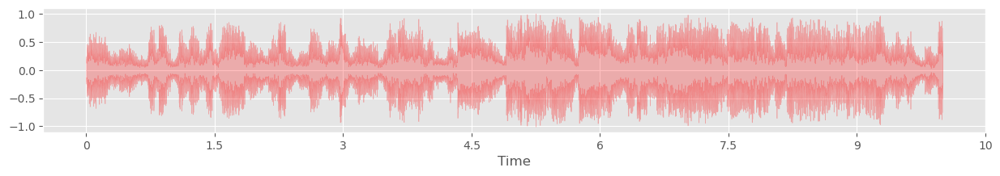

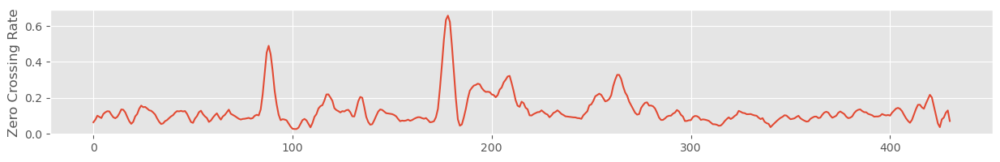

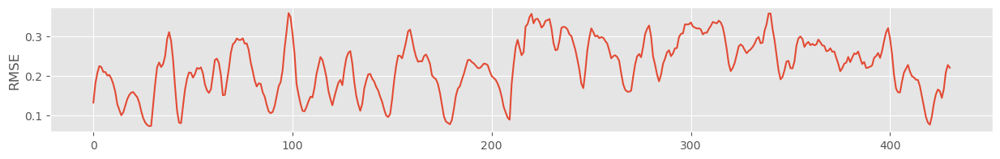

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [135]:
rmse = librosa.feature.rms(y=y + 0.0001)[0]
plt.figure(figsize=(15,2))
plt.plot(rmse)
plt.ylabel('RMSE')
print('RMSE mean = {:.2f}'.format(np.mean(rmse)))
print('RMSE std dev = {:.2f}'.format(np.std(rmse)))

### Part II: Spectral Features

1) Spectral Centroid: frequency area around which most of the signal energy concentrates<br>
$f_c = \frac{\Sigma_k S(k)f(k)}{\Sigma_k S(k)}$<br>
where  S(k) is the spectral magnitude at frequency bin  k <br>
f(k) is the frequency at bin  k

Spectral Centroid mean = 2747.83
Spectral Centroid std dev = 910.29


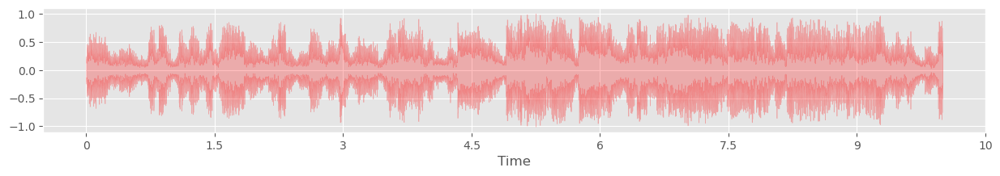

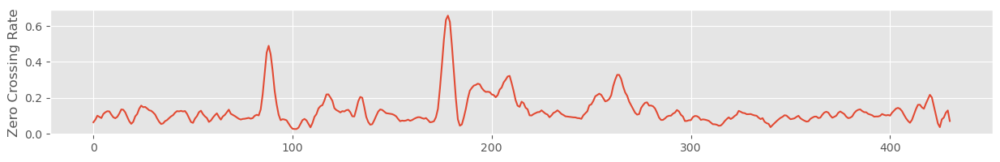

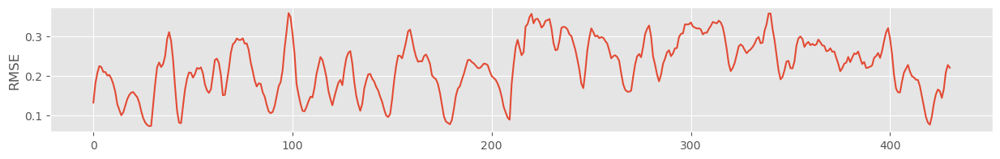

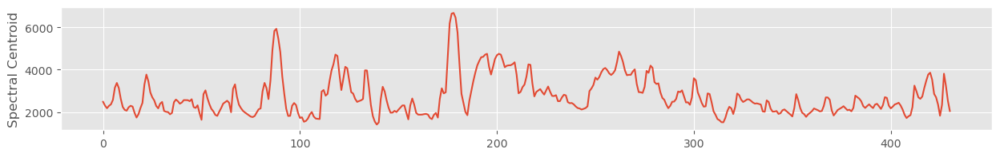

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [136]:
spectral_centroids = librosa.feature.spectral_centroid(y=y+0.01, sr=sr)[0]
plt.figure(figsize=(15,2))
plt.plot(spectral_centroids)
plt.ylabel('Spectral Centroid')
print('Spectral Centroid mean = {:.2f}'.format(np.mean(spectral_centroids)))
print('Spectral Centroid std dev = {:.2f}'.format(np.std(spectral_centroids)))

2) Spectral Band-width: Other moments calculated around the spectral centroid <br>
$f_c = (\Sigma_k S(k)f(k) - f_c)^\frac{1}{p}$ <br>
When  p=2 this is like a weighted standard deviation.

Spectral Bandwidth-2 mean = 2694.88
Spectral Bandwidth-2 std dev = 370.91
Spectral Bandwidth-3 mean = 3230.05
Spectral Bandwidth-3 std dev = 256.04
Spectral Bandwidth-4 mean = 3701.55
Spectral Bandwidth-4 std dev = 188.41


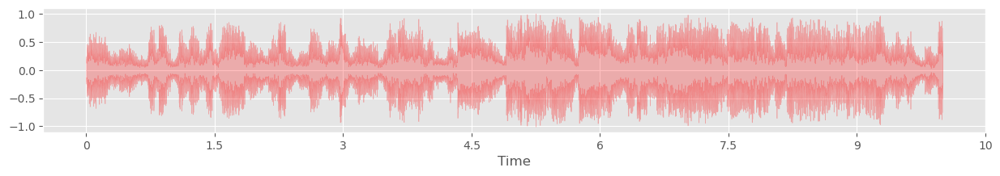

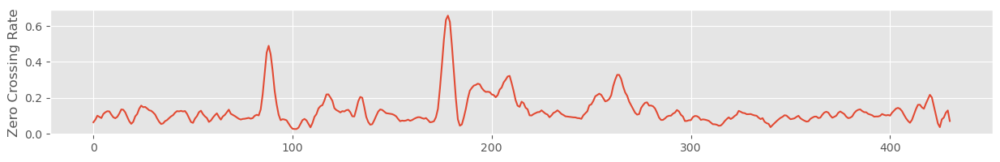

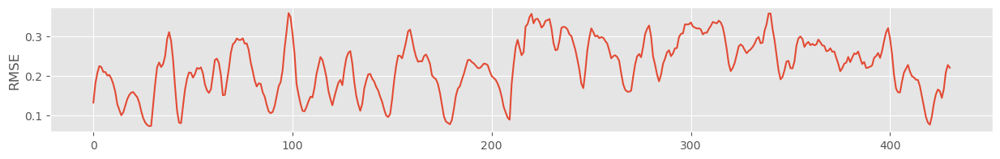

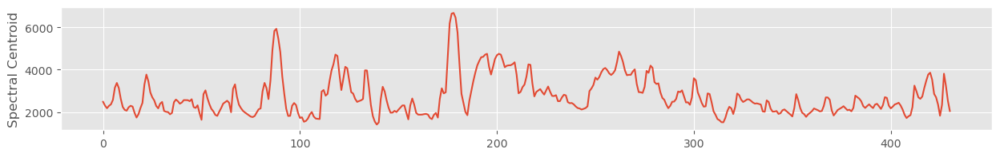

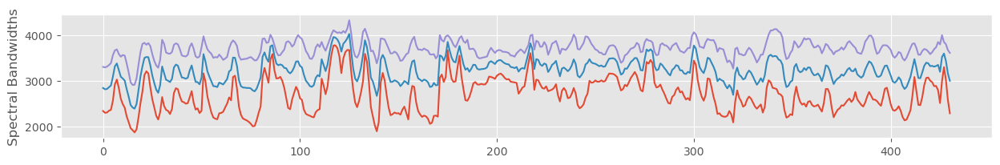

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [137]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y=y+0.01, sr=sr, p=2)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y=y+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y=y+0.01, sr=sr, p=4)[0]
plt.figure(figsize=(15,2))
plt.plot(spectral_bandwidth_2)
plt.plot(spectral_bandwidth_3)
plt.plot(spectral_bandwidth_4)
plt.ylabel('Spectral Bandwidths')
print('Spectral Bandwidth-2 mean = {:.2f}'.format(np.mean(spectral_bandwidth_2)))
print('Spectral Bandwidth-2 std dev = {:.2f}'.format(np.std(spectral_bandwidth_2)))
print('Spectral Bandwidth-3 mean = {:.2f}'.format(np.mean(spectral_bandwidth_3)))
print('Spectral Bandwidth-3 std dev = {:.2f}'.format(np.std(spectral_bandwidth_3)))
print('Spectral Bandwidth-4 mean = {:.2f}'.format(np.mean(spectral_bandwidth_4)))
print('Spectral Bandwidth-4 std dev = {:.2f}'.format(np.std(spectral_bandwidth_4)))
# Highly Correlated features may cause issues in the model building

3) Spectral Contrast: considers the spectral peak, the spectral valley, and their difference in each frequency subband. Usually, 6 sub-bands

Means [18.55175846 15.48704089 19.00682347 19.92866256 19.96838773 23.4420526
 47.00289932]
Std devs [4.56812757 4.24921296 5.05952232 4.54993666 4.05889781 7.43148768
 3.46157846]


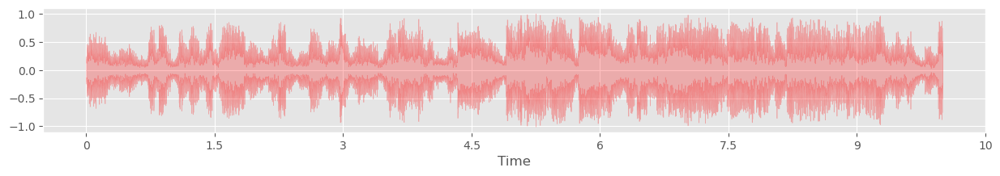

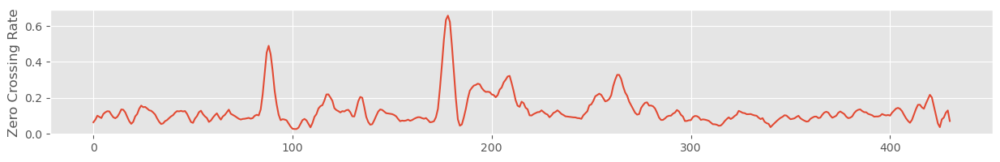

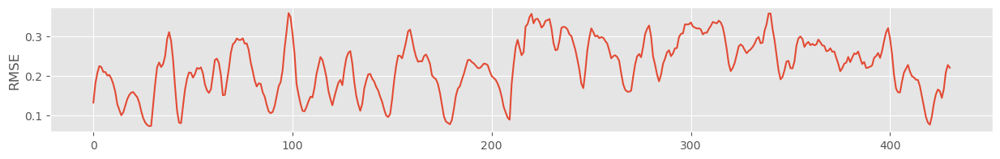

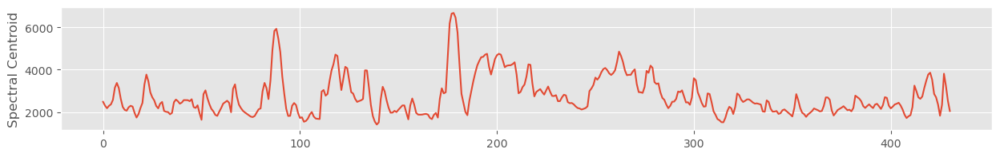

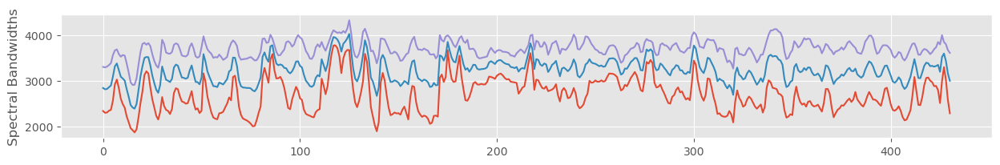

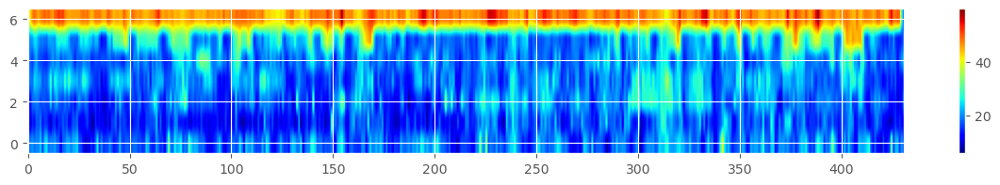

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [138]:
# Frequency cutoff for the first bin `[0, fmin]`
# Subsequent bins will cover `[fmin, 2*fmin]`, `[2*fmin, 4*fmin]
# Bins are on log scale
spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr, n_bands = 6, fmin = 200.0)
plt.figure(figsize=(15,2))
plt.imshow(spectral_contrast, aspect='auto', origin='lower', cmap='jet')
plt.colorbar()
print('Means', np.mean(spectral_contrast, axis=1)) # Values are on dB scale
print('Std devs', np.std(spectral_contrast, axis=1)) 

4) Spectral Roll-off: the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

Spectral Centroid mean = 5690.09
Spectral Centroid std dev = 1736.69


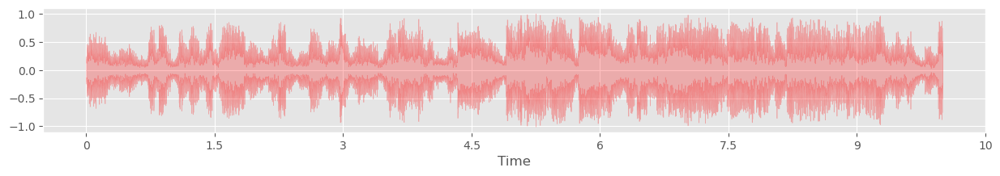

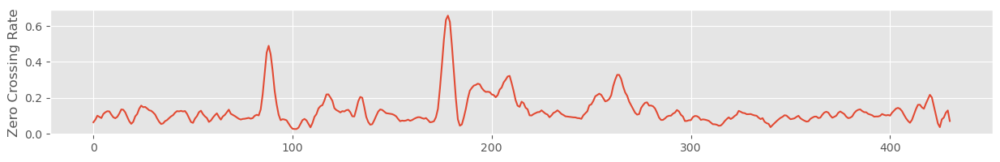

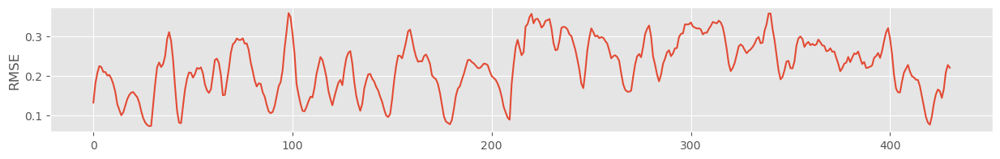

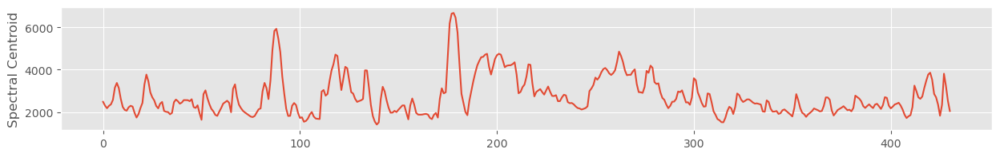

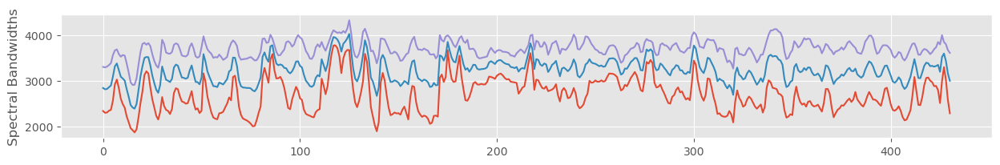

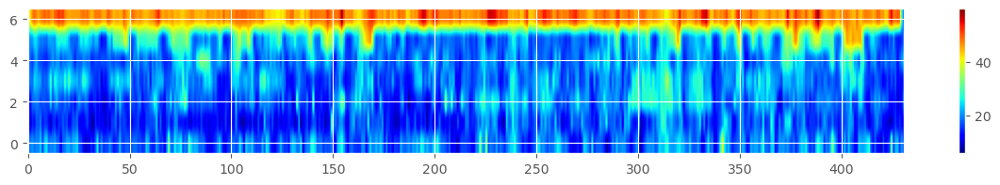

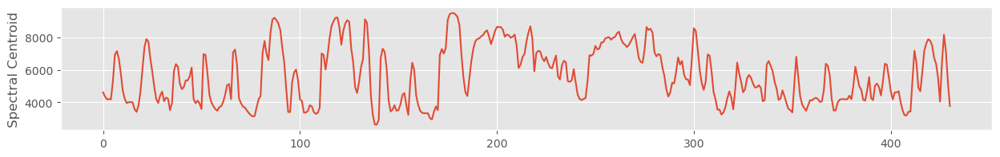

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [139]:
spectral_rolloff = librosa.feature.spectral_rolloff(y=y+0.01, sr=sr, roll_percent = 0.85)[0]
plt.figure(figsize=(15,2))
plt.plot(spectral_rolloff)
plt.ylabel('Spectral Centroid')
print('Spectral Centroid mean = {:.2f}'.format(np.mean(spectral_rolloff)))
print('Spectral Centroid std dev = {:.2f}'.format(np.std(spectral_rolloff)))

# What would be a good roll_percent to use?

5) Mel-Frequency Cepstral Coefficients

Means [-24.206842    75.64143     -5.4984717   15.281643     7.7049766
   2.089765     5.1700373    6.8763766   -5.686577     2.283274
  -5.961897     7.337385    -0.60964066   2.369252    -1.3576986
  -0.8141736   -3.1424232    5.7209997   -0.8530128    5.897073  ]
Std devs [41.699547  30.347475  17.163065  17.24551   13.102632  11.337893
  8.918345   8.934534   9.241808   9.124884   8.59281    7.216691
  7.7381525  7.8594275  7.573473   7.8199906  7.1235733  6.864633
  6.6524763  7.842939 ]


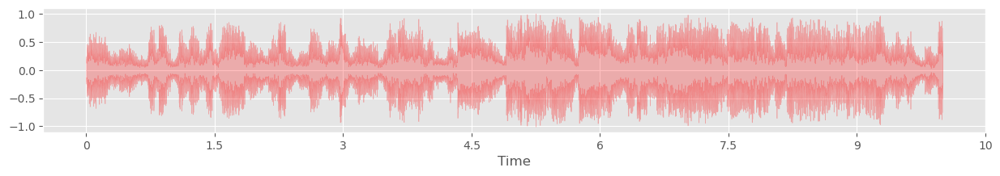

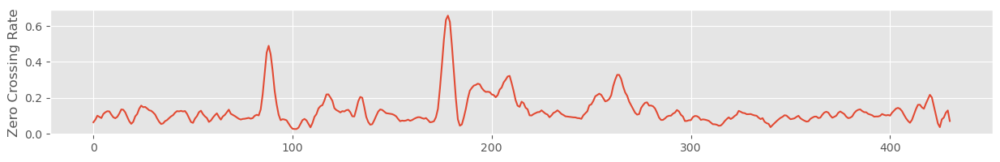

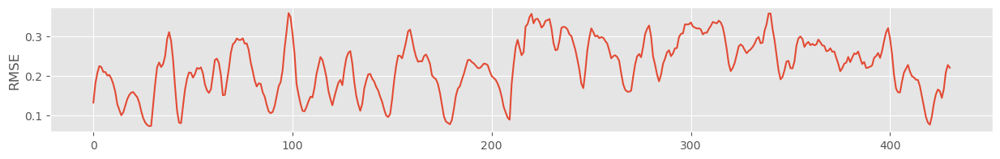

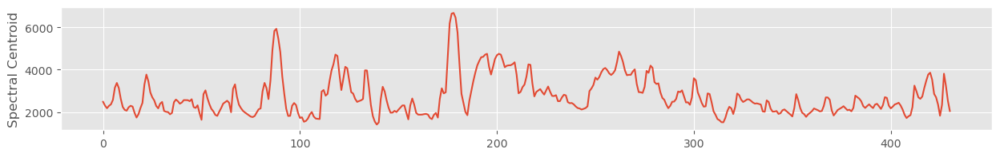

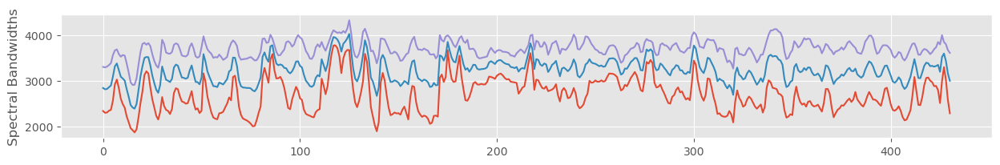

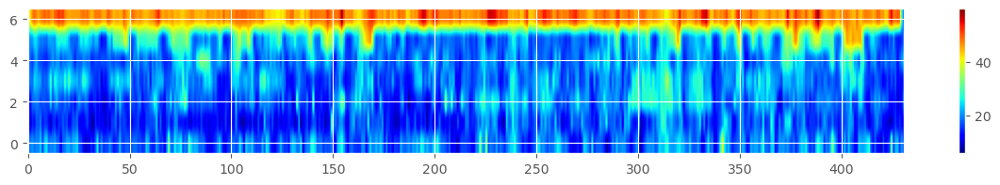

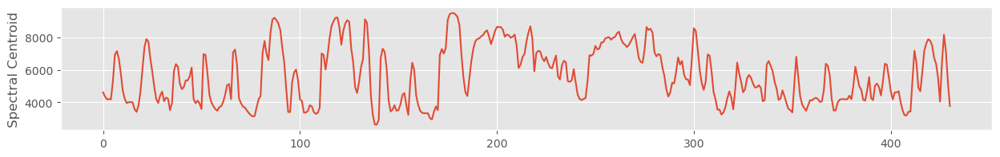

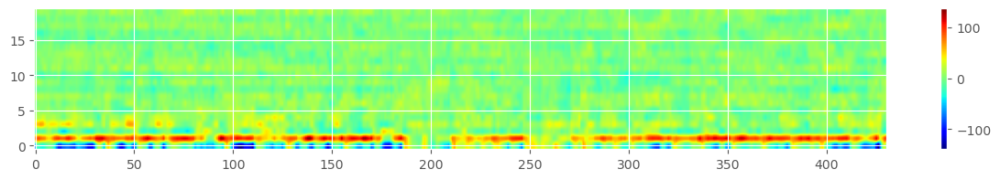

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [140]:
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
plt.figure(figsize=(15,2))
plt.imshow(mfccs, aspect='auto', origin='lower', cmap='jet')
plt.colorbar()
print('Means', np.mean(mfccs, axis=1)) 
print('Std devs', np.std(mfccs, axis=1)) 

6) Chroma Features (STFT)
A chroma vector (Wikipedia) is a typically a 12-element feature vector indicating how much energy of each pitch class, {C, C#, D, D#, E, ..., B}, is present in the signal.

Means [0.4286202  0.388067   0.60245967 0.38595226 0.3919932  0.37973124
 0.2782106  0.37301633 0.37082604 0.4944924  0.3119578  0.32197958]
Std devs [0.30404028 0.25846392 0.3529733  0.25252125 0.30248338 0.28612432
 0.21670157 0.31991604 0.25250888 0.34226745 0.2265726  0.25634217]


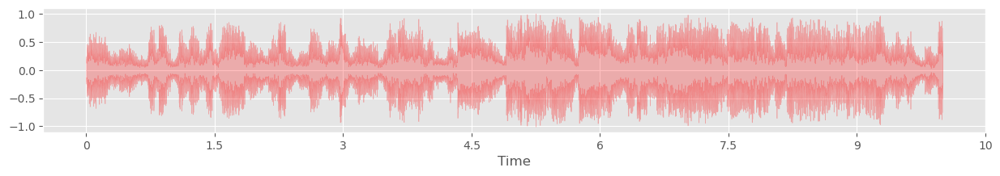

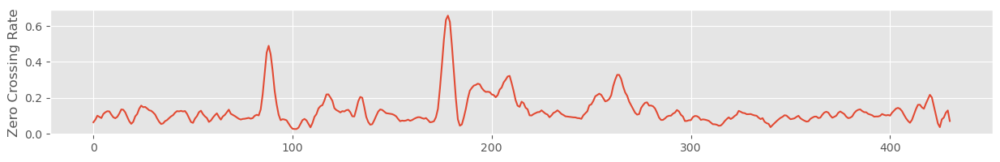

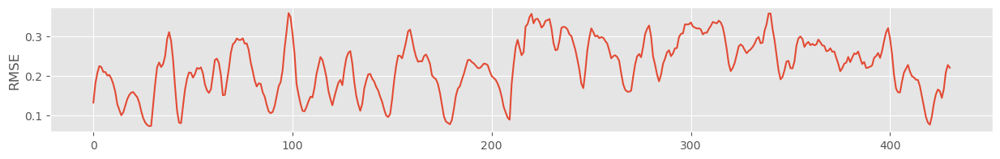

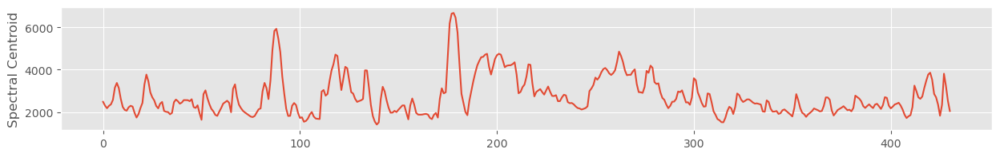

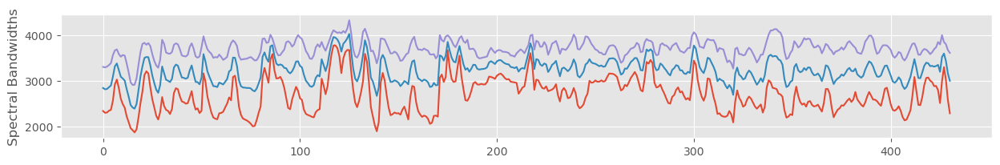

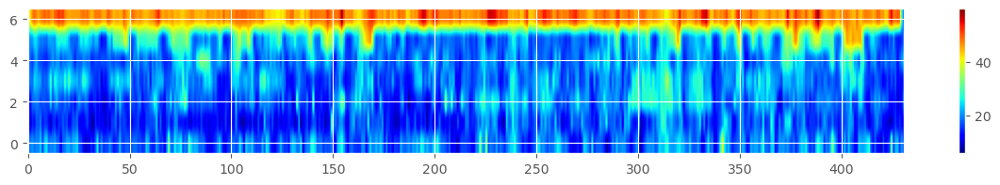

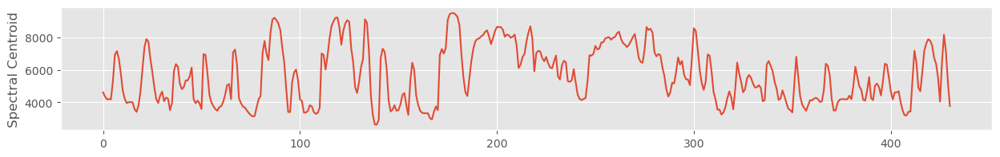

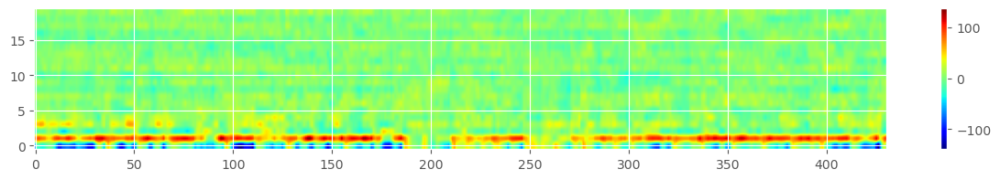

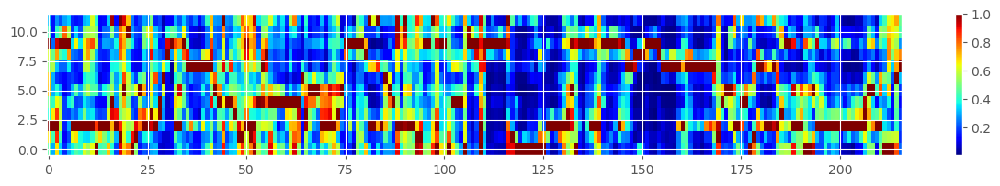

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [141]:
chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=1024)
plt.figure(figsize=(15,2))
plt.imshow(chroma_stft, aspect='auto', origin='lower', cmap='jet')
plt.colorbar()
print('Means', np.mean(chroma_stft, axis=1)) 
print('Std devs', np.std(chroma_stft, axis=1)) 

7) Chroma Features (CQT)

Means [0.50001407 0.4732181  0.6870749  0.5025369  0.4098946  0.41398934
 0.35513306 0.54788285 0.47403967 0.64066666 0.47213408 0.29172674]
Std devs [0.27115294 0.23814258 0.28099135 0.21840735 0.19313958 0.19024055
 0.15244423 0.3249827  0.2315186  0.27172554 0.2605542  0.12281815]


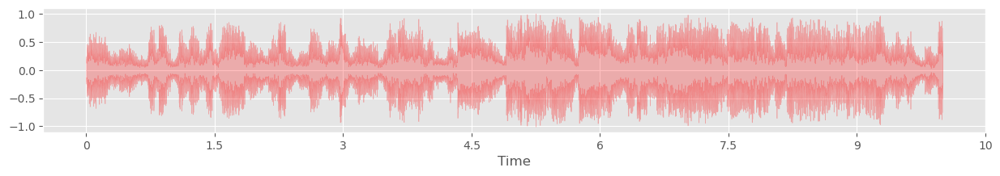

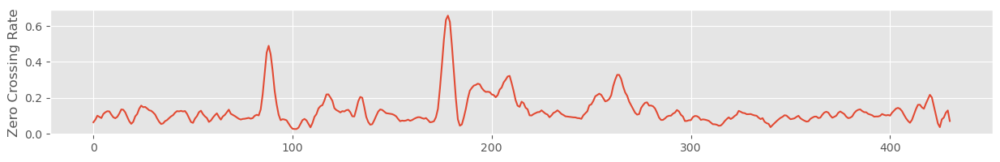

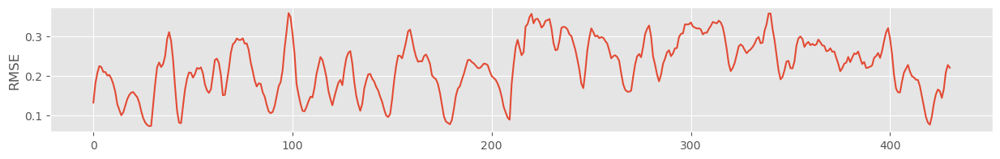

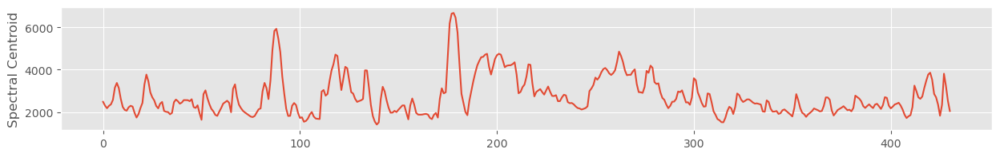

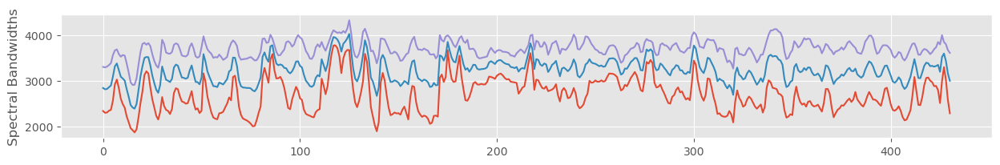

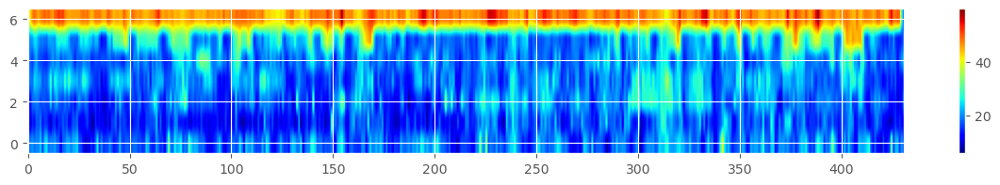

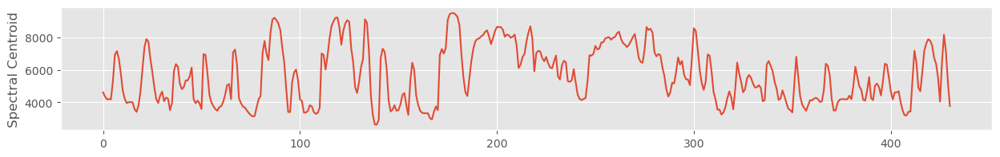

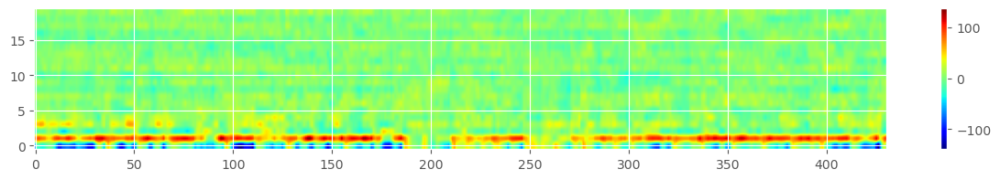

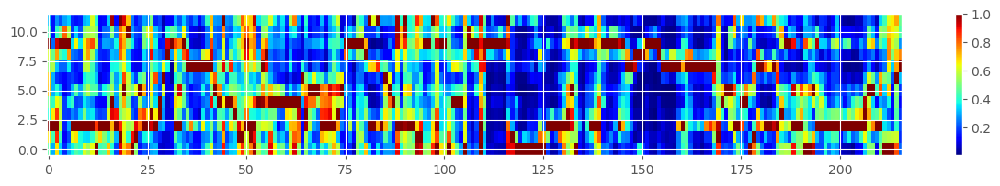

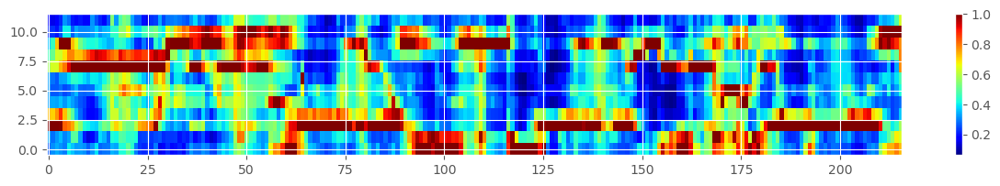

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [142]:
chroma_cqt = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=1024)
plt.figure(figsize=(15,2))
plt.imshow(chroma_cqt, aspect='auto', origin='lower', cmap='jet')
plt.colorbar()
print('Means', np.mean(chroma_cqt, axis=1)) 
print('Std devs', np.std(chroma_cqt, axis=1)) 

8) Chroma Features (CENS) - Chroma energy normalized statistics

Means [0.27620766 0.26892927 0.39088142 0.28811678 0.20408309 0.21714595
 0.17220853 0.2791845  0.25430173 0.3697538  0.24019784 0.10820747]
Std devs [0.13897891 0.13619335 0.13954    0.12217164 0.07705846 0.07743783
 0.07282072 0.14627309 0.11535619 0.09215504 0.11272527 0.05470566]


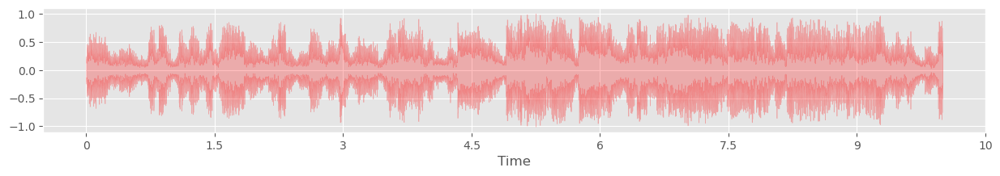

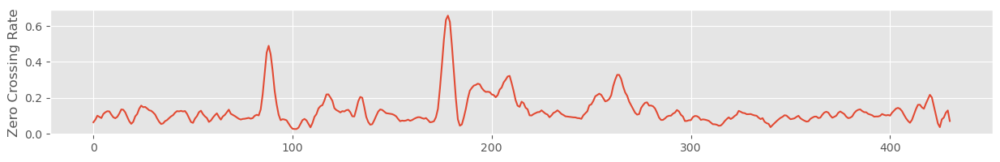

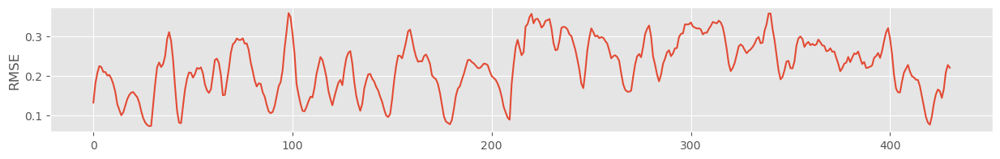

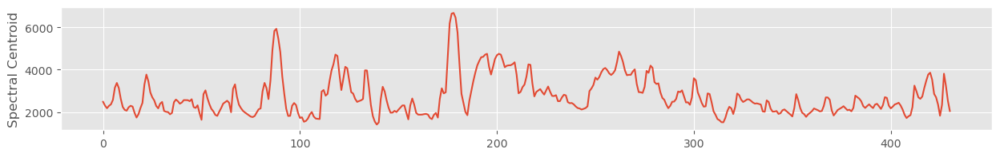

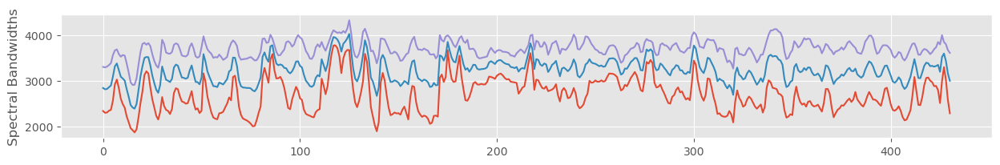

...

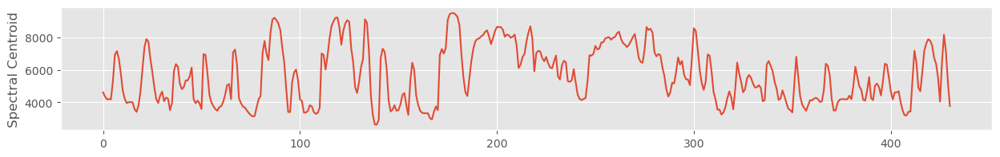

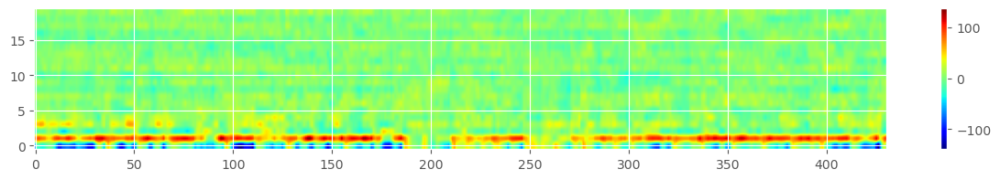

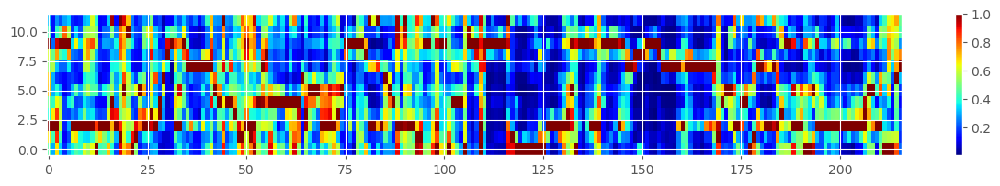

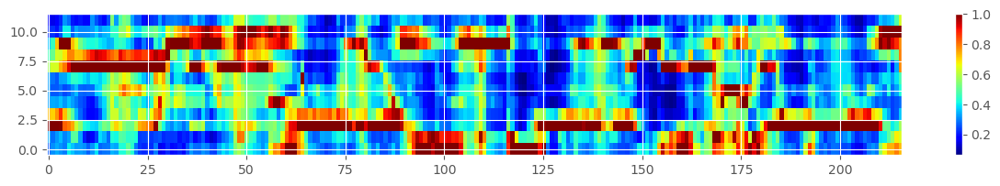

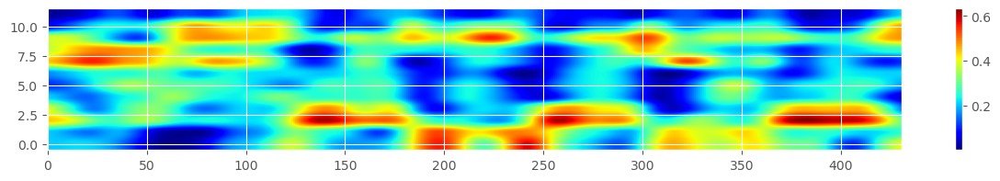

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [143]:
chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr, hop_length=512)
plt.figure(figsize=(15,2))
plt.imshow(chroma_cens, aspect='auto', origin='lower', cmap='jet')
plt.colorbar()
print('Means', np.mean(chroma_cens, axis=1)) 
print('Std devs', np.std(chroma_cens, axis=1)) 

In [144]:
import os
import numpy as np
import pandas as pd
import scipy
import librosa
from tqdm import tqdm

In [145]:
WAV_DIR = '/Users/jayksc/Downloads/music-genre-classification-master/wav_files/Wav_Files_1/Wav_Files_1_2/'
wav_files = os.listdir(WAV_DIR)[:]

In [146]:
col_names = ['file_name', 'signal_mean', 'signal_std', 'signal_skew', 'signal_kurtosis', 
             'zcr_mean', 'zcr_std', 'rmse_mean', 'rmse_std', 'tempo',
             'spectral_centroid_mean', 'spectral_centroid_std',
             'spectral_bandwidth_2_mean', 'spectral_bandwidth_2_std',
             'spectral_bandwidth_3_mean', 'spectral_bandwidth_3_std',
             'spectral_bandwidth_4_mean', 'spectral_bandwidth_4_std'] + \
            ['spectral_contrast_' + str(i+1) + '_mean' for i in range(7)] + \
            ['spectral_contrast_' + str(i+1) + '_std' for i in range(7)] + \
            ['spectral_rolloff_mean', 'spectral_rolloff_std'] + \
            ['mfccs_' + str(i+1) + '_mean' for i in range(20)] + \
            ['mfccs_' + str(i+1) + '_std' for i in range(20)] + \
            ['chroma_stft_' + str(i+1) + '_mean' for i in range(12)] + \
            ['chroma_stft_' + str(i+1) + '_std' for i in range(12)] 
            
df = pd.DataFrame(columns=col_names)

In [147]:
for f in tqdm(wav_files[:]):
    try:
        # Read wav-file
        y, sr = librosa.load(WAV_DIR+f, sr = 22050)
        
        feature_list = [f]

        feature_list.append(np.mean(abs(y)))
        feature_list.append(np.std(y))
        feature_list.append(scipy.stats.skew(abs(y)))
        feature_list.append(scipy.stats.kurtosis(y))

        zcr = librosa.feature.zero_crossing_rate(y=y + 0.0001, frame_length=2048, hop_length=512)[0]
        feature_list.append(np.mean(zcr))
        feature_list.append(np.std(zcr))

        rmse = librosa.feature.rms(y=y + 0.0001)[0]
        feature_list.append(np.mean(rmse))
        feature_list.append(np.std(rmse))
        
        tempo = librosa.beat.tempo(y=y, sr=sr)
        feature_list.extend(tempo)

        spectral_centroids = librosa.feature.spectral_centroid(y=y+0.01, sr=sr)[0]
        feature_list.append(np.mean(spectral_centroids))
        feature_list.append(np.std(spectral_centroids))

        spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y=y+0.01, sr=sr, p=2)[0]
        spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y=y+0.01, sr=sr, p=3)[0]
        spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y=y+0.01, sr=sr, p=4)[0]
        feature_list.append(np.mean(spectral_bandwidth_2))
        feature_list.append(np.std(spectral_bandwidth_2))
        feature_list.append(np.mean(spectral_bandwidth_3))
        feature_list.append(np.std(spectral_bandwidth_3))
        feature_list.append(np.mean(spectral_bandwidth_3))
        feature_list.append(np.std(spectral_bandwidth_3))

        spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr, n_bands = 6, fmin = 200.0)
        feature_list.extend(np.mean(spectral_contrast, axis=1))
        feature_list.extend(np.std(spectral_contrast, axis=1))

        spectral_rolloff = librosa.feature.spectral_rolloff(y=y+0.01, sr=sr, roll_percent = 0.85)[0]
        feature_list.append(np.mean(spectral_rolloff))
        feature_list.append(np.std(spectral_rolloff))

        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
        feature_list.extend(np.mean(mfccs, axis=1))
        feature_list.extend(np.std(mfccs, axis=1))

        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=1024)
        feature_list.extend(np.mean(chroma_stft, axis=1))
        feature_list.extend(np.std(chroma_stft, axis=1))
        
        feature_list[1:] = np.round(feature_list[1:], decimals=3)
        print(len(feature_list))
        
    except:
        pass
    
    df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)

# Save file
df.to_csv('full_test_3.csv', index=False)

  0%|                                                  | 0/5865 [00:00<?, ?it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 1/5865 [00:00<45:43,  2.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 2/5865 [00:00<40:25,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 3/5865 [00:01<38:58,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 4/5865 [00:01<38:20,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 5/5865 [00:02<40:25,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 6/5865 [00:02<42:48,  2.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 7/5865 [00:02<40:43,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 8/5865 [00:03<41:47,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                          | 9/5865 [00:03<40:40,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 10/5865 [00:04<40:38,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 11/5865 [00:04<40:40,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 12/5865 [00:05<40:37,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 13/5865 [00:05<39:01,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 14/5865 [00:05<38:46,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 15/5865 [00:06<39:41,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 16/5865 [00:06<38:44,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|                                         | 17/5865 [00:06<38:23,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 18/5865 [00:07<39:13,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 19/5865 [00:07<40:25,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 20/5865 [00:08<38:55,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 21/5865 [00:08<39:31,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 22/5865 [00:09<40:20,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 23/5865 [00:09<39:03,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 24/5865 [00:09<38:53,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 25/5865 [00:10<38:54,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 26/5865 [00:10<40:12,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 27/5865 [00:11<38:48,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 28/5865 [00:11<38:25,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  0%|▏                                        | 29/5865 [00:11<40:49,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▏                                        | 30/5865 [00:12<38:58,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▏                                        | 31/5865 [00:12<38:06,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▏                                        | 32/5865 [00:13<41:04,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▏                                        | 33/5865 [00:13<39:07,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▏                                        | 34/5865 [00:13<38:23,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▏                                        | 35/5865 [00:14<40:27,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 36/5865 [00:14<39:16,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 37/5865 [00:15<38:44,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 38/5865 [00:15<38:37,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 39/5865 [00:15<40:51,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 40/5865 [00:16<39:32,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 41/5865 [00:16<39:21,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 42/5865 [00:17<41:06,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 43/5865 [00:17<39:38,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 44/5865 [00:17<39:08,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 45/5865 [00:18<41:33,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 46/5865 [00:18<39:58,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 47/5865 [00:19<39:07,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 48/5865 [00:19<40:35,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 49/5865 [00:20<39:31,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 50/5865 [00:20<38:56,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 51/5865 [00:20<40:27,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 52/5865 [00:21<39:22,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▎                                        | 53/5865 [00:21<38:52,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 54/5865 [00:22<39:49,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 55/5865 [00:22<39:15,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 56/5865 [00:22<38:18,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 57/5865 [00:23<38:15,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 58/5865 [00:23<39:52,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 59/5865 [00:24<38:58,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 60/5865 [00:24<37:49,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 61/5865 [00:24<40:19,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 62/5865 [00:25<38:10,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 63/5865 [00:25<38:36,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 64/5865 [00:26<39:19,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 65/5865 [00:26<38:23,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 66/5865 [00:26<38:33,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 67/5865 [00:27<40:56,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 68/5865 [00:27<39:38,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 69/5865 [00:28<39:59,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 70/5865 [00:28<40:07,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▍                                        | 71/5865 [00:28<38:57,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 72/5865 [00:29<38:48,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 73/5865 [00:29<38:40,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 74/5865 [00:30<40:17,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 75/5865 [00:30<38:54,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 76/5865 [00:30<39:18,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 77/5865 [00:31<40:30,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 78/5865 [00:31<39:20,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 79/5865 [00:32<41:53,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 80/5865 [00:32<41:22,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 81/5865 [00:33<40:00,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 82/5865 [00:33<39:14,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 83/5865 [00:33<40:55,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 84/5865 [00:34<39:29,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 85/5865 [00:34<39:19,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 86/5865 [00:35<38:31,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  1%|▌                                        | 87/5865 [00:35<40:25,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▌                                        | 88/5865 [00:35<39:08,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▌                                        | 89/5865 [00:36<38:36,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 90/5865 [00:36<40:39,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 91/5865 [00:37<39:14,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 92/5865 [00:37<38:32,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 93/5865 [00:37<38:05,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 94/5865 [00:38<39:58,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 95/5865 [00:38<38:29,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 96/5865 [00:39<38:40,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 97/5865 [00:39<40:11,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 98/5865 [00:40<38:29,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                        | 99/5865 [00:40<37:43,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 100/5865 [00:40<36:23,  2.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 101/5865 [00:41<38:09,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 102/5865 [00:41<37:40,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 103/5865 [00:41<37:30,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 104/5865 [00:42<37:06,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 105/5865 [00:42<38:24,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 106/5865 [00:43<38:18,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 107/5865 [00:43<37:34,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 108/5865 [00:43<38:39,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▋                                       | 109/5865 [00:44<37:04,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 110/5865 [00:44<36:27,  2.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 111/5865 [00:45<37:00,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 112/5865 [00:45<38:47,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 113/5865 [00:45<37:29,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 114/5865 [00:46<39:38,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 115/5865 [00:46<38:23,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 116/5865 [00:47<38:22,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 117/5865 [00:47<39:01,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 118/5865 [00:47<40:46,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 119/5865 [00:48<39:28,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 120/5865 [00:48<39:18,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 121/5865 [00:49<38:36,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 122/5865 [00:49<40:34,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 123/5865 [00:50<38:53,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 124/5865 [00:50<38:49,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 125/5865 [00:50<40:23,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 126/5865 [00:51<38:58,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 127/5865 [00:51<38:17,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▊                                       | 128/5865 [00:52<37:57,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 129/5865 [00:52<39:56,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 130/5865 [00:52<39:21,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 131/5865 [00:53<38:59,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 132/5865 [00:53<41:44,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 133/5865 [00:54<40:01,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 134/5865 [00:54<41:31,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 135/5865 [00:55<42:55,  2.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 136/5865 [00:55<42:34,  2.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 137/5865 [00:55<41:17,  2.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 138/5865 [00:56<40:16,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 139/5865 [00:56<41:30,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 140/5865 [00:57<41:11,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 141/5865 [00:57<41:59,  2.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 142/5865 [00:58<41:01,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 143/5865 [00:58<40:40,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 144/5865 [00:58<41:04,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 145/5865 [00:59<42:06,  2.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  2%|▉                                       | 146/5865 [00:59<41:15,  2.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 147/5865 [01:00<42:37,  2.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 148/5865 [01:00<40:20,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 149/5865 [01:01<39:17,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 150/5865 [01:01<38:38,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 151/5865 [01:01<41:03,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 152/5865 [01:02<40:11,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 153/5865 [01:02<40:26,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 154/5865 [01:03<39:38,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 155/5865 [01:03<39:55,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 156/5865 [01:03<38:50,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 157/5865 [01:04<39:13,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 158/5865 [01:04<39:13,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 159/5865 [01:05<37:42,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 160/5865 [01:05<37:53,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 161/5865 [01:06<38:37,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 162/5865 [01:06<37:12,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 163/5865 [01:06<36:40,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█                                       | 164/5865 [01:07<38:53,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 165/5865 [01:07<37:46,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 166/5865 [01:08<39:44,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 167/5865 [01:08<38:49,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 168/5865 [01:08<38:14,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 169/5865 [01:09<37:57,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 170/5865 [01:09<38:55,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 171/5865 [01:09<37:09,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 172/5865 [01:10<36:59,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 173/5865 [01:10<39:02,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 174/5865 [01:11<37:46,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 175/5865 [01:11<39:57,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 176/5865 [01:12<38:32,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 177/5865 [01:12<37:52,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 178/5865 [01:12<39:23,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 179/5865 [01:13<38:56,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 180/5865 [01:13<41:10,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 181/5865 [01:14<44:55,  2.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 182/5865 [01:14<40:23,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▏                                      | 183/5865 [01:15<41:32,  2.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 184/5865 [01:15<41:25,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 185/5865 [01:15<39:35,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 186/5865 [01:16<40:13,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 187/5865 [01:16<39:59,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 188/5865 [01:17<38:52,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 189/5865 [01:17<38:38,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 190/5865 [01:18<39:05,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 191/5865 [01:18<39:59,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 192/5865 [01:18<39:13,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 193/5865 [01:19<40:05,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 194/5865 [01:19<38:36,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 195/5865 [01:20<38:02,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 196/5865 [01:20<39:50,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 197/5865 [01:20<38:14,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 198/5865 [01:21<37:36,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 199/5865 [01:21<39:06,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 200/5865 [01:22<38:26,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▎                                      | 201/5865 [01:22<37:31,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▍                                      | 202/5865 [01:22<37:49,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▍                                      | 203/5865 [01:23<39:23,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▍                                      | 204/5865 [01:23<38:35,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  3%|█▍                                      | 205/5865 [01:24<40:27,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 206/5865 [01:24<38:49,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 207/5865 [01:24<38:22,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 208/5865 [01:25<40:07,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 209/5865 [01:25<38:46,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 210/5865 [01:26<37:32,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 211/5865 [01:26<39:39,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 212/5865 [01:27<38:05,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 213/5865 [01:27<40:38,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 214/5865 [01:27<38:36,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 215/5865 [01:28<38:53,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 216/5865 [01:28<40:05,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 217/5865 [01:29<38:31,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 218/5865 [01:29<40:26,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▍                                      | 219/5865 [01:29<38:21,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 220/5865 [01:30<37:56,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 221/5865 [01:30<39:29,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 222/5865 [01:31<37:46,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 223/5865 [01:31<40:14,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 224/5865 [01:32<38:59,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 225/5865 [01:32<39:25,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 226/5865 [01:32<40:50,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 227/5865 [01:33<39:31,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 228/5865 [01:33<38:54,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 229/5865 [01:34<41:14,  2.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 230/5865 [01:34<38:52,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 231/5865 [01:34<37:39,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 232/5865 [01:35<40:04,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 233/5865 [01:35<38:36,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 234/5865 [01:36<37:56,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 235/5865 [01:36<39:03,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 236/5865 [01:37<37:22,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 237/5865 [01:37<37:38,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▌                                      | 238/5865 [01:37<39:00,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 239/5865 [01:38<38:30,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 240/5865 [01:38<40:04,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 241/5865 [01:39<38:16,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 242/5865 [01:39<37:38,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 243/5865 [01:39<39:40,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 244/5865 [01:40<38:22,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 245/5865 [01:40<37:53,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 246/5865 [01:41<39:53,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 247/5865 [01:41<38:32,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 248/5865 [01:41<38:08,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 249/5865 [01:42<40:02,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 250/5865 [01:42<38:31,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 251/5865 [01:43<40:58,  2.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 252/5865 [01:43<39:00,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 253/5865 [01:44<40:17,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 254/5865 [01:44<38:43,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 255/5865 [01:44<37:55,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▋                                      | 256/5865 [01:45<39:34,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 257/5865 [01:45<38:11,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 258/5865 [01:46<39:49,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 259/5865 [01:46<38:39,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 260/5865 [01:47<40:48,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 261/5865 [01:47<40:40,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 262/5865 [01:47<39:39,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  4%|█▊                                      | 263/5865 [01:48<40:59,  2.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 264/5865 [01:48<39:41,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 265/5865 [01:49<40:27,  2.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 266/5865 [01:49<39:27,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 267/5865 [01:50<39:47,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 268/5865 [01:50<39:16,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 269/5865 [01:50<39:44,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 270/5865 [01:51<42:28,  2.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 271/5865 [01:52<45:42,  2.04it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 272/5865 [01:52<43:20,  2.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 273/5865 [01:52<42:14,  2.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▊                                      | 274/5865 [01:53<41:51,  2.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 275/5865 [01:53<40:13,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 276/5865 [01:54<42:34,  2.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 277/5865 [01:54<39:57,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 278/5865 [01:55<39:41,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 279/5865 [01:55<40:09,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 280/5865 [01:55<38:40,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 281/5865 [01:56<38:23,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 282/5865 [01:56<39:37,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 283/5865 [01:57<38:00,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 284/5865 [01:57<37:21,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 285/5865 [01:57<39:09,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 286/5865 [01:58<37:53,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 287/5865 [01:58<38:59,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 288/5865 [01:59<38:29,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 289/5865 [01:59<37:31,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 290/5865 [01:59<39:22,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 291/5865 [02:00<38:12,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 292/5865 [02:00<38:53,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|█▉                                      | 293/5865 [02:01<38:00,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 294/5865 [02:01<37:42,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 295/5865 [02:02<39:13,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 296/5865 [02:02<38:54,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 297/5865 [02:02<39:24,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 298/5865 [02:03<38:36,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 299/5865 [02:03<38:01,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 300/5865 [02:04<39:23,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 301/5865 [02:04<40:50,  2.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 302/5865 [02:05<39:33,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 303/5865 [02:05<37:04,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 304/5865 [02:05<35:00,  2.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 305/5865 [02:05<32:55,  2.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 306/5865 [02:06<36:24,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 307/5865 [02:06<36:55,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 308/5865 [02:07<33:49,  2.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 309/5865 [02:07<32:27,  2.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 310/5865 [02:07<31:14,  2.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██                                      | 311/5865 [02:08<30:44,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 312/5865 [02:08<30:42,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 313/5865 [02:08<29:49,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 314/5865 [02:09<29:12,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 315/5865 [02:09<28:55,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 316/5865 [02:09<29:44,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 317/5865 [02:10<33:14,  2.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 318/5865 [02:10<30:38,  3.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 319/5865 [02:10<29:04,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 320/5865 [02:11<29:31,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 321/5865 [02:11<29:23,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  5%|██▏                                     | 322/5865 [02:11<28:51,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 323/5865 [02:11<28:34,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 324/5865 [02:12<28:35,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 325/5865 [02:12<28:25,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 326/5865 [02:12<28:25,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 327/5865 [02:13<28:19,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 328/5865 [02:13<28:25,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▏                                     | 329/5865 [02:13<28:29,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 330/5865 [02:14<28:18,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 331/5865 [02:14<28:27,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 332/5865 [02:14<28:50,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 333/5865 [02:15<28:50,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 334/5865 [02:15<28:59,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 335/5865 [02:15<28:53,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 336/5865 [02:15<29:05,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 337/5865 [02:16<28:43,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 338/5865 [02:16<28:35,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 339/5865 [02:16<28:36,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 340/5865 [02:17<28:32,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 341/5865 [02:17<28:31,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 342/5865 [02:17<28:23,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 343/5865 [02:18<28:27,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 344/5865 [02:18<28:15,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 345/5865 [02:18<28:15,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 346/5865 [02:19<28:37,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 347/5865 [02:19<30:58,  2.97it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▎                                     | 348/5865 [02:19<29:16,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 349/5865 [02:20<29:07,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 350/5865 [02:20<31:26,  2.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 351/5865 [02:20<29:40,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 352/5865 [02:21<29:03,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 353/5865 [02:21<26:49,  3.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 354/5865 [02:21<27:42,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 355/5865 [02:21<27:01,  3.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 356/5865 [02:22<27:20,  3.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 357/5865 [02:22<27:32,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 358/5865 [02:22<27:43,  3.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 359/5865 [02:23<27:49,  3.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 360/5865 [02:23<27:50,  3.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 361/5865 [02:23<27:59,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 362/5865 [02:23<27:54,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 363/5865 [02:24<28:02,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 364/5865 [02:24<27:52,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 365/5865 [02:24<28:00,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▍                                     | 366/5865 [02:25<27:58,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 367/5865 [02:25<27:59,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 368/5865 [02:25<27:56,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 369/5865 [02:26<27:55,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 370/5865 [02:26<28:06,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 371/5865 [02:26<28:03,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 372/5865 [02:27<28:03,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 373/5865 [02:27<28:00,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 374/5865 [02:27<28:18,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 375/5865 [02:27<28:16,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 376/5865 [02:28<28:09,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 377/5865 [02:28<28:11,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 378/5865 [02:28<28:02,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 379/5865 [02:29<27:56,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 380/5865 [02:29<27:58,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  6%|██▌                                     | 381/5865 [02:29<28:08,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▌                                     | 382/5865 [02:30<27:58,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▌                                     | 383/5865 [02:30<27:57,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▌                                     | 384/5865 [02:30<28:11,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 385/5865 [02:31<28:02,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 386/5865 [02:31<28:02,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 387/5865 [02:31<27:30,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 388/5865 [02:31<27:51,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 389/5865 [02:32<29:09,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 390/5865 [02:32<29:28,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 391/5865 [02:32<29:01,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 392/5865 [02:33<28:46,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 393/5865 [02:33<28:43,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 394/5865 [02:33<29:03,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 395/5865 [02:34<28:47,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 396/5865 [02:34<28:19,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 397/5865 [02:34<28:07,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 398/5865 [02:35<28:04,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 399/5865 [02:35<27:56,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 400/5865 [02:35<27:51,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 401/5865 [02:36<28:04,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 402/5865 [02:36<27:27,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▋                                     | 403/5865 [02:36<27:40,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 404/5865 [02:36<27:50,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 405/5865 [02:37<27:55,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 406/5865 [02:37<27:53,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 407/5865 [02:37<27:51,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 408/5865 [02:38<27:59,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 409/5865 [02:38<28:04,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 410/5865 [02:38<27:58,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 411/5865 [02:39<28:06,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 412/5865 [02:39<28:01,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 413/5865 [02:39<27:56,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 414/5865 [02:40<27:59,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 415/5865 [02:40<28:00,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 416/5865 [02:40<27:55,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 417/5865 [02:40<28:00,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 418/5865 [02:41<28:06,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 419/5865 [02:41<27:55,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 420/5865 [02:41<27:56,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▊                                     | 421/5865 [02:42<27:51,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 422/5865 [02:42<27:54,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 423/5865 [02:42<27:50,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 424/5865 [02:43<28:00,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 425/5865 [02:43<28:10,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 426/5865 [02:43<28:05,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 427/5865 [02:44<27:57,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 428/5865 [02:44<28:07,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 429/5865 [02:44<27:50,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 430/5865 [02:44<27:50,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 431/5865 [02:45<27:50,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 432/5865 [02:45<27:51,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 433/5865 [02:45<27:49,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 434/5865 [02:46<27:51,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 435/5865 [02:46<27:57,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 436/5865 [02:46<27:56,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 437/5865 [02:47<27:50,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 438/5865 [02:47<27:49,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  7%|██▉                                     | 439/5865 [02:47<28:01,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 440/5865 [02:48<27:45,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 441/5865 [02:48<27:48,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 442/5865 [02:48<27:55,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 443/5865 [02:48<27:47,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 444/5865 [02:49<27:50,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 445/5865 [02:49<27:45,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 446/5865 [02:49<27:51,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 447/5865 [02:50<27:40,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 448/5865 [02:50<27:40,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 449/5865 [02:50<27:44,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 450/5865 [02:51<27:36,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 451/5865 [02:51<27:39,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 452/5865 [02:51<27:35,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 453/5865 [02:52<27:40,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 454/5865 [02:52<27:38,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 455/5865 [02:52<27:42,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 456/5865 [02:52<27:49,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 457/5865 [02:53<27:48,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███                                     | 458/5865 [02:53<27:42,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 459/5865 [02:53<27:56,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 460/5865 [02:54<28:20,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 461/5865 [02:54<28:43,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 462/5865 [02:54<29:59,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 463/5865 [02:55<33:13,  2.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 464/5865 [02:55<34:04,  2.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 465/5865 [02:56<33:02,  2.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 466/5865 [02:56<31:44,  2.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 467/5865 [02:56<30:22,  2.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 468/5865 [02:57<29:43,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 469/5865 [02:57<29:18,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 470/5865 [02:57<29:10,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 471/5865 [02:57<29:01,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 472/5865 [02:58<28:49,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 473/5865 [02:58<28:49,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 474/5865 [02:58<29:38,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 475/5865 [02:59<30:58,  2.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▏                                    | 476/5865 [02:59<32:56,  2.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 477/5865 [03:00<33:22,  2.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 478/5865 [03:00<32:48,  2.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 479/5865 [03:00<33:05,  2.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 480/5865 [03:01<32:31,  2.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 481/5865 [03:01<31:27,  2.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 482/5865 [03:01<30:04,  2.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 483/5865 [03:02<30:29,  2.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 484/5865 [03:02<34:17,  2.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 485/5865 [03:03<33:39,  2.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 486/5865 [03:03<33:12,  2.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 487/5865 [03:03<31:59,  2.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 488/5865 [03:04<31:34,  2.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 489/5865 [03:04<30:40,  2.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 490/5865 [03:04<32:04,  2.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 491/5865 [03:05<33:23,  2.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 492/5865 [03:05<44:39,  2.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 493/5865 [03:06<44:31,  2.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▎                                    | 494/5865 [03:06<38:17,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▍                                    | 495/5865 [03:07<34:19,  2.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▍                                    | 496/5865 [03:07<32:46,  2.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▍                                    | 497/5865 [03:07<31:16,  2.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  8%|███▍                                    | 498/5865 [03:07<29:46,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 499/5865 [03:08<28:47,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 500/5865 [03:08<28:18,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 501/5865 [03:08<28:11,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 502/5865 [03:09<27:59,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 503/5865 [03:09<27:53,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 504/5865 [03:09<27:44,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 505/5865 [03:10<27:42,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 506/5865 [03:10<28:24,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 507/5865 [03:10<29:12,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 508/5865 [03:11<29:28,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 509/5865 [03:11<29:29,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 510/5865 [03:11<31:35,  2.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 511/5865 [03:12<30:38,  2.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 512/5865 [03:12<29:54,  2.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▍                                    | 513/5865 [03:12<29:22,  3.04it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 514/5865 [03:13<29:51,  2.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 515/5865 [03:13<29:59,  2.97it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 516/5865 [03:13<29:57,  2.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 517/5865 [03:14<29:41,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 518/5865 [03:14<28:55,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 519/5865 [03:14<28:35,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 520/5865 [03:15<28:34,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 521/5865 [03:15<28:44,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 522/5865 [03:15<29:02,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 523/5865 [03:16<28:45,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 524/5865 [03:16<28:33,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 525/5865 [03:16<30:01,  2.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 526/5865 [03:17<29:52,  2.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 527/5865 [03:17<29:31,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 528/5865 [03:17<29:23,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 529/5865 [03:18<29:31,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 530/5865 [03:18<29:26,  3.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▌                                    | 531/5865 [03:18<29:04,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 532/5865 [03:19<28:30,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 533/5865 [03:19<28:13,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 534/5865 [03:19<28:06,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 535/5865 [03:19<28:13,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 536/5865 [03:20<28:16,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 537/5865 [03:20<28:13,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 538/5865 [03:20<27:47,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 539/5865 [03:21<27:50,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 540/5865 [03:21<27:38,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 541/5865 [03:21<27:34,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 542/5865 [03:22<27:31,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 543/5865 [03:22<27:28,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 544/5865 [03:22<27:31,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 545/5865 [03:23<27:37,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 546/5865 [03:23<27:35,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 547/5865 [03:23<27:39,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 548/5865 [03:24<27:38,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▋                                    | 549/5865 [03:24<27:23,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 550/5865 [03:24<27:21,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 551/5865 [03:24<27:21,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 552/5865 [03:25<27:29,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 553/5865 [03:25<27:25,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 554/5865 [03:25<27:38,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 555/5865 [03:26<27:56,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 556/5865 [03:26<28:07,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
  9%|███▊                                    | 557/5865 [03:26<27:55,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 558/5865 [03:27<27:48,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 559/5865 [03:27<27:49,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 560/5865 [03:27<27:38,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 561/5865 [03:28<27:40,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 562/5865 [03:28<27:34,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 563/5865 [03:28<27:30,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 564/5865 [03:29<27:27,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 565/5865 [03:29<26:58,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 566/5865 [03:29<27:24,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 567/5865 [03:29<27:42,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▊                                    | 568/5865 [03:30<27:48,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 569/5865 [03:30<27:29,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 570/5865 [03:30<27:32,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 571/5865 [03:31<27:41,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 572/5865 [03:31<28:09,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 573/5865 [03:31<27:47,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 574/5865 [03:32<28:36,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 575/5865 [03:32<29:23,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 576/5865 [03:32<29:05,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 577/5865 [03:33<28:47,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 578/5865 [03:33<28:26,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 579/5865 [03:33<30:05,  2.93it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 580/5865 [03:34<29:20,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 581/5865 [03:34<28:35,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 582/5865 [03:34<30:31,  2.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 583/5865 [03:35<29:05,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 584/5865 [03:35<28:32,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 585/5865 [03:35<28:19,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|███▉                                    | 586/5865 [03:36<28:15,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 587/5865 [03:36<28:16,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 588/5865 [03:36<28:16,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 589/5865 [03:37<28:03,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 590/5865 [03:37<27:56,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 591/5865 [03:37<27:51,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 592/5865 [03:38<27:28,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 593/5865 [03:38<27:31,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 594/5865 [03:38<27:34,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 595/5865 [03:38<27:24,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 596/5865 [03:39<27:27,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 597/5865 [03:39<27:34,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 598/5865 [03:39<27:37,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 599/5865 [03:40<27:38,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 600/5865 [03:40<27:22,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 601/5865 [03:40<27:20,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 602/5865 [03:41<27:18,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 603/5865 [03:41<27:26,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████                                    | 604/5865 [03:41<27:30,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 605/5865 [03:42<28:10,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 606/5865 [03:42<28:13,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 607/5865 [03:42<27:56,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 608/5865 [03:43<27:48,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 609/5865 [03:43<27:30,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 610/5865 [03:43<27:29,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 611/5865 [03:44<27:23,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 612/5865 [03:44<27:23,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 613/5865 [03:44<27:11,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 614/5865 [03:44<27:09,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 10%|████▏                                   | 615/5865 [03:45<27:07,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 616/5865 [03:45<27:02,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 617/5865 [03:45<27:07,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 618/5865 [03:46<27:03,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 619/5865 [03:46<26:57,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 620/5865 [03:46<27:12,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 621/5865 [03:47<29:03,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 622/5865 [03:47<29:37,  2.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▏                                   | 623/5865 [03:47<29:06,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 624/5865 [03:48<29:00,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 625/5865 [03:48<28:39,  3.05it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 626/5865 [03:48<28:01,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 627/5865 [03:49<27:52,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 628/5865 [03:49<28:19,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 629/5865 [03:49<28:48,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 630/5865 [03:50<28:32,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 631/5865 [03:50<28:14,  3.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 632/5865 [03:50<28:25,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 633/5865 [03:51<28:23,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 634/5865 [03:51<28:23,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 635/5865 [03:51<28:11,  3.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 636/5865 [03:52<28:29,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 637/5865 [03:52<36:06,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 638/5865 [03:53<36:22,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 639/5865 [03:53<33:53,  2.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 640/5865 [03:53<32:25,  2.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▎                                   | 641/5865 [03:54<31:19,  2.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 642/5865 [03:54<30:41,  2.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 643/5865 [03:54<31:21,  2.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 644/5865 [03:55<29:45,  2.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 645/5865 [03:55<28:39,  3.04it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 646/5865 [03:55<28:15,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 647/5865 [03:56<28:19,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 648/5865 [03:56<31:41,  2.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 649/5865 [03:56<33:02,  2.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 650/5865 [03:57<30:42,  2.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 651/5865 [03:57<29:24,  2.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 652/5865 [03:57<30:41,  2.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 653/5865 [03:58<31:11,  2.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 654/5865 [03:58<31:26,  2.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 655/5865 [03:58<30:26,  2.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 656/5865 [03:59<29:51,  2.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 657/5865 [03:59<29:40,  2.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 658/5865 [03:59<29:22,  2.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▍                                   | 659/5865 [04:00<29:14,  2.97it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 660/5865 [04:00<31:17,  2.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 661/5865 [04:01<30:28,  2.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 662/5865 [04:01<29:39,  2.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 663/5865 [04:01<28:20,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 664/5865 [04:01<28:01,  3.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 665/5865 [04:02<28:46,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 666/5865 [04:02<28:46,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 667/5865 [04:02<27:52,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 668/5865 [04:03<27:42,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 669/5865 [04:03<27:22,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 670/5865 [04:03<27:32,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 671/5865 [04:04<27:39,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 672/5865 [04:04<30:57,  2.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 673/5865 [04:05<30:41,  2.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 11%|████▌                                   | 674/5865 [04:05<39:37,  2.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▌                                   | 675/5865 [04:06<57:12,  1.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▌                                   | 676/5865 [04:07<51:27,  1.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▌                                   | 677/5865 [04:07<51:15,  1.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▌                                   | 678/5865 [04:08<44:54,  1.93it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 679/5865 [04:08<40:07,  2.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 680/5865 [04:08<35:47,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 681/5865 [04:09<34:06,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 682/5865 [04:09<32:18,  2.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 683/5865 [04:09<30:11,  2.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 684/5865 [04:10<28:53,  2.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 685/5865 [04:10<28:20,  3.05it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 686/5865 [04:10<28:05,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 687/5865 [04:11<29:45,  2.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 688/5865 [04:11<32:36,  2.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 689/5865 [04:11<31:40,  2.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 690/5865 [04:12<30:43,  2.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 691/5865 [04:12<29:40,  2.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 692/5865 [04:12<28:56,  2.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 693/5865 [04:13<28:04,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 694/5865 [04:13<28:24,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 695/5865 [04:13<28:44,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▋                                   | 696/5865 [04:14<31:06,  2.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 697/5865 [04:14<34:25,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 698/5865 [04:15<33:39,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 699/5865 [04:15<32:06,  2.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 700/5865 [04:15<30:45,  2.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 701/5865 [04:16<30:35,  2.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 702/5865 [04:16<33:37,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 703/5865 [04:17<33:57,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 704/5865 [04:17<33:44,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 705/5865 [04:17<32:29,  2.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 706/5865 [04:18<32:06,  2.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 707/5865 [04:18<31:47,  2.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 708/5865 [04:18<31:26,  2.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 709/5865 [04:19<31:01,  2.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 710/5865 [04:19<29:56,  2.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 711/5865 [04:19<29:28,  2.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 712/5865 [04:20<29:22,  2.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 713/5865 [04:20<29:03,  2.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▊                                   | 714/5865 [04:20<28:43,  2.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 715/5865 [04:21<30:01,  2.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 716/5865 [04:21<29:32,  2.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 717/5865 [04:21<29:29,  2.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 718/5865 [04:22<28:34,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 719/5865 [04:22<27:43,  3.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 720/5865 [04:22<27:09,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 721/5865 [04:23<28:20,  3.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 722/5865 [04:23<27:55,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 723/5865 [04:23<27:14,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 724/5865 [04:24<26:46,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 725/5865 [04:25<44:10,  1.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 726/5865 [04:25<40:58,  2.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 727/5865 [04:25<37:27,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 728/5865 [04:26<33:43,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 729/5865 [04:26<31:20,  2.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 730/5865 [04:26<29:45,  2.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 731/5865 [04:27<28:29,  3.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 732/5865 [04:27<28:20,  3.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 12%|████▉                                   | 733/5865 [04:27<28:13,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 734/5865 [04:28<27:54,  3.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 735/5865 [04:28<27:36,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 736/5865 [04:28<27:01,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 737/5865 [04:28<26:56,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 738/5865 [04:29<27:29,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 739/5865 [04:29<27:31,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 740/5865 [04:29<26:53,  3.18it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 741/5865 [04:30<26:30,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 742/5865 [04:30<26:16,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 743/5865 [04:30<26:03,  3.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 744/5865 [04:31<25:51,  3.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 745/5865 [04:31<25:43,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 746/5865 [04:31<25:54,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 747/5865 [04:32<26:07,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 748/5865 [04:32<27:28,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 749/5865 [04:32<27:30,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 750/5865 [04:33<26:38,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████                                   | 751/5865 [04:33<26:21,  3.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 752/5865 [04:33<26:19,  3.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 753/5865 [04:33<26:41,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 754/5865 [04:34<26:33,  3.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 755/5865 [04:34<26:11,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 756/5865 [04:34<25:54,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 757/5865 [04:35<25:49,  3.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 758/5865 [04:35<25:44,  3.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 759/5865 [04:35<25:32,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 760/5865 [04:36<25:25,  3.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 761/5865 [04:36<25:33,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 762/5865 [04:36<25:30,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 763/5865 [04:36<25:29,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 764/5865 [04:37<25:27,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 765/5865 [04:37<25:23,  3.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 766/5865 [04:37<25:14,  3.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 767/5865 [04:38<25:15,  3.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 768/5865 [04:38<25:23,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▏                                  | 769/5865 [04:38<25:27,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 770/5865 [04:39<25:26,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 771/5865 [04:39<25:26,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 772/5865 [04:39<25:29,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 773/5865 [04:39<25:28,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 774/5865 [04:40<25:55,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 775/5865 [04:40<26:29,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 776/5865 [04:40<26:55,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 777/5865 [04:41<26:18,  3.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 778/5865 [04:41<26:05,  3.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 779/5865 [04:41<25:53,  3.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 780/5865 [04:42<25:43,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 781/5865 [04:42<25:34,  3.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 782/5865 [04:42<25:34,  3.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 783/5865 [04:42<25:23,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 784/5865 [04:43<25:27,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 785/5865 [04:43<25:29,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 786/5865 [04:43<25:28,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 787/5865 [04:44<25:28,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▎                                  | 788/5865 [04:44<25:30,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▍                                  | 789/5865 [04:44<25:26,  3.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▍                                  | 790/5865 [04:45<25:22,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 13%|█████▍                                  | 791/5865 [04:45<25:19,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 792/5865 [04:45<25:16,  3.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 793/5865 [04:45<25:22,  3.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 794/5865 [04:46<25:10,  3.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 795/5865 [04:46<25:01,  3.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 796/5865 [04:46<25:17,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 797/5865 [04:47<25:15,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 798/5865 [04:47<25:07,  3.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 799/5865 [04:47<25:11,  3.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 800/5865 [04:48<25:37,  3.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 801/5865 [04:48<25:53,  3.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 802/5865 [04:48<29:19,  2.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 803/5865 [04:49<28:38,  2.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 804/5865 [04:49<31:33,  2.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 805/5865 [04:50<32:39,  2.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▍                                  | 806/5865 [04:50<33:50,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 807/5865 [04:50<32:05,  2.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 808/5865 [04:51<34:31,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 809/5865 [04:51<34:26,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 810/5865 [04:52<34:14,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 811/5865 [04:52<34:51,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 812/5865 [04:52<32:31,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 813/5865 [04:53<36:42,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 814/5865 [04:53<33:56,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 815/5865 [04:54<36:38,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 816/5865 [04:54<33:56,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 817/5865 [04:54<33:38,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 818/5865 [04:55<34:44,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 819/5865 [04:55<35:42,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 820/5865 [04:56<33:05,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 821/5865 [04:56<31:10,  2.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 822/5865 [04:56<29:32,  2.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 823/5865 [04:57<28:37,  2.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▌                                  | 824/5865 [04:57<27:56,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 825/5865 [04:57<27:24,  3.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 826/5865 [04:58<26:37,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 827/5865 [04:58<26:12,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 828/5865 [04:58<26:29,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 829/5865 [04:58<26:55,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 830/5865 [04:59<26:59,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 831/5865 [04:59<26:51,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 832/5865 [04:59<26:45,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 833/5865 [05:00<26:34,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 834/5865 [05:00<31:09,  2.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 835/5865 [05:01<30:37,  2.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 836/5865 [05:01<29:57,  2.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 837/5865 [05:02<35:35,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 838/5865 [05:02<38:49,  2.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 839/5865 [05:03<37:46,  2.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 840/5865 [05:03<35:21,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 841/5865 [05:03<32:53,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 842/5865 [05:04<31:10,  2.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▋                                  | 843/5865 [05:04<30:20,  2.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 844/5865 [05:04<28:55,  2.89it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 845/5865 [05:04<27:42,  3.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 846/5865 [05:05<27:06,  3.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 847/5865 [05:05<26:32,  3.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 848/5865 [05:05<26:13,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 849/5865 [05:06<26:05,  3.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 14%|█████▊                                  | 850/5865 [05:06<26:13,  3.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 851/5865 [05:06<27:56,  2.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 852/5865 [05:07<26:38,  3.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 853/5865 [05:07<26:19,  3.17it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 854/5865 [05:07<26:24,  3.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 855/5865 [05:08<26:56,  3.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 856/5865 [05:08<26:41,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 857/5865 [05:08<26:46,  3.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 858/5865 [05:09<27:43,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 859/5865 [05:09<28:11,  2.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 860/5865 [05:09<29:27,  2.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▊                                  | 861/5865 [05:10<28:30,  2.93it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 862/5865 [05:10<30:05,  2.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 863/5865 [05:10<30:10,  2.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 864/5865 [05:11<32:56,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 865/5865 [05:12<37:57,  2.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 866/5865 [05:12<37:22,  2.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 867/5865 [05:12<35:24,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 868/5865 [05:13<33:57,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 869/5865 [05:13<31:37,  2.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 870/5865 [05:13<34:11,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 871/5865 [05:14<34:18,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 872/5865 [05:14<33:16,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 873/5865 [05:15<31:44,  2.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 874/5865 [05:15<30:07,  2.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 875/5865 [05:15<28:59,  2.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 876/5865 [05:16<27:48,  2.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 877/5865 [05:16<27:18,  3.04it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 878/5865 [05:16<26:57,  3.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|█████▉                                  | 879/5865 [05:16<26:33,  3.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 880/5865 [05:17<27:26,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:4: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(WAV_DIR+f, sr = 22050)
/Users/jayksc/opt/anaconda3/lib/python3.9/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 881/5865 [05:18<45:16,  1.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was mov

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 883/5865 [05:18<33:41,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 884/5865 [05:19<30:58,  2.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 885/5865 [05:19<31:01,  2.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 886/5865 [05:19<29:30,  2.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 887/5865 [05:20<29:57,  2.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 888/5865 [05:20<31:25,  2.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 889/5865 [05:21<31:55,  2.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 890/5865 [05:21<31:07,  2.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 891/5865 [05:21<29:19,  2.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 892/5865 [05:22<28:13,  2.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 893/5865 [05:22<27:41,  2.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 894/5865 [05:22<30:26,  2.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 895/5865 [05:23<32:49,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 896/5865 [05:23<32:59,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 897/5865 [05:24<31:22,  2.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████                                  | 898/5865 [05:24<30:14,  2.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 899/5865 [05:24<29:06,  2.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 900/5865 [05:25<29:10,  2.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 901/5865 [05:25<28:35,  2.89it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 902/5865 [05:25<27:54,  2.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 903/5865 [05:26<27:28,  3.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 904/5865 [05:26<27:15,  3.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 905/5865 [05:26<27:43,  2.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 906/5865 [05:27<29:27,  2.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 907/5865 [05:27<28:30,  2.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 908/5865 [05:27<27:20,  3.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 15%|██████▏                                 | 909/5865 [05:28<26:35,  3.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 910/5865 [05:28<30:55,  2.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 911/5865 [05:28<30:23,  2.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 912/5865 [05:29<33:09,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 913/5865 [05:29<30:25,  2.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 914/5865 [05:30<31:10,  2.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 915/5865 [05:30<30:07,  2.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▏                                 | 916/5865 [05:30<32:45,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 917/5865 [05:31<35:12,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 918/5865 [05:31<39:59,  2.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 919/5865 [05:32<45:17,  1.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 920/5865 [05:33<46:14,  1.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 921/5865 [05:33<44:49,  1.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 922/5865 [05:34<42:43,  1.93it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 923/5865 [05:34<39:27,  2.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 924/5865 [05:35<37:37,  2.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 925/5865 [05:35<36:14,  2.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 926/5865 [05:35<35:14,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 927/5865 [05:36<34:27,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 928/5865 [05:36<33:30,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 929/5865 [05:36<33:30,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 930/5865 [05:37<33:31,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 931/5865 [05:37<33:25,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 932/5865 [05:38<33:24,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 933/5865 [05:38<33:34,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▎                                 | 934/5865 [05:39<33:37,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 935/5865 [05:39<33:34,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 936/5865 [05:39<33:49,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 937/5865 [05:40<33:57,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 938/5865 [05:40<35:51,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 939/5865 [05:41<35:21,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 940/5865 [05:41<34:34,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 941/5865 [05:41<34:00,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 942/5865 [05:42<33:40,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 943/5865 [05:42<33:09,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 944/5865 [05:43<33:02,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 945/5865 [05:43<32:50,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 946/5865 [05:43<32:27,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 947/5865 [05:44<32:20,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 948/5865 [05:44<32:16,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 949/5865 [05:45<32:08,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 950/5865 [05:45<32:15,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 951/5865 [05:45<32:01,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 952/5865 [05:46<32:02,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▍                                 | 953/5865 [05:46<32:16,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 954/5865 [05:47<33:56,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 955/5865 [05:47<36:13,  2.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 956/5865 [05:48<34:45,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 957/5865 [05:48<33:44,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 958/5865 [05:48<33:34,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 959/5865 [05:49<33:50,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 960/5865 [05:49<34:07,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 961/5865 [05:50<33:38,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 962/5865 [05:50<33:22,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 963/5865 [05:50<33:36,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 964/5865 [05:51<33:06,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 965/5865 [05:51<33:22,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 966/5865 [05:52<33:18,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 16%|██████▌                                 | 967/5865 [05:52<32:53,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▌                                 | 968/5865 [05:52<32:45,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▌                                 | 969/5865 [05:53<32:39,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▌                                 | 970/5865 [05:53<33:34,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▌                                 | 971/5865 [05:54<34:51,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 972/5865 [05:54<33:33,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 973/5865 [05:54<33:10,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 974/5865 [05:55<32:52,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 975/5865 [05:55<32:26,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 976/5865 [05:56<32:50,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 977/5865 [05:56<32:35,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 978/5865 [05:56<32:24,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 979/5865 [05:57<32:17,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 980/5865 [05:57<32:28,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 981/5865 [05:58<35:02,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 982/5865 [05:58<34:19,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 983/5865 [05:59<33:43,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 984/5865 [05:59<33:11,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 985/5865 [05:59<32:58,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 986/5865 [06:00<33:44,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 987/5865 [06:00<34:54,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 988/5865 [06:01<33:40,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                 | 989/5865 [06:01<33:32,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 990/5865 [06:01<33:35,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 991/5865 [06:02<34:09,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 992/5865 [06:02<33:48,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 993/5865 [06:03<33:22,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 994/5865 [06:03<33:04,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 995/5865 [06:04<33:24,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 996/5865 [06:04<32:59,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 997/5865 [06:04<32:56,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 998/5865 [06:05<32:52,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                 | 999/5865 [06:05<32:53,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1000/5865 [06:06<32:47,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1001/5865 [06:06<32:44,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1002/5865 [06:06<33:42,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1003/5865 [06:07<34:26,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1004/5865 [06:07<33:33,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1005/5865 [06:08<33:11,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1006/5865 [06:08<32:57,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1007/5865 [06:08<32:36,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1008/5865 [06:09<32:33,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1009/5865 [06:09<32:17,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1010/5865 [06:10<32:27,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1011/5865 [06:10<31:58,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1012/5865 [06:10<32:08,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1013/5865 [06:11<31:54,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1014/5865 [06:11<31:53,  2.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▋                                | 1015/5865 [06:12<31:43,  2.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1016/5865 [06:12<31:36,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1017/5865 [06:12<31:03,  2.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1018/5865 [06:13<32:03,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1019/5865 [06:13<32:18,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1020/5865 [06:14<31:29,  2.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1021/5865 [06:14<31:23,  2.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1022/5865 [06:14<30:58,  2.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1023/5865 [06:15<31:00,  2.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1024/5865 [06:15<31:06,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1025/5865 [06:15<30:41,  2.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 17%|██████▊                                | 1026/5865 [06:16<30:46,  2.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1027/5865 [06:16<30:55,  2.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1028/5865 [06:17<30:43,  2.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1029/5865 [06:17<31:20,  2.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1030/5865 [06:17<31:05,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1031/5865 [06:18<31:07,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1032/5865 [06:18<31:05,  2.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▊                                | 1033/5865 [06:19<32:16,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1034/5865 [06:19<33:30,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1035/5865 [06:19<32:18,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1036/5865 [06:20<31:49,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1037/5865 [06:20<32:37,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1038/5865 [06:21<33:47,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1039/5865 [06:21<32:45,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1040/5865 [06:21<32:36,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1041/5865 [06:22<32:33,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1042/5865 [06:22<32:28,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1043/5865 [06:23<32:13,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1044/5865 [06:23<32:36,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1045/5865 [06:23<32:28,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1046/5865 [06:24<32:10,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1047/5865 [06:24<32:17,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1048/5865 [06:25<32:00,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1049/5865 [06:25<31:49,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1050/5865 [06:25<33:33,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1051/5865 [06:26<32:41,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|██████▉                                | 1052/5865 [06:26<32:32,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1053/5865 [06:27<32:25,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1054/5865 [06:27<32:19,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1055/5865 [06:27<32:28,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1056/5865 [06:28<32:39,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1057/5865 [06:28<34:41,  2.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1058/5865 [06:29<34:26,  2.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1059/5865 [06:29<34:36,  2.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1060/5865 [06:30<33:46,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1061/5865 [06:30<33:18,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1062/5865 [06:30<32:46,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1063/5865 [06:31<32:24,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1064/5865 [06:31<32:17,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1065/5865 [06:32<32:47,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1066/5865 [06:32<36:08,  2.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1067/5865 [06:33<35:00,  2.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1068/5865 [06:33<33:47,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1069/5865 [06:33<33:44,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1070/5865 [06:34<33:12,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████                                | 1071/5865 [06:34<32:25,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1072/5865 [06:35<31:46,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1073/5865 [06:35<31:38,  2.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1074/5865 [06:35<31:04,  2.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1075/5865 [06:36<31:35,  2.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1076/5865 [06:36<31:59,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1077/5865 [06:37<32:41,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1078/5865 [06:37<33:00,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1079/5865 [06:37<32:56,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1080/5865 [06:38<32:34,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1081/5865 [06:38<32:21,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1082/5865 [06:39<33:47,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1083/5865 [06:39<32:43,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1084/5865 [06:39<32:21,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 18%|███████▏                               | 1085/5865 [06:40<32:02,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▏                               | 1086/5865 [06:40<31:49,  2.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▏                               | 1087/5865 [06:41<31:46,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▏                               | 1088/5865 [06:41<31:39,  2.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▏                               | 1089/5865 [06:41<31:57,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▏                               | 1090/5865 [06:42<32:36,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1091/5865 [06:42<32:36,  2.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1092/5865 [06:43<33:27,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1093/5865 [06:43<34:13,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1094/5865 [06:44<33:11,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1095/5865 [06:44<33:40,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1096/5865 [06:44<33:20,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1097/5865 [06:45<33:08,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1098/5865 [06:45<34:42,  2.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1099/5865 [06:46<34:15,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1100/5865 [06:46<34:00,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1101/5865 [06:47<34:35,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1102/5865 [06:47<34:26,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1103/5865 [06:47<33:44,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1104/5865 [06:48<33:54,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1105/5865 [06:48<34:09,  2.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1106/5865 [06:49<33:50,  2.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1107/5865 [06:49<33:25,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1108/5865 [06:50<33:03,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▎                               | 1109/5865 [06:50<32:48,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1110/5865 [06:50<32:34,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1111/5865 [06:51<32:24,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1112/5865 [06:51<32:02,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1113/5865 [06:52<31:58,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1114/5865 [06:52<33:12,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1115/5865 [06:52<32:55,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1116/5865 [06:53<32:34,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1117/5865 [06:53<32:19,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1118/5865 [06:54<32:32,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1119/5865 [06:54<32:30,  2.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1120/5865 [06:54<32:19,  2.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1121/5865 [06:55<32:06,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1122/5865 [06:55<31:56,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1123/5865 [06:56<31:50,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1124/5865 [06:56<31:46,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1125/5865 [06:56<31:50,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1126/5865 [06:57<31:49,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▍                               | 1127/5865 [06:57<31:46,  2.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1128/5865 [06:58<31:44,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1129/5865 [06:58<33:16,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1130/5865 [06:59<32:49,  2.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1131/5865 [06:59<31:38,  2.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1132/5865 [06:59<32:07,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1133/5865 [07:00<32:01,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1134/5865 [07:00<31:59,  2.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1135/5865 [07:01<31:58,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1136/5865 [07:01<31:55,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1137/5865 [07:01<31:55,  2.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1138/5865 [07:02<33:00,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1139/5865 [07:02<33:24,  2.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1140/5865 [07:03<32:53,  2.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1141/5865 [07:03<32:33,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1142/5865 [07:03<33:03,  2.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 19%|███████▌                               | 1143/5865 [07:04<32:39,  2.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▌                               | 1144/5865 [07:04<33:11,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▌                               | 1145/5865 [07:05<34:00,  2.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▌                               | 1146/5865 [07:05<32:29,  2.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1147/5865 [07:06<34:47,  2.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1148/5865 [07:06<34:10,  2.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1149/5865 [07:06<33:27,  2.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1150/5865 [07:07<33:06,  2.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1151/5865 [07:07<36:39,  2.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1152/5865 [07:08<33:03,  2.38it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1154/5865 [07:08<23:04,  3.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1156/5865 [07:09<18:34,  4.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1158/5865 [07:09<16:03,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1160/5865 [07:09<14:48,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1162/5865 [07:10<16:19,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▋                               | 1164/5865 [07:10<15:03,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1166/5865 [07:10<14:22,  5.45it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1168/5865 [07:11<14:06,  5.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1170/5865 [07:11<13:54,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1172/5865 [07:11<13:41,  5.71it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1174/5865 [07:12<13:47,  5.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1176/5865 [07:12<13:38,  5.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1178/5865 [07:12<13:46,  5.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1180/5865 [07:13<13:41,  5.71it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1182/5865 [07:13<13:22,  5.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▊                               | 1184/5865 [07:13<13:28,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1186/5865 [07:14<13:28,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1188/5865 [07:14<13:17,  5.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1190/5865 [07:14<13:08,  5.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1192/5865 [07:15<13:18,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1194/5865 [07:15<13:12,  5.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1196/5865 [07:15<13:06,  5.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1198/5865 [07:16<13:14,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1200/5865 [07:16<13:14,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 20%|███████▉                               | 1202/5865 [07:17<13:09,  5.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1204/5865 [07:17<13:04,  5.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1206/5865 [07:17<13:04,  5.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1208/5865 [07:18<13:15,  5.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1210/5865 [07:18<12:51,  6.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1212/5865 [07:18<13:15,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1214/5865 [07:19<13:23,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1216/5865 [07:19<13:13,  5.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1218/5865 [07:19<13:02,  5.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1220/5865 [07:20<12:56,  5.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████                               | 1221/5865 [07:20<13:54,  5.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1223/5865 [07:20<13:46,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1224/5865 [07:20<15:25,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1226/5865 [07:21<14:29,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1228/5865 [07:21<15:03,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1229/5865 [07:21<16:08,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1231/5865 [07:22<15:49,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1233/5865 [07:22<14:40,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1235/5865 [07:22<14:01,  5.50it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1236/5865 [07:23<14:35,  5.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1237/5865 [07:23<15:23,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▏                              | 1239/5865 [07:23<14:30,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1241/5865 [07:24<13:42,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1243/5865 [07:24<13:37,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1245/5865 [07:24<13:45,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1247/5865 [07:25<13:21,  5.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1249/5865 [07:25<13:38,  5.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1251/5865 [07:25<13:43,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1253/5865 [07:26<13:35,  5.66it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1255/5865 [07:26<13:13,  5.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1257/5865 [07:26<13:04,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 21%|████████▎                              | 1259/5865 [07:27<13:12,  5.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1261/5865 [07:27<13:07,  5.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1263/5865 [07:27<13:04,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1265/5865 [07:28<13:12,  5.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1267/5865 [07:28<13:22,  5.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1269/5865 [07:28<13:09,  5.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1271/5865 [07:29<13:20,  5.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1273/5865 [07:29<13:16,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1275/5865 [07:29<13:13,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▍                              | 1277/5865 [07:30<13:14,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1279/5865 [07:30<13:11,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1281/5865 [07:31<13:13,  5.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1283/5865 [07:31<13:14,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1285/5865 [07:31<13:13,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1287/5865 [07:32<13:17,  5.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1289/5865 [07:32<13:08,  5.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1291/5865 [07:32<12:59,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1293/5865 [07:33<12:58,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1295/5865 [07:33<13:05,  5.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▌                              | 1297/5865 [07:33<13:01,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1299/5865 [07:34<12:54,  5.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1301/5865 [07:34<12:53,  5.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1303/5865 [07:34<12:49,  5.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1305/5865 [07:35<12:42,  5.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1307/5865 [07:35<12:38,  6.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1309/5865 [07:35<12:58,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1311/5865 [07:36<13:00,  5.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1313/5865 [07:36<12:47,  5.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▋                              | 1315/5865 [07:36<12:51,  5.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▊                              | 1317/5865 [07:37<13:05,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 22%|████████▊                              | 1319/5865 [07:37<12:52,  5.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1321/5865 [07:37<12:48,  5.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1323/5865 [07:38<12:55,  5.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1325/5865 [07:38<12:57,  5.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1327/5865 [07:38<12:54,  5.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1329/5865 [07:39<12:55,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1331/5865 [07:39<12:47,  5.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▊                              | 1333/5865 [07:39<12:49,  5.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1335/5865 [07:40<12:49,  5.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1336/5865 [07:40<15:23,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1338/5865 [07:40<14:39,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1340/5865 [07:41<13:47,  5.47it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1342/5865 [07:41<13:19,  5.66it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1344/5865 [07:41<13:01,  5.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1346/5865 [07:42<12:55,  5.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1348/5865 [07:42<12:50,  5.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1350/5865 [07:42<12:51,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|████████▉                              | 1352/5865 [07:43<13:33,  5.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1354/5865 [07:43<13:13,  5.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1356/5865 [07:43<13:02,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1358/5865 [07:44<12:51,  5.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1360/5865 [07:44<12:46,  5.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1362/5865 [07:45<12:52,  5.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1364/5865 [07:45<12:53,  5.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1366/5865 [07:45<12:57,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1368/5865 [07:46<12:59,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1370/5865 [07:46<13:02,  5.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████                              | 1372/5865 [07:46<12:57,  5.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████▏                             | 1373/5865 [07:46<13:36,  5.50it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████▏                             | 1376/5865 [07:47<13:25,  5.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 23%|█████████▏                             | 1378/5865 [07:47<13:17,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▏                             | 1380/5865 [07:48<13:06,  5.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▏                             | 1382/5865 [07:48<13:12,  5.66it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▏                             | 1384/5865 [07:48<12:57,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▏                             | 1386/5865 [07:49<12:49,  5.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▏                             | 1388/5865 [07:49<12:52,  5.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▏                             | 1390/5865 [07:49<13:01,  5.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1392/5865 [07:50<13:12,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1394/5865 [07:50<13:09,  5.66it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1396/5865 [07:50<12:52,  5.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1398/5865 [07:51<12:51,  5.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1400/5865 [07:51<12:57,  5.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1402/5865 [07:51<12:49,  5.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1404/5865 [07:52<12:56,  5.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1406/5865 [07:52<12:41,  5.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▎                             | 1408/5865 [07:53<12:52,  5.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1410/5865 [07:53<13:04,  5.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1412/5865 [07:53<13:03,  5.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1414/5865 [07:54<12:52,  5.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1415/5865 [07:54<13:34,  5.47it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1417/5865 [07:54<13:18,  5.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1419/5865 [07:55<13:26,  5.51it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1421/5865 [07:55<13:13,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1423/5865 [07:55<13:01,  5.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1425/5865 [07:56<13:06,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▍                             | 1427/5865 [07:56<12:59,  5.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▌                             | 1429/5865 [07:56<13:02,  5.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▌                             | 1431/5865 [07:57<13:17,  5.56it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▌                             | 1433/5865 [07:57<13:05,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 24%|█████████▌                             | 1435/5865 [07:57<13:03,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▌                             | 1437/5865 [07:58<12:56,  5.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▌                             | 1439/5865 [07:58<12:59,  5.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▌                             | 1441/5865 [07:58<13:05,  5.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▌                             | 1443/5865 [07:59<13:06,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▌                             | 1445/5865 [07:59<12:57,  5.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▌                             | 1447/5865 [07:59<13:14,  5.56it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1449/5865 [08:00<13:02,  5.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1451/5865 [08:00<13:37,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1453/5865 [08:01<13:15,  5.54it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1455/5865 [08:01<13:15,  5.54it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1457/5865 [08:01<13:04,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1459/5865 [08:02<13:22,  5.49it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1461/5865 [08:02<13:17,  5.52it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1463/5865 [08:02<13:06,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▋                             | 1465/5865 [08:03<13:01,  5.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1467/5865 [08:03<13:09,  5.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1469/5865 [08:03<12:58,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1471/5865 [08:04<12:52,  5.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1473/5865 [08:04<13:00,  5.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1475/5865 [08:04<12:58,  5.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1477/5865 [08:05<13:06,  5.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1479/5865 [08:05<13:01,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1481/5865 [08:06<12:55,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1483/5865 [08:06<13:00,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▊                             | 1485/5865 [08:06<13:04,  5.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▉                             | 1487/5865 [08:07<12:55,  5.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▉                             | 1489/5865 [08:07<12:55,  5.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▉                             | 1491/5865 [08:07<13:01,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▉                             | 1493/5865 [08:08<13:05,  5.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 25%|█████████▉                             | 1495/5865 [08:08<13:07,  5.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|█████████▉                             | 1497/5865 [08:08<13:00,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|█████████▉                             | 1499/5865 [08:09<12:49,  5.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|█████████▉                             | 1501/5865 [08:09<12:59,  5.60it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|█████████▉                             | 1503/5865 [08:09<12:54,  5.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1505/5865 [08:10<13:05,  5.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1507/5865 [08:10<13:05,  5.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1509/5865 [08:11<13:03,  5.56it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1511/5865 [08:11<12:55,  5.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1513/5865 [08:11<13:05,  5.54it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1515/5865 [08:12<13:09,  5.51it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1517/5865 [08:12<13:27,  5.38it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1519/5865 [08:12<13:13,  5.48it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████                             | 1521/5865 [08:13<12:58,  5.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1523/5865 [08:13<13:21,  5.42it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1525/5865 [08:13<13:08,  5.50it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1527/5865 [08:14<13:15,  5.45it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1529/5865 [08:14<13:10,  5.49it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1531/5865 [08:15<13:11,  5.47it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1533/5865 [08:15<13:06,  5.51it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1535/5865 [08:15<13:11,  5.47it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1537/5865 [08:16<13:21,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1539/5865 [08:16<13:28,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▏                            | 1541/5865 [08:16<13:14,  5.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1543/5865 [08:17<13:16,  5.42it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1545/5865 [08:17<13:09,  5.47it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1546/5865 [08:17<13:40,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1548/5865 [08:18<13:34,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1550/5865 [08:18<13:23,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1552/5865 [08:18<13:17,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 26%|██████████▎                            | 1554/5865 [08:19<13:25,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▎                            | 1556/5865 [08:19<13:16,  5.41it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▎                            | 1558/5865 [08:20<13:29,  5.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▎                            | 1560/5865 [08:20<13:08,  5.46it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1562/5865 [08:20<13:12,  5.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1564/5865 [08:21<13:17,  5.39it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1566/5865 [08:21<13:07,  5.46it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1568/5865 [08:21<13:01,  5.50it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1570/5865 [08:22<13:03,  5.48it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1572/5865 [08:22<12:57,  5.52it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1574/5865 [08:22<12:51,  5.56it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1576/5865 [08:23<13:10,  5.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▍                            | 1578/5865 [08:23<13:38,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1580/5865 [08:24<13:18,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1582/5865 [08:24<13:15,  5.39it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1584/5865 [08:24<13:20,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1586/5865 [08:25<13:15,  5.38it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1588/5865 [08:25<13:27,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1590/5865 [08:25<13:11,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1592/5865 [08:26<13:08,  5.42it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1594/5865 [08:26<13:10,  5.41it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▌                            | 1596/5865 [08:27<13:01,  5.46it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1598/5865 [08:27<13:02,  5.45it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1600/5865 [08:27<13:08,  5.41it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1602/5865 [08:28<13:35,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1604/5865 [08:28<17:24,  4.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1606/5865 [08:29<15:22,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1608/5865 [08:29<14:24,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1610/5865 [08:29<13:42,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 27%|██████████▋                            | 1612/5865 [08:30<13:12,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▋                            | 1614/5865 [08:30<13:12,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▋                            | 1616/5865 [08:30<13:12,  5.36it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1618/5865 [08:31<12:55,  5.48it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1620/5865 [08:31<12:52,  5.50it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1622/5865 [08:32<13:13,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1624/5865 [08:32<13:20,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1626/5865 [08:32<13:12,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1627/5865 [08:33<14:08,  5.00it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1628/5865 [08:33<14:06,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1631/5865 [08:33<13:47,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1633/5865 [08:34<13:18,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▊                            | 1635/5865 [08:34<13:23,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1637/5865 [08:34<13:08,  5.36it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1639/5865 [08:35<13:14,  5.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1641/5865 [08:35<13:12,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1643/5865 [08:36<13:10,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1645/5865 [08:36<13:10,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1647/5865 [08:36<13:10,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1649/5865 [08:37<13:29,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1651/5865 [08:37<13:50,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|██████████▉                            | 1653/5865 [08:37<13:24,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1655/5865 [08:38<13:09,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1657/5865 [08:38<13:09,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1659/5865 [08:39<13:00,  5.39it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1661/5865 [08:39<12:53,  5.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1663/5865 [08:39<12:53,  5.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1665/5865 [08:40<12:52,  5.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1667/5865 [08:40<12:57,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1669/5865 [08:40<13:21,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 28%|███████████                            | 1671/5865 [08:41<13:13,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████                            | 1672/5865 [08:41<13:27,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1675/5865 [08:42<13:15,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1677/5865 [08:42<12:58,  5.38it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1679/5865 [08:42<13:14,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1681/5865 [08:43<13:26,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1683/5865 [08:43<13:25,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1685/5865 [08:43<13:17,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1687/5865 [08:44<13:04,  5.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1688/5865 [08:44<15:58,  4.36it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▏                           | 1690/5865 [08:45<14:29,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1692/5865 [08:45<13:51,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1694/5865 [08:45<13:33,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1696/5865 [08:46<13:15,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1698/5865 [08:46<13:11,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1700/5865 [08:46<13:07,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1702/5865 [08:47<13:06,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1704/5865 [08:47<12:52,  5.39it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1706/5865 [08:48<12:44,  5.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1708/5865 [08:48<13:40,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▎                           | 1710/5865 [08:48<13:08,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1712/5865 [08:49<12:56,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1714/5865 [08:49<12:51,  5.38it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1716/5865 [08:49<13:12,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1718/5865 [08:50<13:16,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1720/5865 [08:50<13:04,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1722/5865 [08:51<13:02,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1724/5865 [08:51<13:04,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1726/5865 [08:51<13:17,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▍                           | 1728/5865 [08:52<13:08,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 29%|███████████▌                           | 1730/5865 [08:52<13:17,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1732/5865 [08:53<13:18,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1734/5865 [08:53<13:14,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1736/5865 [08:53<13:11,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1737/5865 [08:53<13:26,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1739/5865 [08:54<13:28,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1741/5865 [08:54<13:38,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1743/5865 [08:55<13:20,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1745/5865 [08:55<13:03,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▌                           | 1747/5865 [08:55<12:58,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1749/5865 [08:56<12:42,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1750/5865 [08:56<13:01,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1753/5865 [08:57<12:49,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1755/5865 [08:57<12:41,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1757/5865 [08:57<12:36,  5.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1759/5865 [08:58<12:47,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1760/5865 [08:58<13:04,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1763/5865 [08:58<12:29,  5.48it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1764/5865 [08:59<13:01,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▋                           | 1766/5865 [08:59<12:51,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1768/5865 [08:59<12:44,  5.36it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1770/5865 [09:00<12:58,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1772/5865 [09:00<12:56,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1774/5865 [09:00<12:42,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1776/5865 [09:01<12:20,  5.52it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1778/5865 [09:01<12:53,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1779/5865 [09:01<13:06,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1782/5865 [09:02<12:34,  5.41it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▊                           | 1784/5865 [09:02<12:35,  5.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▉                           | 1786/5865 [09:03<12:36,  5.39it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 30%|███████████▉                           | 1788/5865 [09:03<12:40,  5.36it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1789/5865 [09:03<13:09,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1791/5865 [09:04<12:54,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1793/5865 [09:04<12:54,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1795/5865 [09:04<12:51,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1797/5865 [09:05<12:50,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1799/5865 [09:05<12:48,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1801/5865 [09:06<12:51,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|███████████▉                           | 1803/5865 [09:06<12:42,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1805/5865 [09:06<12:41,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1807/5865 [09:07<12:40,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1809/5865 [09:07<12:37,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1811/5865 [09:07<12:53,  5.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1812/5865 [09:08<13:13,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1814/5865 [09:08<12:51,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1816/5865 [09:08<12:45,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1818/5865 [09:09<12:24,  5.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1820/5865 [09:09<12:27,  5.41it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████                           | 1822/5865 [09:10<12:44,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1824/5865 [09:10<12:37,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1826/5865 [09:10<12:38,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1828/5865 [09:11<12:41,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1830/5865 [09:11<13:33,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1832/5865 [09:11<13:06,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1834/5865 [09:12<12:57,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1836/5865 [09:12<12:50,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1838/5865 [09:13<12:42,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1840/5865 [09:13<12:55,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▏                          | 1842/5865 [09:13<12:48,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▎                          | 1844/5865 [09:14<12:47,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▎                          | 1846/5865 [09:14<13:05,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 31%|████████████▎                          | 1847/5865 [09:14<13:23,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1849/5865 [09:15<13:16,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1851/5865 [09:15<12:52,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1853/5865 [09:15<12:47,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1855/5865 [09:16<12:40,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1856/5865 [09:16<12:57,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1858/5865 [09:16<12:41,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▎                          | 1860/5865 [09:17<12:49,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1862/5865 [09:17<12:45,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1864/5865 [09:18<12:56,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1866/5865 [09:18<12:54,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1868/5865 [09:18<12:43,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1870/5865 [09:19<12:32,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1872/5865 [09:19<12:38,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1873/5865 [09:19<12:56,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1875/5865 [09:20<12:48,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1877/5865 [09:20<12:33,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▍                          | 1879/5865 [09:20<12:35,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1881/5865 [09:21<12:27,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1883/5865 [09:21<12:36,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1885/5865 [09:22<12:30,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1887/5865 [09:22<12:42,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1889/5865 [09:22<12:35,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1891/5865 [09:23<12:29,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1893/5865 [09:23<12:33,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1895/5865 [09:23<12:24,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▌                          | 1896/5865 [09:24<12:38,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▋                          | 1899/5865 [09:24<12:44,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▋                          | 1901/5865 [09:25<12:46,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▋                          | 1903/5865 [09:25<12:34,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 32%|████████████▋                          | 1905/5865 [09:25<12:30,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▋                          | 1907/5865 [09:26<12:29,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▋                          | 1909/5865 [09:26<12:41,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▋                          | 1911/5865 [09:27<12:25,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▋                          | 1913/5865 [09:27<12:58,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▋                          | 1915/5865 [09:27<12:44,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▋                          | 1917/5865 [09:28<12:42,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1919/5865 [09:28<12:14,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1921/5865 [09:28<12:22,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1923/5865 [09:29<12:21,  5.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1925/5865 [09:29<12:13,  5.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1927/5865 [09:30<12:31,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1929/5865 [09:30<12:28,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1931/5865 [09:30<12:31,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1933/5865 [09:31<12:30,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▊                          | 1935/5865 [09:31<12:33,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1937/5865 [09:31<12:33,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1939/5865 [09:32<12:31,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1941/5865 [09:32<12:38,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1943/5865 [09:33<12:37,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1945/5865 [09:33<12:30,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1947/5865 [09:33<12:25,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1949/5865 [09:34<11:54,  5.48it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1951/5865 [09:34<12:24,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|████████████▉                          | 1953/5865 [09:35<12:43,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|█████████████                          | 1955/5865 [09:35<12:40,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|█████████████                          | 1957/5865 [09:35<12:23,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|█████████████                          | 1959/5865 [09:36<12:23,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|█████████████                          | 1961/5865 [09:36<12:24,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 33%|█████████████                          | 1963/5865 [09:36<12:12,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████                          | 1965/5865 [09:37<12:12,  5.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████                          | 1967/5865 [09:37<12:14,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████                          | 1969/5865 [09:38<12:23,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████                          | 1971/5865 [09:38<12:17,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████                          | 1973/5865 [09:38<12:28,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1975/5865 [09:39<12:27,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1977/5865 [09:39<12:22,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1979/5865 [09:39<12:17,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1980/5865 [09:40<12:33,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1982/5865 [09:40<12:33,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1983/5865 [09:40<12:38,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1986/5865 [09:41<12:35,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1988/5865 [09:41<12:37,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1990/5865 [09:42<10:47,  5.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▏                         | 1991/5865 [09:42<11:40,  5.53it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 1993/5865 [09:42<11:52,  5.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 1995/5865 [09:43<12:06,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 1997/5865 [09:43<12:09,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 1999/5865 [09:43<12:08,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2000/5865 [09:43<12:24,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2001/5865 [09:44<12:33,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2004/5865 [09:44<12:23,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2006/5865 [09:45<12:04,  5.33it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2008/5865 [09:45<12:01,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2010/5865 [09:45<12:07,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▎                         | 2011/5865 [09:46<12:32,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▍                         | 2013/5865 [09:46<12:36,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▍                         | 2015/5865 [09:46<12:32,  5.11it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▍                         | 2016/5865 [09:47<12:38,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▍                         | 2018/5865 [09:47<12:50,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▍                         | 2021/5865 [09:48<12:36,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 34%|█████████████▍                         | 2023/5865 [09:48<12:21,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▍                         | 2025/5865 [09:48<12:19,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▍                         | 2026/5865 [09:49<12:32,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▍                         | 2028/5865 [09:49<12:22,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▍                         | 2030/5865 [09:49<12:32,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2032/5865 [09:50<12:22,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2033/5865 [09:50<12:46,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2035/5865 [09:50<12:41,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2037/5865 [09:51<12:25,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2039/5865 [09:51<12:22,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2041/5865 [09:51<12:19,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2043/5865 [09:52<12:10,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2045/5865 [09:52<11:57,  5.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▌                         | 2047/5865 [09:53<12:07,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2049/5865 [09:53<12:03,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2051/5865 [09:53<12:20,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2053/5865 [09:54<13:55,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2054/5865 [09:54<14:19,  4.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2056/5865 [09:54<13:25,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2057/5865 [09:55<13:23,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2058/5865 [09:55<14:11,  4.47it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2060/5865 [09:55<13:26,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2062/5865 [09:56<12:49,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2064/5865 [09:56<12:36,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▋                         | 2066/5865 [09:56<12:17,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2068/5865 [09:57<12:00,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2070/5865 [09:57<12:02,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2072/5865 [09:58<12:07,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2074/5865 [09:58<12:02,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2076/5865 [09:58<12:05,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2078/5865 [09:59<11:58,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2080/5865 [09:59<12:01,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 35%|█████████████▊                         | 2082/5865 [09:59<12:04,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▊                         | 2084/5865 [10:00<12:19,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▊                         | 2086/5865 [10:00<12:41,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2088/5865 [10:01<12:17,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2090/5865 [10:01<12:08,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2092/5865 [10:01<12:12,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2094/5865 [10:02<12:13,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2096/5865 [10:02<12:06,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2098/5865 [10:03<12:07,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2099/5865 [10:03<12:24,  5.06it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2100/5865 [10:03<12:26,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2103/5865 [10:04<12:05,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█████████████▉                         | 2105/5865 [10:04<12:04,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2107/5865 [10:04<11:59,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2109/5865 [10:05<11:58,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2110/5865 [10:05<12:42,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2112/5865 [10:05<12:14,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2114/5865 [10:06<12:08,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2116/5865 [10:06<11:59,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2118/5865 [10:06<12:04,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2120/5865 [10:07<12:07,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2122/5865 [10:07<12:00,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████                         | 2124/5865 [10:08<12:12,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2126/5865 [10:08<12:03,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2128/5865 [10:08<10:48,  5.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2130/5865 [10:09<11:18,  5.50it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2132/5865 [10:09<11:39,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2134/5865 [10:09<11:49,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2136/5865 [10:10<12:02,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2138/5865 [10:10<12:12,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 36%|██████████████▏                        | 2140/5865 [10:11<11:57,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▏                        | 2142/5865 [10:11<12:18,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2144/5865 [10:11<12:04,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2146/5865 [10:12<11:54,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2148/5865 [10:12<12:00,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2150/5865 [10:13<11:54,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2152/5865 [10:13<11:44,  5.27it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2153/5865 [10:13<11:58,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2156/5865 [10:14<11:46,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2158/5865 [10:14<11:45,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▎                        | 2160/5865 [10:14<11:43,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2162/5865 [10:15<11:31,  5.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2164/5865 [10:15<11:32,  5.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2166/5865 [10:16<11:36,  5.31it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2167/5865 [10:16<12:05,  5.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2168/5865 [10:16<12:31,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2170/5865 [10:16<12:20,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2172/5865 [10:17<12:04,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2174/5865 [10:17<11:56,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2176/5865 [10:18<11:55,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2178/5865 [10:18<12:00,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▍                        | 2180/5865 [10:18<11:54,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2182/5865 [10:19<11:45,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2184/5865 [10:19<11:42,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2186/5865 [10:20<11:36,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2188/5865 [10:20<11:35,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2190/5865 [10:20<11:39,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2191/5865 [10:21<12:51,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2193/5865 [10:21<12:32,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2195/5865 [10:21<12:21,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2197/5865 [10:22<11:57,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 37%|██████████████▌                        | 2199/5865 [10:22<11:50,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2201/5865 [10:22<12:05,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2203/5865 [10:23<12:00,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2205/5865 [10:23<12:03,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2207/5865 [10:24<12:50,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2208/5865 [10:24<13:00,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2210/5865 [10:24<12:25,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2212/5865 [10:25<11:58,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2214/5865 [10:25<11:44,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2216/5865 [10:25<11:31,  5.28it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▋                        | 2218/5865 [10:26<11:33,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2220/5865 [10:26<11:39,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2221/5865 [10:26<12:18,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2223/5865 [10:27<11:56,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2225/5865 [10:27<11:52,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2227/5865 [10:28<11:48,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2229/5865 [10:28<11:43,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2231/5865 [10:28<11:45,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2233/5865 [10:29<11:38,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2235/5865 [10:29<11:40,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▊                        | 2236/5865 [10:29<11:51,  5.10it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2237/5865 [10:30<11:56,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2239/5865 [10:30<12:04,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2241/5865 [10:30<11:45,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2242/5865 [10:31<11:56,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2243/5865 [10:31<11:57,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2246/5865 [10:31<11:49,  5.10it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2247/5865 [10:32<11:57,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2250/5865 [10:32<11:50,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2252/5865 [10:32<11:38,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|██████████████▉                        | 2254/5865 [10:33<11:36,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|███████████████                        | 2256/5865 [10:33<11:40,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 38%|███████████████                        | 2258/5865 [10:34<11:51,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2260/5865 [10:34<11:48,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2262/5865 [10:34<11:39,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2264/5865 [10:35<11:36,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2266/5865 [10:35<11:43,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2268/5865 [10:36<11:57,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2269/5865 [10:36<11:56,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2272/5865 [10:36<11:57,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████                        | 2274/5865 [10:37<11:42,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2276/5865 [10:37<11:44,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2278/5865 [10:38<12:08,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2280/5865 [10:38<11:51,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2282/5865 [10:38<11:33,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2283/5865 [10:39<11:44,  5.08it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2284/5865 [10:39<11:49,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2287/5865 [10:39<11:44,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2289/5865 [10:40<11:42,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2291/5865 [10:40<11:32,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▏                       | 2293/5865 [10:41<11:25,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2295/5865 [10:41<11:20,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2297/5865 [10:41<11:20,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2299/5865 [10:42<11:13,  5.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2301/5865 [10:42<11:16,  5.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2303/5865 [10:42<11:24,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2305/5865 [10:43<11:34,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2307/5865 [10:43<11:22,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2309/5865 [10:44<11:23,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▎                       | 2311/5865 [10:44<11:27,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▍                       | 2313/5865 [10:44<11:20,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|███████████████▍                       | 2314/5865 [10:45<11:28,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 39%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2317/5865 [10:45<11:30,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2319/5865 [10:46<11:29,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2320/5865 [10:46<11:34,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2323/5865 [10:46<11:22,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2325/5865 [10:47<11:23,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2327/5865 [10:47<11:18,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2328/5865 [10:47<11:59,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2329/5865 [10:48<12:12,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▍                       | 2330/5865 [10:48<12:25,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2332/5865 [10:48<11:46,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2334/5865 [10:49<11:40,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2336/5865 [10:49<11:36,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2338/5865 [10:49<11:33,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2339/5865 [10:49<11:37,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2342/5865 [10:50<11:39,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2343/5865 [10:50<11:40,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2346/5865 [10:51<11:21,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▌                       | 2348/5865 [10:51<11:16,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2350/5865 [10:52<11:16,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2352/5865 [10:52<11:24,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2354/5865 [10:52<12:18,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2356/5865 [10:53<11:52,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2358/5865 [10:53<11:38,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2359/5865 [10:53<11:41,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2361/5865 [10:54<11:42,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2362/5865 [10:54<11:43,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2364/5865 [10:54<11:40,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2366/5865 [10:55<11:26,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▋                       | 2368/5865 [10:55<11:27,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▊                       | 2369/5865 [10:55<11:33,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▊                       | 2372/5865 [10:56<11:15,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|███████████████▊                       | 2373/5865 [10:56<11:22,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 40%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2376/5865 [10:57<11:14,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2377/5865 [10:57<11:25,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2379/5865 [10:57<11:41,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2381/5865 [10:58<11:40,  4.97it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2382/5865 [10:58<11:39,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2385/5865 [10:59<11:29,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▊                       | 2387/5865 [10:59<11:18,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2389/5865 [10:59<11:12,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2391/5865 [11:00<11:01,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2393/5865 [11:00<11:03,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2395/5865 [11:00<11:13,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2396/5865 [11:01<11:19,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2399/5865 [11:01<11:23,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2401/5865 [11:02<11:47,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2403/5865 [11:02<11:26,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2405/5865 [11:02<11:15,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|███████████████▉                       | 2406/5865 [11:03<11:21,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2409/5865 [11:03<11:30,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2411/5865 [11:04<11:17,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2413/5865 [11:04<11:09,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2415/5865 [11:04<11:07,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2417/5865 [11:05<11:16,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2419/5865 [11:05<11:06,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2421/5865 [11:06<11:01,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████                       | 2422/5865 [11:06<11:09,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████▏                      | 2425/5865 [11:06<11:11,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████▏                      | 2427/5865 [11:07<11:16,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████▏                      | 2429/5865 [11:07<11:09,  5.13it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████▏                      | 2430/5865 [11:07<11:14,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 41%|████████████████▏                      | 2433/5865 [11:08<11:40,  4.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▏                      | 2434/5865 [11:08<11:41,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▏                      | 2436/5865 [11:09<11:22,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▏                      | 2438/5865 [11:09<11:12,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▏                      | 2440/5865 [11:09<11:07,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▏                      | 2442/5865 [11:10<10:54,  5.23it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2444/5865 [11:10<10:51,  5.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2446/5865 [11:10<10:45,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2448/5865 [11:11<10:59,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2450/5865 [11:11<10:54,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2452/5865 [11:12<10:57,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2454/5865 [11:12<10:55,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2455/5865 [11:12<11:42,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2457/5865 [11:13<11:23,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2459/5865 [11:13<11:11,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▎                      | 2461/5865 [11:13<11:06,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2463/5865 [11:14<10:56,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2465/5865 [11:14<10:57,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2467/5865 [11:15<10:48,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2469/5865 [11:15<10:59,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2471/5865 [11:15<11:03,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2473/5865 [11:16<11:02,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2475/5865 [11:16<10:51,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2477/5865 [11:17<10:55,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2479/5865 [11:17<11:21,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▍                      | 2481/5865 [11:17<11:00,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▌                      | 2483/5865 [11:18<10:56,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▌                      | 2484/5865 [11:18<11:02,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▌                      | 2486/5865 [11:18<11:04,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▌                      | 2489/5865 [11:19<11:00,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 42%|████████████████▌                      | 2491/5865 [11:19<10:54,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▌                      | 2493/5865 [11:20<11:04,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▌                      | 2495/5865 [11:20<10:45,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▌                      | 2497/5865 [11:20<10:46,  5.21it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▌                      | 2499/5865 [11:21<10:52,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2501/5865 [11:21<10:51,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2503/5865 [11:22<11:33,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2505/5865 [11:22<11:17,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2507/5865 [11:22<11:00,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2509/5865 [11:23<10:51,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2511/5865 [11:23<10:44,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2513/5865 [11:24<10:53,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2514/5865 [11:24<10:57,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2516/5865 [11:24<11:09,  5.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▋                      | 2517/5865 [11:24<11:27,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2519/5865 [11:25<10:57,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2521/5865 [11:25<10:44,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2523/5865 [11:25<10:51,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2525/5865 [11:26<10:50,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2527/5865 [11:26<10:43,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2529/5865 [11:27<10:29,  5.30it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2530/5865 [11:27<10:51,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2532/5865 [11:27<10:56,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2534/5865 [11:28<10:54,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2536/5865 [11:28<10:55,  5.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▊                      | 2537/5865 [11:28<11:21,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2539/5865 [11:29<11:07,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2540/5865 [11:29<11:12,  4.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2541/5865 [11:29<11:14,  4.93it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2542/5865 [11:29<11:14,  4.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2543/5865 [11:29<11:18,  4.89it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2544/5865 [11:30<11:13,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2547/5865 [11:30<10:47,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2549/5865 [11:31<10:37,  5.20it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|████████████████▉                      | 2550/5865 [11:31<10:44,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 43%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|████████████████▉                      | 2553/5865 [11:31<10:45,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|████████████████▉                      | 2555/5865 [11:32<11:19,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2557/5865 [11:32<10:54,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2558/5865 [11:32<10:58,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2560/5865 [11:33<13:03,  4.22it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2561/5865 [11:33<12:26,  4.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2564/5865 [11:34<11:28,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2566/5865 [11:34<11:04,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2568/5865 [11:35<11:05,  4.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2569/5865 [11:35<12:02,  4.56it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2571/5865 [11:35<11:29,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2573/5865 [11:36<11:05,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████                      | 2575/5865 [11:36<10:58,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2577/5865 [11:36<10:48,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2578/5865 [11:37<10:49,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2581/5865 [11:37<10:43,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2582/5865 [11:37<10:57,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2584/5865 [11:38<10:39,  5.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2585/5865 [11:38<11:12,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2587/5865 [11:38<10:44,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2589/5865 [11:39<10:42,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2591/5865 [11:39<10:52,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2592/5865 [11:39<10:51,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▏                     | 2594/5865 [11:40<10:47,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2596/5865 [11:40<10:46,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2598/5865 [11:41<10:30,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2599/5865 [11:41<10:37,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2602/5865 [11:41<10:29,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2603/5865 [11:41<10:36,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2605/5865 [11:42<11:12,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2607/5865 [11:42<10:58,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 44%|█████████████████▎                     | 2609/5865 [11:43<10:39,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▎                     | 2610/5865 [11:43<10:45,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▎                     | 2612/5865 [11:43<10:38,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2613/5865 [11:44<10:45,  5.04it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2614/5865 [11:44<10:54,  4.96it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2615/5865 [11:44<10:55,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2617/5865 [11:44<10:56,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2618/5865 [11:45<10:57,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2620/5865 [11:45<11:06,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2622/5865 [11:45<10:48,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2624/5865 [11:46<10:41,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2626/5865 [11:46<10:38,  5.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2627/5865 [11:46<10:58,  4.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2628/5865 [11:47<11:02,  4.89it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2629/5865 [11:47<11:11,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▍                     | 2630/5865 [11:47<11:09,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2632/5865 [11:47<10:47,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2634/5865 [11:48<10:38,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2635/5865 [11:48<10:43,  5.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2636/5865 [11:48<10:49,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2637/5865 [11:48<11:18,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2639/5865 [11:49<10:54,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2641/5865 [11:49<10:39,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2643/5865 [11:50<10:39,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2645/5865 [11:50<10:37,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2647/5865 [11:50<10:33,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2649/5865 [11:51<10:28,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▌                     | 2650/5865 [11:51<10:39,  5.03it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2651/5865 [11:51<10:59,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2653/5865 [11:52<10:54,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2655/5865 [11:52<10:36,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2657/5865 [11:52<10:28,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2659/5865 [11:53<10:27,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2660/5865 [11:53<10:41,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2662/5865 [11:53<10:16,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2664/5865 [11:54<10:31,  5.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2665/5865 [11:54<10:38,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2667/5865 [11:54<10:25,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 45%|█████████████████▋                     | 2668/5865 [11:54<10:38,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2670/5865 [11:55<10:22,  5.14it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2671/5865 [11:55<10:26,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2674/5865 [11:56<10:24,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2675/5865 [11:56<10:27,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2677/5865 [11:56<10:48,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2679/5865 [11:57<10:35,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2681/5865 [11:57<10:26,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2683/5865 [11:57<10:21,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2685/5865 [11:58<10:13,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2686/5865 [11:58<10:24,  5.09it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▊                     | 2687/5865 [11:58<10:27,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2690/5865 [11:59<10:26,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2691/5865 [11:59<10:49,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2693/5865 [11:59<10:32,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2694/5865 [12:00<10:31,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2697/5865 [12:00<10:21,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2699/5865 [12:01<10:26,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2701/5865 [12:01<10:17,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2703/5865 [12:01<10:44,  4.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2704/5865 [12:02<10:53,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█████████████████▉                     | 2706/5865 [12:02<10:37,  4.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2707/5865 [12:02<10:40,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2709/5865 [12:03<10:57,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2710/5865 [12:03<10:50,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2713/5865 [12:03<10:12,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2715/5865 [12:04<10:13,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2716/5865 [12:04<10:18,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2718/5865 [12:04<10:21,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2720/5865 [12:05<10:35,  4.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2721/5865 [12:05<10:38,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2723/5865 [12:05<10:57,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████                     | 2724/5865 [12:06<11:02,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 46%|██████████████████▏                    | 2726/5865 [12:06<10:37,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2728/5865 [12:06<10:23,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2729/5865 [12:07<10:24,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2732/5865 [12:07<10:18,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2734/5865 [12:08<10:10,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2736/5865 [12:08<10:09,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2738/5865 [12:08<10:02,  5.19it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2740/5865 [12:09<10:06,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2741/5865 [12:09<10:17,  5.06it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▏                    | 2742/5865 [12:09<10:20,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2745/5865 [12:10<10:19,  5.04it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2746/5865 [12:10<10:21,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2748/5865 [12:10<10:16,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2750/5865 [12:11<10:24,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2752/5865 [12:11<10:24,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2755/5865 [12:12<10:10,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2757/5865 [12:12<10:00,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2759/5865 [12:13<10:25,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2761/5865 [12:13<10:08,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▎                    | 2763/5865 [12:13<10:02,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2765/5865 [12:14<10:12,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2767/5865 [12:14<10:05,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2769/5865 [12:14<10:06,  5.10it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2770/5865 [12:15<10:11,  5.06it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2773/5865 [12:15<10:20,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2775/5865 [12:16<10:39,  4.83it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2776/5865 [12:16<10:35,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2779/5865 [12:17<10:18,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▍                    | 2781/5865 [12:17<10:05,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▌                    | 2783/5865 [12:17<09:57,  5.16it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|██████████████████▌                    | 2784/5865 [12:18<10:22,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 47%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2786/5865 [12:18<10:09,  5.05it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2787/5865 [12:18<10:16,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2789/5865 [12:18<10:05,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2791/5865 [12:19<10:00,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2792/5865 [12:19<10:05,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2795/5865 [12:20<10:07,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2796/5865 [12:20<10:07,  5.05it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2798/5865 [12:20<10:17,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▌                    | 2799/5865 [12:20<10:14,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2802/5865 [12:21<10:12,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2804/5865 [12:21<10:00,  5.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2805/5865 [12:22<10:07,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2807/5865 [12:22<10:00,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2808/5865 [12:22<10:16,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2810/5865 [12:23<10:02,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2812/5865 [12:23<09:56,  5.12it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2814/5865 [12:23<10:01,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2816/5865 [12:24<10:00,  5.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2817/5865 [12:24<10:14,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▋                    | 2819/5865 [12:24<10:08,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2821/5865 [12:25<09:58,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2822/5865 [12:25<10:00,  5.07it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2824/5865 [12:25<09:48,  5.17it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2826/5865 [12:26<10:03,  5.04it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2828/5865 [12:26<10:07,  5.00it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2829/5865 [12:26<10:06,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2832/5865 [12:27<09:57,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2834/5865 [12:27<09:38,  5.24it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2836/5865 [12:28<09:45,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▊                    | 2838/5865 [12:28<09:44,  5.18it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▉                    | 2840/5865 [12:29<09:50,  5.13it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▉                    | 2842/5865 [12:29<09:51,  5.11it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 48%|██████████████████▉                    | 2844/5865 [12:29<09:39,  5.22it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2846/5865 [12:30<09:45,  5.15it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2848/5865 [12:30<10:12,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2850/5865 [12:30<10:04,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2852/5865 [12:31<10:02,  5.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2853/5865 [12:31<10:02,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2855/5865 [12:31<09:58,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|██████████████████▉                    | 2857/5865 [12:32<10:07,  4.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2858/5865 [12:32<10:08,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2859/5865 [12:32<10:11,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2861/5865 [12:33<09:59,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2863/5865 [12:33<09:56,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2864/5865 [12:33<09:56,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2867/5865 [12:34<10:00,  4.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2868/5865 [12:34<10:02,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2870/5865 [12:34<09:55,  5.03it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2871/5865 [12:35<10:08,  4.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2872/5865 [12:35<10:53,  4.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2874/5865 [12:35<10:27,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████                    | 2876/5865 [12:36<10:09,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2877/5865 [12:36<10:06,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2879/5865 [12:36<10:08,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2880/5865 [12:37<10:07,  4.91it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2881/5865 [12:37<10:05,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2883/5865 [12:37<10:38,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2884/5865 [12:37<10:33,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2885/5865 [12:38<10:37,  4.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2887/5865 [12:38<10:15,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2888/5865 [12:38<10:11,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2891/5865 [12:39<09:55,  4.99it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2893/5865 [12:39<09:56,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▏                   | 2894/5865 [12:39<09:56,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▎                   | 2896/5865 [12:40<09:51,  5.02it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▎                   | 2898/5865 [12:40<10:02,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/Users/jayksc/opt/anaconda3/lib/python3.9/site-packages/librosa/core/pitch.py:102: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▎                   | 2899/5865 [12:40<10:04,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▎                   | 2901/5865 [12:41<09:57,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▎                   | 2902/5865 [12:41<10:03,  4.91it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 49%|███████████████████▎                   | 2903/5865 [12:41<09:59,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▎                   | 2906/5865 [12:42<09:43,  5.08it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▎                   | 2907/5865 [12:42<10:20,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▎                   | 2908/5865 [12:42<10:22,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▎                   | 2909/5865 [12:42<10:15,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▎                   | 2911/5865 [12:43<10:03,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▎                   | 2913/5865 [12:43<09:55,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2916/5865 [12:44<10:49,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2917/5865 [12:44<11:54,  4.12it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2918/5865 [12:44<11:17,  4.35it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2921/5865 [12:45<10:16,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2922/5865 [12:45<10:09,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2924/5865 [12:46<11:35,  4.23it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2925/5865 [12:46<11:03,  4.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2927/5865 [12:46<10:28,  4.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2928/5865 [12:47<10:27,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2929/5865 [12:47<10:21,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2930/5865 [12:47<10:13,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▍                   | 2932/5865 [12:47<10:01,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2934/5865 [12:48<09:56,  4.92it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2935/5865 [12:48<09:52,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2937/5865 [12:48<09:58,  4.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2938/5865 [12:49<10:00,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2939/5865 [12:49<10:01,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2941/5865 [12:49<09:57,  4.89it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2942/5865 [12:49<09:52,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2944/5865 [12:50<09:54,  4.91it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2945/5865 [12:50<09:50,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2947/5865 [12:50<10:06,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2949/5865 [12:51<10:11,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2950/5865 [12:51<10:05,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▌                   | 2951/5865 [12:51<10:10,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2952/5865 [12:51<09:58,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2954/5865 [12:52<09:52,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2955/5865 [12:52<09:56,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2956/5865 [12:52<09:57,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2957/5865 [12:53<09:53,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2960/5865 [12:53<09:53,  4.89it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 50%|███████████████████▋                   | 2961/5865 [12:53<09:50,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▋                   | 2963/5865 [12:54<09:51,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▋                   | 2966/5865 [12:54<09:45,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▋                   | 2967/5865 [12:55<10:00,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▋                   | 2968/5865 [12:55<10:27,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▋                   | 2969/5865 [12:55<10:28,  4.61it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2971/5865 [12:55<10:00,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2972/5865 [12:56<09:52,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2974/5865 [12:56<09:53,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2976/5865 [12:56<09:48,  4.91it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2977/5865 [12:57<09:46,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2979/5865 [12:57<09:44,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2981/5865 [12:57<09:46,  4.92it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2982/5865 [12:58<09:45,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2984/5865 [12:58<09:51,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2986/5865 [12:58<09:46,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▊                   | 2988/5865 [12:59<09:39,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2989/5865 [12:59<09:40,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2991/5865 [13:00<10:19,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2992/5865 [13:00<10:12,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2993/5865 [13:00<10:02,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2995/5865 [13:00<09:57,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2997/5865 [13:01<09:50,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 2999/5865 [13:01<09:53,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3001/5865 [13:02<09:48,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3002/5865 [13:02<09:53,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3003/5865 [13:02<09:52,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3004/5865 [13:02<10:02,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3005/5865 [13:02<09:55,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3006/5865 [13:03<09:52,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|███████████████████▉                   | 3007/5865 [13:03<09:51,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3008/5865 [13:03<09:56,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3009/5865 [13:03<10:02,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3010/5865 [13:03<09:52,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3012/5865 [13:04<10:01,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3013/5865 [13:04<09:53,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3014/5865 [13:04<09:49,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3016/5865 [13:05<09:44,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3018/5865 [13:05<09:39,  4.91it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 51%|████████████████████                   | 3019/5865 [13:05<09:37,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████                   | 3021/5865 [13:06<09:38,  4.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████                   | 3022/5865 [13:06<09:58,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████                   | 3024/5865 [13:06<09:43,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████                   | 3025/5865 [13:07<09:42,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████                   | 3026/5865 [13:07<09:42,  4.87it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3027/5865 [13:07<09:37,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3029/5865 [13:07<09:37,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3031/5865 [13:08<09:39,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3033/5865 [13:08<09:42,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3034/5865 [13:08<09:50,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3035/5865 [13:09<09:44,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3037/5865 [13:09<09:41,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3038/5865 [13:09<09:48,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3039/5865 [13:09<09:46,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3040/5865 [13:10<09:50,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3041/5865 [13:10<09:44,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3042/5865 [13:10<09:49,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3043/5865 [13:10<09:45,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3044/5865 [13:10<10:13,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▏                  | 3045/5865 [13:11<10:05,  4.66it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3047/5865 [13:11<09:48,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3048/5865 [13:11<09:54,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3049/5865 [13:12<09:45,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3051/5865 [13:12<09:49,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3052/5865 [13:12<09:43,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3054/5865 [13:13<09:45,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3056/5865 [13:13<09:26,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3057/5865 [13:13<09:24,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3059/5865 [13:14<09:38,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3060/5865 [13:14<09:39,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3061/5865 [13:14<09:41,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3062/5865 [13:14<09:40,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3063/5865 [13:14<09:43,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▎                  | 3064/5865 [13:15<09:42,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3065/5865 [13:15<10:04,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3066/5865 [13:15<10:04,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3067/5865 [13:15<09:54,  4.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3068/5865 [13:15<09:49,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3069/5865 [13:16<09:48,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3071/5865 [13:16<09:28,  4.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3072/5865 [13:16<09:29,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3073/5865 [13:16<09:42,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3074/5865 [13:17<09:41,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3075/5865 [13:17<09:39,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3076/5865 [13:17<09:37,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3077/5865 [13:17<09:39,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 52%|████████████████████▍                  | 3078/5865 [13:18<09:33,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▍                  | 3081/5865 [13:18<09:50,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3083/5865 [13:19<09:30,  4.87it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3084/5865 [13:19<09:25,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3086/5865 [13:19<09:30,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3087/5865 [13:19<09:31,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3088/5865 [13:20<09:33,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3089/5865 [13:20<09:32,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3090/5865 [13:20<09:33,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3091/5865 [13:20<09:31,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3092/5865 [13:20<09:31,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3093/5865 [13:21<09:32,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3094/5865 [13:21<09:34,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3095/5865 [13:21<09:34,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3096/5865 [13:21<09:36,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3097/5865 [13:21<09:33,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3099/5865 [13:22<09:40,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3100/5865 [13:22<09:33,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▌                  | 3101/5865 [13:22<09:35,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3102/5865 [13:22<09:33,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3103/5865 [13:23<09:28,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3105/5865 [13:23<09:24,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3107/5865 [13:24<09:27,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3108/5865 [13:24<09:25,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3110/5865 [13:24<09:21,  4.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3111/5865 [13:24<09:24,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3112/5865 [13:25<09:31,  4.82it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3113/5865 [13:25<09:27,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3115/5865 [13:25<09:25,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3116/5865 [13:25<09:27,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3117/5865 [13:26<09:30,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3118/5865 [13:26<09:34,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3119/5865 [13:26<09:36,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▋                  | 3120/5865 [13:26<09:33,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3121/5865 [13:26<09:29,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3122/5865 [13:27<09:33,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3123/5865 [13:27<09:33,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3125/5865 [13:27<08:52,  5.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3126/5865 [13:27<09:08,  4.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3127/5865 [13:28<09:11,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3128/5865 [13:28<09:15,  4.93it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3129/5865 [13:28<09:16,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3131/5865 [13:28<09:10,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3133/5865 [13:29<09:25,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3134/5865 [13:29<09:23,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3135/5865 [13:29<09:29,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3136/5865 [13:29<09:27,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 53%|████████████████████▊                  | 3137/5865 [13:30<09:34,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▊                  | 3138/5865 [13:30<09:30,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▊                  | 3139/5865 [13:30<09:27,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3140/5865 [13:30<09:26,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3141/5865 [13:30<09:27,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3143/5865 [13:31<09:18,  4.88it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3144/5865 [13:31<09:15,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3146/5865 [13:32<09:25,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3147/5865 [13:32<09:30,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3148/5865 [13:32<09:29,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3149/5865 [13:32<09:25,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3150/5865 [13:32<09:41,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3151/5865 [13:33<09:38,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3152/5865 [13:33<09:32,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3153/5865 [13:33<09:27,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3154/5865 [13:33<09:32,  4.73it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3155/5865 [13:33<09:25,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3157/5865 [13:34<09:22,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|████████████████████▉                  | 3158/5865 [13:34<09:26,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3159/5865 [13:34<09:24,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3160/5865 [13:34<09:31,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3161/5865 [13:35<09:35,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3162/5865 [13:35<09:28,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3163/5865 [13:35<09:24,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3164/5865 [13:35<09:17,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3166/5865 [13:36<09:20,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3167/5865 [13:36<10:07,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3168/5865 [13:36<09:59,  4.50it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3169/5865 [13:36<09:43,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3171/5865 [13:37<09:23,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3173/5865 [13:37<09:22,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3174/5865 [13:37<09:25,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████                  | 3175/5865 [13:38<09:18,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3178/5865 [13:38<09:21,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3179/5865 [13:38<09:18,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3180/5865 [13:39<09:18,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3181/5865 [13:39<09:20,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3182/5865 [13:39<09:25,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3183/5865 [13:39<09:20,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3184/5865 [13:39<09:15,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3186/5865 [13:40<09:48,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3187/5865 [13:40<09:40,  4.61it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3188/5865 [13:40<09:33,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3189/5865 [13:41<09:24,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3190/5865 [13:41<09:22,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3191/5865 [13:41<09:26,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3192/5865 [13:41<09:28,  4.70it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3193/5865 [13:41<09:19,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█████████████████████▏                 | 3195/5865 [13:42<09:10,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 54%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3197/5865 [13:42<09:10,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3198/5865 [13:42<09:11,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3200/5865 [13:43<09:15,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3201/5865 [13:43<09:10,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3203/5865 [13:43<09:12,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3204/5865 [13:44<09:09,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3205/5865 [13:44<09:07,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3206/5865 [13:44<09:09,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3207/5865 [13:44<09:13,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3208/5865 [13:45<09:09,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3209/5865 [13:45<09:10,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3210/5865 [13:45<09:11,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3211/5865 [13:45<09:06,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3213/5865 [13:46<09:04,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▎                 | 3214/5865 [13:46<09:06,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3215/5865 [13:46<09:08,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3216/5865 [13:46<09:06,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3217/5865 [13:46<09:14,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3218/5865 [13:47<09:21,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3219/5865 [13:47<09:48,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3220/5865 [13:47<09:51,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3221/5865 [13:47<09:37,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3222/5865 [13:47<09:30,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3223/5865 [13:48<09:24,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3224/5865 [13:48<09:18,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3225/5865 [13:48<09:16,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3226/5865 [13:48<09:10,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3228/5865 [13:49<09:19,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3229/5865 [13:49<09:22,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3230/5865 [13:49<09:19,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3231/5865 [13:49<09:42,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3232/5865 [13:50<09:41,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▍                 | 3233/5865 [13:50<09:29,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3234/5865 [13:50<09:23,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3235/5865 [13:50<09:15,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3236/5865 [13:50<09:13,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3237/5865 [13:51<09:14,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3238/5865 [13:51<09:07,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3241/5865 [13:52<09:06,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3242/5865 [13:52<09:04,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3243/5865 [13:52<09:05,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3244/5865 [13:52<09:03,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3245/5865 [13:52<09:05,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3246/5865 [13:53<09:07,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3247/5865 [13:53<09:00,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3249/5865 [13:53<09:17,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3250/5865 [13:53<09:14,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3251/5865 [13:54<09:15,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▌                 | 3252/5865 [13:54<09:08,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▋                 | 3253/5865 [13:54<09:06,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▋                 | 3254/5865 [13:54<09:04,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 55%|█████████████████████▋                 | 3255/5865 [13:54<09:03,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3256/5865 [13:55<09:07,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3257/5865 [13:55<09:05,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3258/5865 [13:55<09:02,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3259/5865 [13:55<09:07,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3260/5865 [13:55<09:03,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3261/5865 [13:56<09:04,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3262/5865 [13:56<09:18,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3263/5865 [13:56<09:14,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3264/5865 [13:56<09:14,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3265/5865 [13:57<09:06,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3266/5865 [13:57<09:07,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3267/5865 [13:57<09:04,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3268/5865 [13:57<09:04,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3269/5865 [13:57<09:01,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▋                 | 3270/5865 [13:58<09:01,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3271/5865 [13:58<09:03,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3272/5865 [13:58<09:02,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3273/5865 [13:58<08:57,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3274/5865 [13:58<08:56,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3275/5865 [13:59<08:54,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3276/5865 [13:59<08:53,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3277/5865 [13:59<08:52,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3278/5865 [13:59<08:53,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3279/5865 [13:59<08:53,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3280/5865 [14:00<09:23,  4.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3282/5865 [14:00<09:01,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3283/5865 [14:00<09:02,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3284/5865 [14:01<08:55,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3287/5865 [14:01<10:30,  4.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3288/5865 [14:01<10:35,  4.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▊                 | 3289/5865 [14:02<10:14,  4.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3290/5865 [14:02<10:04,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3291/5865 [14:02<09:47,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3292/5865 [14:02<09:28,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3293/5865 [14:03<09:20,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3294/5865 [14:03<09:15,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3295/5865 [14:03<09:08,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3296/5865 [14:03<09:03,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3297/5865 [14:03<09:49,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3298/5865 [14:04<09:48,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3299/5865 [14:04<09:33,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3300/5865 [14:04<09:24,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3301/5865 [14:04<09:13,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3302/5865 [14:05<09:05,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3303/5865 [14:05<09:02,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3304/5865 [14:05<08:57,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3305/5865 [14:05<08:55,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3306/5865 [14:05<08:54,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3307/5865 [14:06<08:51,  4.82it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|█████████████████████▉                 | 3308/5865 [14:06<08:45,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|██████████████████████                 | 3310/5865 [14:06<08:47,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|██████████████████████                 | 3311/5865 [14:06<08:47,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|██████████████████████                 | 3312/5865 [14:07<08:49,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 56%|██████████████████████                 | 3313/5865 [14:07<08:55,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3314/5865 [14:07<08:52,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3315/5865 [14:07<08:53,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3316/5865 [14:07<08:55,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3317/5865 [14:08<09:28,  4.48it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3318/5865 [14:08<09:11,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3320/5865 [14:08<09:05,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3321/5865 [14:09<08:59,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3322/5865 [14:09<08:54,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3323/5865 [14:09<08:50,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3324/5865 [14:09<08:44,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████                 | 3326/5865 [14:10<08:44,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3328/5865 [14:10<08:44,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3329/5865 [14:10<08:42,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3331/5865 [14:11<08:46,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3332/5865 [14:11<08:45,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3333/5865 [14:11<08:45,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3334/5865 [14:11<08:43,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3335/5865 [14:11<08:56,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3336/5865 [14:12<08:58,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3337/5865 [14:12<08:52,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3338/5865 [14:12<08:50,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3339/5865 [14:12<08:50,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3340/5865 [14:12<08:49,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3341/5865 [14:13<08:50,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3342/5865 [14:13<08:51,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3343/5865 [14:13<08:52,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3344/5865 [14:13<08:56,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3345/5865 [14:14<08:57,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▏                | 3346/5865 [14:14<08:51,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3347/5865 [14:14<08:50,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3348/5865 [14:14<08:49,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3349/5865 [14:14<08:53,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3350/5865 [14:15<08:50,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3351/5865 [14:15<08:52,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3352/5865 [14:15<08:47,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3353/5865 [14:15<08:45,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3354/5865 [14:15<09:19,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3355/5865 [14:16<09:19,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3356/5865 [14:16<09:08,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3357/5865 [14:16<09:06,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3358/5865 [14:16<08:57,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3359/5865 [14:17<08:58,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3360/5865 [14:17<08:53,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3361/5865 [14:17<08:47,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3362/5865 [14:17<08:40,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▎                | 3364/5865 [14:18<08:37,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3365/5865 [14:18<08:43,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3366/5865 [14:18<08:47,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3367/5865 [14:18<08:56,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3368/5865 [14:18<08:48,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3369/5865 [14:19<08:46,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3370/5865 [14:19<08:41,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3371/5865 [14:19<08:47,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 57%|██████████████████████▍                | 3372/5865 [14:19<08:46,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3373/5865 [14:19<08:48,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3374/5865 [14:20<08:44,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3375/5865 [14:20<08:46,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3376/5865 [14:20<08:44,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3377/5865 [14:20<08:47,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3378/5865 [14:21<08:46,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3379/5865 [14:21<08:42,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3380/5865 [14:21<08:43,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3381/5865 [14:21<08:59,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3382/5865 [14:21<08:51,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▍                | 3383/5865 [14:22<08:46,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3384/5865 [14:22<08:43,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3385/5865 [14:22<08:37,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3386/5865 [14:22<08:37,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3387/5865 [14:22<08:37,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3388/5865 [14:23<08:40,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3389/5865 [14:23<08:41,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3390/5865 [14:23<08:38,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3391/5865 [14:23<08:39,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3392/5865 [14:24<08:42,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3393/5865 [14:24<08:39,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3394/5865 [14:24<08:40,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3395/5865 [14:24<08:38,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3396/5865 [14:24<08:51,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3397/5865 [14:25<08:47,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3398/5865 [14:25<09:18,  4.42it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3399/5865 [14:25<08:59,  4.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3401/5865 [14:25<08:46,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▌                | 3402/5865 [14:26<08:39,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3403/5865 [14:26<08:43,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3404/5865 [14:26<08:43,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3405/5865 [14:26<08:39,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3406/5865 [14:27<08:43,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3407/5865 [14:27<08:42,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3408/5865 [14:27<08:38,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3409/5865 [14:27<08:35,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3410/5865 [14:27<08:30,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3411/5865 [14:28<08:27,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3412/5865 [14:28<08:33,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3413/5865 [14:28<09:06,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3414/5865 [14:28<09:03,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3415/5865 [14:28<08:53,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3416/5865 [14:29<08:46,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3417/5865 [14:29<08:39,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3418/5865 [14:29<08:42,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3419/5865 [14:29<08:39,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3420/5865 [14:29<08:39,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▋                | 3421/5865 [14:30<08:37,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3422/5865 [14:30<08:34,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3423/5865 [14:30<08:36,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3424/5865 [14:30<08:32,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3425/5865 [14:31<08:36,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3426/5865 [14:31<08:41,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3427/5865 [14:31<08:35,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3428/5865 [14:31<08:37,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3429/5865 [14:31<08:35,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3430/5865 [14:32<08:42,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 58%|██████████████████████▊                | 3431/5865 [14:32<08:49,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3432/5865 [14:32<08:58,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3433/5865 [14:32<08:46,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3434/5865 [14:32<08:39,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3435/5865 [14:33<08:36,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3436/5865 [14:33<08:36,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3437/5865 [14:33<08:40,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3438/5865 [14:33<08:36,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3439/5865 [14:34<08:39,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▊                | 3440/5865 [14:34<08:30,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3442/5865 [14:34<08:28,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3443/5865 [14:34<08:43,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3444/5865 [14:35<08:40,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3445/5865 [14:35<08:32,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3446/5865 [14:35<08:42,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3447/5865 [14:35<08:36,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3448/5865 [14:35<08:38,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3449/5865 [14:36<08:37,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3450/5865 [14:36<08:34,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3451/5865 [14:36<08:30,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3453/5865 [14:37<09:00,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3454/5865 [14:37<08:51,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3455/5865 [14:37<08:40,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3457/5865 [14:37<08:26,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|██████████████████████▉                | 3458/5865 [14:38<08:26,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3459/5865 [14:38<08:21,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3460/5865 [14:38<08:21,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3461/5865 [14:38<08:25,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3462/5865 [14:38<08:18,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3464/5865 [14:39<08:15,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3465/5865 [14:39<08:21,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3466/5865 [14:39<08:21,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3467/5865 [14:39<08:18,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3468/5865 [14:40<08:21,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3469/5865 [14:40<08:35,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3470/5865 [14:40<08:42,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3471/5865 [14:40<08:38,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3472/5865 [14:41<08:30,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3473/5865 [14:41<08:34,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3474/5865 [14:41<08:52,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3475/5865 [14:41<08:41,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3476/5865 [14:41<08:34,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████                | 3477/5865 [14:42<08:30,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3478/5865 [14:42<08:30,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3479/5865 [14:42<08:27,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3480/5865 [14:42<08:39,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3481/5865 [14:43<08:40,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3482/5865 [14:43<08:31,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3483/5865 [14:43<08:28,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3484/5865 [14:43<08:33,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3485/5865 [14:43<08:26,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3486/5865 [14:44<08:22,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3487/5865 [14:44<08:19,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3488/5865 [14:44<08:15,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 59%|███████████████████████▏               | 3489/5865 [14:44<08:17,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3490/5865 [14:44<08:16,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3491/5865 [14:45<08:14,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3492/5865 [14:45<08:15,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3493/5865 [14:45<08:16,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3494/5865 [14:45<08:15,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3495/5865 [14:45<08:14,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▏               | 3496/5865 [14:46<08:40,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3497/5865 [14:46<08:38,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3498/5865 [14:46<08:33,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3499/5865 [14:46<08:28,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3500/5865 [14:47<08:28,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3501/5865 [14:47<08:32,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3502/5865 [14:47<08:24,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3503/5865 [14:47<08:22,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3504/5865 [14:47<08:22,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3505/5865 [14:48<08:18,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3506/5865 [14:48<08:14,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3507/5865 [14:48<08:20,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3508/5865 [14:48<08:18,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3509/5865 [14:48<08:16,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3510/5865 [14:49<08:13,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3511/5865 [14:49<08:15,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3512/5865 [14:49<08:19,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3513/5865 [14:49<08:18,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3514/5865 [14:49<08:18,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▎               | 3515/5865 [14:50<08:13,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3516/5865 [14:50<08:24,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3517/5865 [14:50<08:21,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3518/5865 [14:50<08:22,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3519/5865 [14:51<08:28,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3520/5865 [14:51<08:23,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3521/5865 [14:51<08:18,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3522/5865 [14:51<08:18,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3523/5865 [14:51<08:17,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3524/5865 [14:52<08:16,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3525/5865 [14:52<08:07,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3527/5865 [14:52<08:37,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3528/5865 [14:53<08:32,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3529/5865 [14:53<08:23,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3530/5865 [14:53<08:19,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3531/5865 [14:53<08:15,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3532/5865 [14:53<08:13,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3533/5865 [14:54<08:12,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▍               | 3534/5865 [14:54<08:12,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3535/5865 [14:54<08:11,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3536/5865 [14:54<08:09,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3537/5865 [14:54<08:07,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3538/5865 [14:55<08:08,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3539/5865 [14:55<08:10,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3540/5865 [14:55<08:06,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3541/5865 [14:55<08:05,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3542/5865 [14:55<08:03,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3543/5865 [14:56<08:02,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3544/5865 [14:56<08:02,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3545/5865 [14:56<08:02,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3546/5865 [14:56<08:29,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3547/5865 [14:57<08:41,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 60%|███████████████████████▌               | 3548/5865 [14:57<08:37,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▌               | 3549/5865 [14:57<08:27,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▌               | 3550/5865 [14:57<08:20,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▌               | 3551/5865 [14:57<08:13,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▌               | 3552/5865 [14:58<08:21,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3553/5865 [14:58<08:14,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3554/5865 [14:58<08:11,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3555/5865 [14:58<08:09,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3556/5865 [14:58<08:06,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3557/5865 [14:59<08:08,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3558/5865 [14:59<08:05,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3559/5865 [14:59<08:11,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3560/5865 [14:59<08:15,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3561/5865 [15:00<08:15,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3562/5865 [15:00<08:08,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3563/5865 [15:00<08:10,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3564/5865 [15:00<08:08,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3565/5865 [15:00<08:05,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3566/5865 [15:01<08:03,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3567/5865 [15:01<08:06,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3568/5865 [15:01<08:08,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3569/5865 [15:01<08:07,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3570/5865 [15:01<08:07,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▋               | 3571/5865 [15:02<08:09,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3572/5865 [15:02<08:16,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3573/5865 [15:02<08:09,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3574/5865 [15:02<09:12,  4.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3575/5865 [15:03<08:50,  4.32it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3576/5865 [15:03<08:42,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3577/5865 [15:03<08:40,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3578/5865 [15:03<08:40,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3579/5865 [15:03<08:36,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3580/5865 [15:04<08:25,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3581/5865 [15:04<08:35,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3582/5865 [15:04<08:30,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3583/5865 [15:04<08:24,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3584/5865 [15:05<08:21,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3585/5865 [15:05<08:17,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3586/5865 [15:05<08:27,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3587/5865 [15:05<08:48,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3588/5865 [15:06<08:39,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3589/5865 [15:06<08:28,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▊               | 3590/5865 [15:06<08:21,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3591/5865 [15:06<08:23,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3592/5865 [15:06<08:15,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3593/5865 [15:07<08:23,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3594/5865 [15:07<08:38,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3595/5865 [15:07<08:46,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3596/5865 [15:07<08:37,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3597/5865 [15:08<08:40,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3598/5865 [15:08<08:36,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3599/5865 [15:08<08:26,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3600/5865 [15:08<08:20,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3601/5865 [15:08<08:16,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3602/5865 [15:09<08:07,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3603/5865 [15:09<08:05,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3604/5865 [15:09<08:04,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3605/5865 [15:09<08:25,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 61%|███████████████████████▉               | 3606/5865 [15:09<08:25,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|███████████████████████▉               | 3607/5865 [15:10<08:15,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|███████████████████████▉               | 3608/5865 [15:10<08:14,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|███████████████████████▉               | 3609/5865 [15:10<08:11,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3610/5865 [15:10<08:10,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3611/5865 [15:11<08:21,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3612/5865 [15:11<08:14,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3613/5865 [15:11<08:22,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3614/5865 [15:11<08:12,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3615/5865 [15:11<08:27,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3616/5865 [15:12<08:16,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3617/5865 [15:12<08:16,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3618/5865 [15:12<08:16,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3619/5865 [15:12<08:10,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3620/5865 [15:13<08:07,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3621/5865 [15:13<08:07,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3622/5865 [15:13<08:14,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3623/5865 [15:13<08:13,  4.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3625/5865 [15:14<07:58,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3626/5865 [15:14<07:56,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3627/5865 [15:14<08:01,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████               | 3628/5865 [15:14<09:22,  3.98it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3629/5865 [15:15<09:27,  3.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3630/5865 [15:15<09:01,  4.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3631/5865 [15:15<08:41,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3632/5865 [15:15<08:35,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3633/5865 [15:16<09:06,  4.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3634/5865 [15:16<08:51,  4.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3635/5865 [15:16<08:41,  4.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3636/5865 [15:16<08:34,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3637/5865 [15:16<08:27,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3638/5865 [15:17<08:30,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3639/5865 [15:17<08:23,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3640/5865 [15:17<08:20,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3641/5865 [15:17<08:17,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3642/5865 [15:18<08:13,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3643/5865 [15:18<08:30,  4.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3644/5865 [15:18<08:19,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3645/5865 [15:18<08:35,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▏              | 3646/5865 [15:19<09:08,  4.05it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3647/5865 [15:19<08:46,  4.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3648/5865 [15:19<08:40,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3649/5865 [15:19<08:27,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3650/5865 [15:19<08:18,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3651/5865 [15:20<08:32,  4.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3652/5865 [15:20<08:20,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3653/5865 [15:20<08:22,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3654/5865 [15:20<08:23,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3655/5865 [15:21<08:32,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3656/5865 [15:21<08:32,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3657/5865 [15:21<08:19,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3658/5865 [15:21<08:10,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3659/5865 [15:21<08:04,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3660/5865 [15:22<08:00,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3661/5865 [15:22<07:54,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3662/5865 [15:22<07:58,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3663/5865 [15:22<07:55,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3664/5865 [15:23<07:56,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 62%|████████████████████████▎              | 3665/5865 [15:23<07:56,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3666/5865 [15:23<08:40,  4.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3667/5865 [15:23<08:28,  4.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3668/5865 [15:24<08:15,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3669/5865 [15:24<08:13,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3670/5865 [15:24<08:07,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3671/5865 [15:24<08:03,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3672/5865 [15:24<07:55,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3673/5865 [15:25<08:04,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3674/5865 [15:25<07:57,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3675/5865 [15:25<07:57,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3676/5865 [15:25<07:50,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3677/5865 [15:25<07:49,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3678/5865 [15:26<08:19,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3679/5865 [15:26<08:08,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3680/5865 [15:26<08:01,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3681/5865 [15:26<08:00,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3682/5865 [15:27<07:59,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3683/5865 [15:27<08:02,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▍              | 3684/5865 [15:27<07:57,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3685/5865 [15:27<07:53,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3686/5865 [15:27<08:03,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3687/5865 [15:28<07:57,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3688/5865 [15:28<07:48,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3689/5865 [15:28<07:48,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3690/5865 [15:28<08:19,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3691/5865 [15:29<08:03,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3692/5865 [15:29<07:57,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3693/5865 [15:29<07:56,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3694/5865 [15:29<08:01,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3695/5865 [15:29<08:06,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3696/5865 [15:30<08:05,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3697/5865 [15:30<08:23,  4.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3698/5865 [15:30<08:10,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3699/5865 [15:30<08:25,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3700/5865 [15:31<08:19,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3701/5865 [15:31<08:09,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3702/5865 [15:31<08:02,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▌              | 3703/5865 [15:31<07:57,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3704/5865 [15:32<08:14,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3705/5865 [15:32<08:24,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3706/5865 [15:32<10:06,  3.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3707/5865 [15:32<09:50,  3.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3708/5865 [15:33<09:15,  3.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3709/5865 [15:33<09:10,  3.92it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3710/5865 [15:33<09:03,  3.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3711/5865 [15:33<10:15,  3.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3712/5865 [15:34<09:47,  3.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3713/5865 [15:34<09:15,  3.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3714/5865 [15:34<09:04,  3.95it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3715/5865 [15:34<08:46,  4.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3716/5865 [15:35<08:41,  4.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3717/5865 [15:35<08:26,  4.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3718/5865 [15:35<08:15,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3719/5865 [15:35<08:08,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3720/5865 [15:36<08:04,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3721/5865 [15:36<08:08,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▋              | 3722/5865 [15:36<07:55,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▊              | 3723/5865 [15:36<07:52,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 63%|████████████████████████▊              | 3724/5865 [15:36<08:10,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3725/5865 [15:37<08:34,  4.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3726/5865 [15:37<08:30,  4.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3727/5865 [15:37<08:22,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3728/5865 [15:37<08:24,  4.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3729/5865 [15:38<08:15,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3730/5865 [15:38<08:42,  4.08it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3731/5865 [15:38<08:22,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3732/5865 [15:38<08:08,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3733/5865 [15:39<07:56,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3734/5865 [15:39<08:24,  4.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3735/5865 [15:39<08:22,  4.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3736/5865 [15:39<08:25,  4.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3737/5865 [15:40<08:43,  4.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3738/5865 [15:40<08:27,  4.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3739/5865 [15:40<08:07,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▊              | 3740/5865 [15:40<08:00,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3741/5865 [15:40<07:56,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3742/5865 [15:41<07:48,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3743/5865 [15:41<07:45,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3744/5865 [15:41<07:45,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3745/5865 [15:41<07:39,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3746/5865 [15:41<07:38,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3747/5865 [15:42<08:01,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3748/5865 [15:42<08:08,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3749/5865 [15:42<07:59,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3750/5865 [15:42<07:50,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3751/5865 [15:43<07:46,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3752/5865 [15:43<07:45,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3753/5865 [15:43<07:44,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3754/5865 [15:43<07:41,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3755/5865 [15:43<07:39,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3756/5865 [15:44<07:38,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3757/5865 [15:44<07:38,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3758/5865 [15:44<07:37,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|████████████████████████▉              | 3759/5865 [15:44<07:47,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3760/5865 [15:45<07:45,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3761/5865 [15:45<07:47,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3762/5865 [15:45<07:50,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3763/5865 [15:45<07:46,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3764/5865 [15:45<07:41,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3765/5865 [15:46<07:38,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3766/5865 [15:46<07:36,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3767/5865 [15:46<07:37,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3768/5865 [15:46<07:51,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3769/5865 [15:47<08:49,  3.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3770/5865 [15:47<08:45,  3.99it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3771/5865 [15:47<08:30,  4.10it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3772/5865 [15:47<08:32,  4.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3773/5865 [15:48<08:10,  4.26it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3775/5865 [15:48<07:58,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3776/5865 [15:48<07:53,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3777/5865 [15:49<07:55,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████              | 3778/5865 [15:49<07:48,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████▏             | 3779/5865 [15:49<07:50,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████▏             | 3780/5865 [15:49<07:52,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████▏             | 3781/5865 [15:49<08:17,  4.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 64%|█████████████████████████▏             | 3782/5865 [15:50<08:04,  4.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3783/5865 [15:50<08:00,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3784/5865 [15:50<07:57,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3785/5865 [15:50<07:45,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3786/5865 [15:51<07:45,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3787/5865 [15:51<07:41,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3788/5865 [15:51<07:44,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3789/5865 [15:51<07:41,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3790/5865 [15:51<07:37,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3791/5865 [15:52<07:29,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3792/5865 [15:52<07:29,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3793/5865 [15:52<07:28,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3794/5865 [15:52<07:30,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3795/5865 [15:53<07:29,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3796/5865 [15:53<07:31,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▏             | 3797/5865 [15:53<07:33,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3798/5865 [15:53<07:28,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3799/5865 [15:53<07:24,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3800/5865 [15:54<07:21,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3801/5865 [15:54<07:51,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3802/5865 [15:54<08:02,  4.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3803/5865 [15:54<08:06,  4.24it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3804/5865 [15:55<08:41,  3.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3805/5865 [15:55<08:19,  4.12it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3806/5865 [15:55<08:09,  4.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3807/5865 [15:55<08:03,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3808/5865 [15:56<07:54,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3809/5865 [15:56<07:59,  4.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3810/5865 [15:56<07:49,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3811/5865 [15:56<08:16,  4.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3812/5865 [15:56<08:00,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3813/5865 [15:57<07:56,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3814/5865 [15:57<07:43,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3815/5865 [15:57<07:45,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▎             | 3816/5865 [15:57<07:39,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3817/5865 [15:58<07:31,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3818/5865 [15:58<07:28,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3819/5865 [15:58<07:27,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3820/5865 [15:58<07:30,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3821/5865 [15:58<07:42,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3822/5865 [15:59<07:37,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3823/5865 [15:59<07:32,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3824/5865 [15:59<07:28,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3825/5865 [15:59<07:32,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3826/5865 [16:00<07:28,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3827/5865 [16:00<07:32,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3828/5865 [16:00<08:05,  4.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3829/5865 [16:00<07:54,  4.29it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3830/5865 [16:01<07:40,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3831/5865 [16:01<07:30,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3832/5865 [16:01<07:27,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3833/5865 [16:01<07:29,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▍             | 3834/5865 [16:01<07:19,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3835/5865 [16:02<07:41,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3836/5865 [16:02<07:38,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3837/5865 [16:02<07:31,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3838/5865 [16:02<07:28,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3839/5865 [16:02<07:24,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3840/5865 [16:03<07:30,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 65%|█████████████████████████▌             | 3841/5865 [16:03<07:25,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3842/5865 [16:03<07:40,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3843/5865 [16:03<07:36,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3844/5865 [16:04<07:29,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3845/5865 [16:04<07:31,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3846/5865 [16:04<07:24,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3847/5865 [16:04<07:19,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3848/5865 [16:04<07:17,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3849/5865 [16:05<07:26,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3850/5865 [16:05<07:25,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3851/5865 [16:05<07:24,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3852/5865 [16:05<07:22,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▌             | 3853/5865 [16:06<07:21,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3854/5865 [16:06<07:23,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3855/5865 [16:06<07:17,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3856/5865 [16:06<07:20,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3857/5865 [16:06<07:27,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3858/5865 [16:07<07:22,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3859/5865 [16:07<07:28,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3860/5865 [16:07<07:34,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3861/5865 [16:07<07:38,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3862/5865 [16:08<07:25,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3863/5865 [16:08<07:18,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3864/5865 [16:08<07:09,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3865/5865 [16:08<07:15,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3866/5865 [16:08<07:11,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3867/5865 [16:09<07:11,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3868/5865 [16:09<07:16,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3869/5865 [16:09<07:33,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3870/5865 [16:09<07:26,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3871/5865 [16:10<07:20,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▋             | 3872/5865 [16:10<07:15,  4.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3874/5865 [16:10<07:20,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3875/5865 [16:10<07:20,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3876/5865 [16:11<07:15,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3877/5865 [16:11<07:13,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3878/5865 [16:11<07:16,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3879/5865 [16:11<07:10,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3880/5865 [16:12<07:08,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3881/5865 [16:12<07:07,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3882/5865 [16:12<07:08,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3883/5865 [16:12<07:06,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3884/5865 [16:12<07:05,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3885/5865 [16:13<07:03,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3886/5865 [16:13<07:04,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3887/5865 [16:13<07:01,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3888/5865 [16:13<07:11,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3889/5865 [16:13<07:10,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3890/5865 [16:14<07:03,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▊             | 3891/5865 [16:14<07:12,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3892/5865 [16:14<07:07,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3893/5865 [16:14<07:05,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3894/5865 [16:15<07:08,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3895/5865 [16:15<07:14,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3896/5865 [16:15<07:10,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3897/5865 [16:15<07:12,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3898/5865 [16:15<07:10,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3899/5865 [16:16<07:05,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 66%|█████████████████████████▉             | 3900/5865 [16:16<07:09,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3901/5865 [16:16<07:17,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3902/5865 [16:16<07:09,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3903/5865 [16:17<07:05,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3904/5865 [16:17<07:07,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3905/5865 [16:17<07:06,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3906/5865 [16:17<07:05,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3907/5865 [16:17<07:09,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3908/5865 [16:18<07:08,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|█████████████████████████▉             | 3909/5865 [16:18<07:04,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3910/5865 [16:18<07:20,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3911/5865 [16:18<07:19,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3912/5865 [16:19<07:13,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3913/5865 [16:19<07:07,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3914/5865 [16:19<07:02,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3915/5865 [16:19<07:00,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3916/5865 [16:19<07:12,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3917/5865 [16:20<07:09,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3918/5865 [16:20<07:05,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3919/5865 [16:20<06:58,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3920/5865 [16:20<06:58,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3921/5865 [16:20<07:02,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3922/5865 [16:21<07:00,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3923/5865 [16:21<06:58,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3924/5865 [16:21<07:03,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3925/5865 [16:21<06:55,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3926/5865 [16:22<07:06,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3927/5865 [16:22<07:05,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████             | 3928/5865 [16:22<07:03,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3929/5865 [16:22<06:53,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3930/5865 [16:22<06:59,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3931/5865 [16:23<06:58,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3932/5865 [16:23<06:56,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3933/5865 [16:23<06:59,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3934/5865 [16:23<06:54,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3935/5865 [16:23<06:52,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3936/5865 [16:24<06:49,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3937/5865 [16:24<06:50,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3938/5865 [16:24<07:02,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3939/5865 [16:24<07:00,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3940/5865 [16:25<07:00,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3941/5865 [16:25<06:57,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3942/5865 [16:25<06:56,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3943/5865 [16:25<06:57,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3944/5865 [16:25<06:52,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3945/5865 [16:26<07:23,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3946/5865 [16:26<08:13,  3.89it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▏            | 3947/5865 [16:26<07:49,  4.09it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3948/5865 [16:26<07:35,  4.21it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3949/5865 [16:27<07:27,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3950/5865 [16:27<07:46,  4.11it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3951/5865 [16:27<07:32,  4.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3952/5865 [16:27<07:22,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3953/5865 [16:28<07:16,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3954/5865 [16:28<07:09,  4.45it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3955/5865 [16:28<06:54,  4.61it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3957/5865 [16:28<06:56,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 67%|██████████████████████████▎            | 3958/5865 [16:29<07:22,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3959/5865 [16:29<07:12,  4.40it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3961/5865 [16:29<06:52,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3962/5865 [16:30<06:47,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3963/5865 [16:30<06:45,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3964/5865 [16:30<06:49,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3965/5865 [16:30<06:46,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▎            | 3966/5865 [16:30<06:44,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3967/5865 [16:31<06:51,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3968/5865 [16:31<07:03,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3969/5865 [16:31<07:09,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3970/5865 [16:31<07:03,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3971/5865 [16:32<07:02,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3972/5865 [16:32<07:06,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3973/5865 [16:32<07:15,  4.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3974/5865 [16:32<07:04,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3975/5865 [16:32<06:56,  4.54it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3976/5865 [16:33<06:46,  4.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3978/5865 [16:33<06:52,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3979/5865 [16:33<06:49,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3980/5865 [16:34<06:48,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3981/5865 [16:34<06:55,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3982/5865 [16:34<06:50,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3983/5865 [16:34<06:51,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3984/5865 [16:34<06:54,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▍            | 3985/5865 [16:35<06:48,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3986/5865 [16:35<06:45,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3987/5865 [16:35<06:45,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3988/5865 [16:35<06:45,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3989/5865 [16:35<06:41,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3990/5865 [16:36<06:43,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3991/5865 [16:36<06:47,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3992/5865 [16:36<06:43,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3993/5865 [16:36<06:38,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3994/5865 [16:37<06:45,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3995/5865 [16:37<06:42,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3996/5865 [16:37<06:41,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3997/5865 [16:37<06:55,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3998/5865 [16:37<06:47,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 3999/5865 [16:38<06:46,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 4000/5865 [16:38<06:45,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 4001/5865 [16:38<06:50,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 4002/5865 [16:38<06:46,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▌            | 4003/5865 [16:39<06:57,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4004/5865 [16:39<06:48,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4005/5865 [16:39<06:45,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4006/5865 [16:39<06:43,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4007/5865 [16:39<06:39,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4008/5865 [16:40<06:41,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4009/5865 [16:40<06:37,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4010/5865 [16:40<06:37,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4011/5865 [16:40<06:45,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4012/5865 [16:40<06:48,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4013/5865 [16:41<06:50,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4014/5865 [16:41<06:46,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4015/5865 [16:41<06:42,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4016/5865 [16:41<06:37,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 68%|██████████████████████████▋            | 4017/5865 [16:42<06:38,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▋            | 4018/5865 [16:42<06:34,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▋            | 4019/5865 [16:42<06:42,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▋            | 4020/5865 [16:42<06:38,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▋            | 4021/5865 [16:42<06:37,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▋            | 4022/5865 [16:43<06:32,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4023/5865 [16:43<06:36,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4024/5865 [16:43<06:36,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4025/5865 [16:43<06:46,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4026/5865 [16:43<06:39,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4027/5865 [16:44<06:34,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4028/5865 [16:44<06:36,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4029/5865 [16:44<06:32,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4030/5865 [16:44<06:35,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4031/5865 [16:45<06:39,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4032/5865 [16:45<06:43,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4033/5865 [16:45<06:39,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4034/5865 [16:45<06:36,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4035/5865 [16:45<06:31,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4036/5865 [16:46<06:31,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4037/5865 [16:46<06:34,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4038/5865 [16:46<06:34,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4039/5865 [16:46<06:36,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4040/5865 [16:47<06:52,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▊            | 4041/5865 [16:47<06:46,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4042/5865 [16:47<06:40,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4043/5865 [16:47<06:36,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4044/5865 [16:47<06:35,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4045/5865 [16:48<06:34,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4046/5865 [16:48<06:33,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4047/5865 [16:48<06:28,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4048/5865 [16:48<06:39,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4049/5865 [16:49<06:41,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4050/5865 [16:49<06:35,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4051/5865 [16:49<06:34,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4052/5865 [16:49<06:33,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4053/5865 [16:49<06:30,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4054/5865 [16:50<06:38,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4055/5865 [16:50<06:33,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4056/5865 [16:50<06:49,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4057/5865 [16:50<06:45,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4058/5865 [16:50<06:47,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4059/5865 [16:51<06:37,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|██████████████████████████▉            | 4060/5865 [16:51<06:36,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4061/5865 [16:51<06:30,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4062/5865 [16:51<06:26,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4063/5865 [16:52<06:34,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4064/5865 [16:52<06:32,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4065/5865 [16:52<06:29,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4066/5865 [16:52<06:27,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4067/5865 [16:52<06:27,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4068/5865 [16:53<06:33,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4069/5865 [16:53<06:40,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4070/5865 [16:53<06:33,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4071/5865 [16:53<06:29,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4072/5865 [16:54<06:30,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4073/5865 [16:54<06:28,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4074/5865 [16:54<06:24,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4075/5865 [16:54<06:23,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 69%|███████████████████████████            | 4076/5865 [16:54<06:38,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████            | 4077/5865 [16:55<06:33,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████            | 4078/5865 [16:55<06:29,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████            | 4079/5865 [16:55<06:27,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4080/5865 [16:55<06:35,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4081/5865 [16:55<06:28,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4082/5865 [16:56<06:24,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4083/5865 [16:56<06:34,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4084/5865 [16:56<06:32,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4085/5865 [16:56<06:32,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4086/5865 [16:57<06:28,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4087/5865 [16:57<06:33,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4088/5865 [16:57<06:29,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4089/5865 [16:57<06:30,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4090/5865 [16:57<06:36,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4091/5865 [16:58<06:30,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4092/5865 [16:58<06:26,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4093/5865 [16:58<06:21,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4094/5865 [16:58<06:40,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4095/5865 [16:59<06:37,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4096/5865 [16:59<06:27,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▏           | 4097/5865 [16:59<06:19,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4098/5865 [16:59<06:30,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4099/5865 [16:59<06:27,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4100/5865 [17:00<06:24,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4101/5865 [17:00<06:25,  4.57it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4102/5865 [17:00<06:14,  4.71it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4104/5865 [17:01<06:13,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4105/5865 [17:01<06:13,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4106/5865 [17:01<06:15,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4107/5865 [17:01<06:32,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4108/5865 [17:01<06:33,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4109/5865 [17:02<06:32,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4110/5865 [17:02<06:30,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4111/5865 [17:02<06:26,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4112/5865 [17:02<06:22,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4113/5865 [17:02<06:18,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4114/5865 [17:03<06:20,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4115/5865 [17:03<06:40,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▎           | 4116/5865 [17:03<06:28,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4117/5865 [17:03<06:28,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4118/5865 [17:04<06:24,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4119/5865 [17:04<06:21,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4120/5865 [17:04<06:17,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4121/5865 [17:04<06:15,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4122/5865 [17:04<06:15,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4123/5865 [17:05<06:25,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4124/5865 [17:05<06:27,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4125/5865 [17:05<06:22,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4126/5865 [17:05<06:18,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4127/5865 [17:06<06:17,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4128/5865 [17:06<06:10,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4129/5865 [17:06<06:07,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4130/5865 [17:06<06:15,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4131/5865 [17:06<06:20,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4132/5865 [17:07<06:22,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4133/5865 [17:07<06:18,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 70%|███████████████████████████▍           | 4134/5865 [17:07<06:16,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▍           | 4135/5865 [17:07<06:16,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4136/5865 [17:08<06:15,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4137/5865 [17:08<06:33,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4138/5865 [17:08<06:24,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4139/5865 [17:08<06:23,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4140/5865 [17:08<06:20,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4141/5865 [17:09<06:17,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4142/5865 [17:09<06:30,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4143/5865 [17:09<06:24,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4144/5865 [17:09<06:24,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4145/5865 [17:10<06:18,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4146/5865 [17:10<06:11,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4147/5865 [17:10<06:10,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4148/5865 [17:10<06:09,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4149/5865 [17:10<06:15,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4150/5865 [17:11<06:21,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4151/5865 [17:11<06:22,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4152/5865 [17:11<06:22,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4153/5865 [17:11<06:19,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▌           | 4154/5865 [17:12<06:26,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4155/5865 [17:12<06:21,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4156/5865 [17:12<06:20,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4157/5865 [17:12<06:15,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4158/5865 [17:12<06:14,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4159/5865 [17:13<06:12,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4160/5865 [17:13<06:39,  4.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4161/5865 [17:13<06:29,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4162/5865 [17:13<06:23,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4163/5865 [17:14<06:12,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4164/5865 [17:14<06:14,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4165/5865 [17:14<06:12,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4166/5865 [17:14<06:15,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4167/5865 [17:14<06:15,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4168/5865 [17:15<06:22,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4169/5865 [17:15<06:19,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4170/5865 [17:15<06:16,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4171/5865 [17:15<06:41,  4.22it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4172/5865 [17:16<06:31,  4.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▋           | 4173/5865 [17:16<06:30,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4174/5865 [17:16<06:21,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4175/5865 [17:16<06:16,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4176/5865 [17:16<06:12,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4177/5865 [17:17<06:10,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4178/5865 [17:17<06:32,  4.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4179/5865 [17:17<06:27,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4180/5865 [17:17<06:24,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4181/5865 [17:18<06:20,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4182/5865 [17:18<06:12,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4183/5865 [17:18<06:21,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4184/5865 [17:18<06:13,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4185/5865 [17:18<06:05,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4186/5865 [17:19<06:06,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4187/5865 [17:19<06:05,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4188/5865 [17:19<06:03,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4189/5865 [17:19<06:10,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4190/5865 [17:20<06:38,  4.20it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▊           | 4191/5865 [17:20<06:28,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▉           | 4192/5865 [17:20<06:31,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 71%|███████████████████████████▉           | 4193/5865 [17:20<06:22,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4194/5865 [17:21<06:23,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4195/5865 [17:21<06:14,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4196/5865 [17:21<06:09,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4197/5865 [17:21<06:06,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4198/5865 [17:21<06:08,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4199/5865 [17:22<06:02,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4200/5865 [17:22<06:04,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4201/5865 [17:22<05:57,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4202/5865 [17:22<06:04,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4203/5865 [17:22<06:06,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4204/5865 [17:23<06:10,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4205/5865 [17:23<06:06,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4206/5865 [17:23<06:03,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4207/5865 [17:23<06:02,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4208/5865 [17:24<06:00,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4209/5865 [17:24<05:59,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|███████████████████████████▉           | 4210/5865 [17:24<06:01,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4211/5865 [17:24<06:04,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4212/5865 [17:24<06:07,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4213/5865 [17:25<06:06,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4214/5865 [17:25<06:01,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4215/5865 [17:25<05:59,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4216/5865 [17:25<05:57,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4217/5865 [17:26<06:00,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4218/5865 [17:26<06:00,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4219/5865 [17:26<06:04,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4220/5865 [17:26<05:57,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4221/5865 [17:26<06:07,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4222/5865 [17:27<06:03,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4223/5865 [17:27<05:58,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4224/5865 [17:27<05:57,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4225/5865 [17:27<05:56,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4226/5865 [17:28<05:53,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4227/5865 [17:28<06:03,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4228/5865 [17:28<06:24,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████           | 4229/5865 [17:28<06:19,  4.31it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4230/5865 [17:28<06:16,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4231/5865 [17:29<06:17,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4232/5865 [17:29<06:08,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4233/5865 [17:29<06:14,  4.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4234/5865 [17:29<06:15,  4.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4235/5865 [17:30<06:08,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4236/5865 [17:30<06:04,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4237/5865 [17:30<06:00,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4238/5865 [17:30<06:00,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4239/5865 [17:30<05:58,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4240/5865 [17:31<06:03,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4241/5865 [17:31<05:58,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4242/5865 [17:31<05:56,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4243/5865 [17:31<05:52,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4244/5865 [17:32<06:06,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4245/5865 [17:32<06:07,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4246/5865 [17:32<06:05,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4247/5865 [17:32<05:59,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▏          | 4248/5865 [17:32<06:04,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▎          | 4249/5865 [17:33<06:01,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▎          | 4250/5865 [17:33<06:06,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▎          | 4251/5865 [17:33<06:00,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 72%|████████████████████████████▎          | 4252/5865 [17:33<06:05,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4253/5865 [17:34<06:18,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4254/5865 [17:34<06:10,  4.35it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4255/5865 [17:34<06:02,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4256/5865 [17:34<06:00,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4257/5865 [17:35<05:58,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4258/5865 [17:35<05:53,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4259/5865 [17:35<05:57,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4260/5865 [17:35<05:57,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4261/5865 [17:35<05:56,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4262/5865 [17:36<05:55,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4263/5865 [17:36<05:50,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4264/5865 [17:36<05:51,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4265/5865 [17:36<06:05,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4266/5865 [17:37<06:01,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▎          | 4267/5865 [17:37<05:54,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4268/5865 [17:37<05:53,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4269/5865 [17:37<05:49,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4270/5865 [17:37<06:02,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4271/5865 [17:38<05:58,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4272/5865 [17:38<06:49,  3.89it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4273/5865 [17:38<07:00,  3.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4274/5865 [17:38<06:36,  4.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4275/5865 [17:39<06:24,  4.13it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4276/5865 [17:39<06:14,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4277/5865 [17:39<06:49,  3.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4278/5865 [17:39<06:31,  4.05it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4279/5865 [17:40<06:21,  4.15it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4280/5865 [17:40<07:07,  3.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4281/5865 [17:40<07:54,  3.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4282/5865 [17:41<07:34,  3.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4283/5865 [17:41<07:14,  3.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4284/5865 [17:41<07:37,  3.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▍          | 4285/5865 [17:41<07:14,  3.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4286/5865 [17:42<06:55,  3.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4287/5865 [17:42<06:38,  3.96it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4288/5865 [17:42<06:21,  4.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4289/5865 [17:42<06:11,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4290/5865 [17:43<05:58,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4291/5865 [17:43<06:01,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4292/5865 [17:43<05:50,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4293/5865 [17:43<05:48,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4294/5865 [17:43<05:44,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4295/5865 [17:44<06:01,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4296/5865 [17:44<06:09,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4297/5865 [17:44<06:09,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4298/5865 [17:44<06:07,  4.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4299/5865 [17:45<06:00,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4300/5865 [17:45<05:52,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4301/5865 [17:45<05:52,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4302/5865 [17:45<05:50,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4303/5865 [17:46<05:46,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▌          | 4304/5865 [17:46<06:00,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▋          | 4305/5865 [17:46<05:56,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▋          | 4306/5865 [17:46<05:53,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▋          | 4307/5865 [17:46<06:06,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▋          | 4308/5865 [17:47<05:59,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▋          | 4309/5865 [17:47<06:01,  4.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 73%|████████████████████████████▋          | 4310/5865 [17:47<06:26,  4.02it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4311/5865 [17:47<06:13,  4.16it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4312/5865 [17:48<06:01,  4.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4313/5865 [17:48<05:54,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4314/5865 [17:48<05:47,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4315/5865 [17:48<05:46,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4316/5865 [17:49<05:43,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4317/5865 [17:49<05:52,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4318/5865 [17:49<05:45,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4319/5865 [17:49<05:46,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4320/5865 [17:49<05:49,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4321/5865 [17:50<05:46,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4322/5865 [17:50<05:43,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▋          | 4323/5865 [17:50<05:40,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4324/5865 [17:50<05:40,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4325/5865 [17:51<05:40,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4326/5865 [17:51<05:36,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4327/5865 [17:51<05:37,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4328/5865 [17:51<05:34,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4329/5865 [17:51<05:40,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4330/5865 [17:52<05:46,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4331/5865 [17:52<05:42,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4332/5865 [17:52<05:39,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4333/5865 [17:52<05:37,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4334/5865 [17:53<05:36,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4335/5865 [17:53<05:36,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4336/5865 [17:53<05:33,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4337/5865 [17:53<05:40,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4338/5865 [17:53<05:36,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4339/5865 [17:54<05:33,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4340/5865 [17:54<05:35,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4341/5865 [17:54<05:33,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▊          | 4342/5865 [17:54<05:30,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4343/5865 [17:54<05:29,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4344/5865 [17:55<05:48,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4345/5865 [17:55<05:41,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4346/5865 [17:55<05:37,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4347/5865 [17:55<05:34,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4348/5865 [17:56<05:32,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4349/5865 [17:56<05:28,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4350/5865 [17:56<05:27,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4351/5865 [17:56<05:41,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4352/5865 [17:56<05:32,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4353/5865 [17:57<05:33,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4354/5865 [17:57<05:30,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4355/5865 [17:57<05:40,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4356/5865 [17:57<05:43,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4357/5865 [17:58<05:36,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4358/5865 [17:58<05:31,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4359/5865 [17:58<05:27,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4360/5865 [17:58<05:27,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|████████████████████████████▉          | 4361/5865 [17:58<05:40,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4362/5865 [17:59<05:39,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4363/5865 [17:59<05:31,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4364/5865 [17:59<05:28,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4365/5865 [17:59<05:26,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4366/5865 [18:00<05:25,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4367/5865 [18:00<05:23,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4368/5865 [18:00<05:35,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 74%|█████████████████████████████          | 4369/5865 [18:00<05:27,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4370/5865 [18:00<05:31,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4371/5865 [18:01<05:28,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4372/5865 [18:01<05:35,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4373/5865 [18:01<05:35,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4374/5865 [18:01<05:30,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4375/5865 [18:02<05:49,  4.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4376/5865 [18:02<05:44,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4377/5865 [18:02<05:38,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4378/5865 [18:02<05:29,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████          | 4379/5865 [18:03<05:38,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4380/5865 [18:03<05:37,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4381/5865 [18:03<05:46,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4382/5865 [18:03<05:38,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4383/5865 [18:03<05:34,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4384/5865 [18:04<05:30,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4385/5865 [18:04<05:47,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4386/5865 [18:04<05:41,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4387/5865 [18:04<05:41,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4388/5865 [18:05<05:36,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4389/5865 [18:05<05:33,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4390/5865 [18:05<05:26,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4391/5865 [18:05<05:19,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4392/5865 [18:05<05:25,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4393/5865 [18:06<05:24,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4394/5865 [18:06<05:27,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4395/5865 [18:06<05:26,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4396/5865 [18:06<05:24,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4397/5865 [18:07<05:27,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▏         | 4398/5865 [18:07<05:23,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4399/5865 [18:07<05:33,  4.39it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4400/5865 [18:07<05:28,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4401/5865 [18:07<05:23,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4402/5865 [18:08<05:24,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4403/5865 [18:08<05:18,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4404/5865 [18:08<05:19,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4405/5865 [18:08<05:19,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4406/5865 [18:09<05:27,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4407/5865 [18:09<05:22,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4408/5865 [18:09<05:21,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4409/5865 [18:09<05:20,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4410/5865 [18:09<05:14,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4411/5865 [18:10<05:12,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4412/5865 [18:10<05:14,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4413/5865 [18:10<05:20,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4414/5865 [18:10<05:17,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4415/5865 [18:11<05:19,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4416/5865 [18:11<05:20,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▎         | 4417/5865 [18:11<05:22,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4418/5865 [18:11<05:16,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4419/5865 [18:11<05:15,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4420/5865 [18:12<05:22,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4421/5865 [18:12<05:18,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4422/5865 [18:12<05:15,  4.58it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4423/5865 [18:12<05:26,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4424/5865 [18:12<05:18,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4425/5865 [18:13<05:14,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4426/5865 [18:13<05:16,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4427/5865 [18:13<05:17,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 75%|█████████████████████████████▍         | 4428/5865 [18:13<05:21,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4429/5865 [18:14<05:18,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4430/5865 [18:14<05:15,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4431/5865 [18:14<05:15,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4432/5865 [18:14<05:14,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4433/5865 [18:14<05:11,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4434/5865 [18:15<05:13,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4435/5865 [18:15<05:19,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▍         | 4436/5865 [18:15<05:17,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4437/5865 [18:15<05:18,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4438/5865 [18:16<05:17,  4.49it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4439/5865 [18:16<05:24,  4.40it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4440/5865 [18:16<05:13,  4.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4442/5865 [18:16<05:13,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4443/5865 [18:17<05:13,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4444/5865 [18:17<05:08,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4445/5865 [18:17<05:05,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4446/5865 [18:17<05:05,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4447/5865 [18:18<05:01,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4448/5865 [18:18<05:01,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4449/5865 [18:18<04:59,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4450/5865 [18:18<04:58,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4451/5865 [18:18<05:00,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4452/5865 [18:19<04:57,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4453/5865 [18:19<05:03,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4454/5865 [18:19<04:59,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▌         | 4455/5865 [18:19<04:57,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4456/5865 [18:19<04:56,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4457/5865 [18:20<04:58,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4458/5865 [18:20<04:57,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4459/5865 [18:20<04:54,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4460/5865 [18:20<05:02,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4461/5865 [18:21<04:59,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4462/5865 [18:21<04:56,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4463/5865 [18:21<04:55,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4464/5865 [18:21<04:52,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4465/5865 [18:21<05:02,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4466/5865 [18:22<04:58,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4467/5865 [18:22<04:53,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4469/5865 [18:22<04:54,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4470/5865 [18:22<04:53,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4471/5865 [18:23<04:55,  4.72it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▋         | 4472/5865 [18:23<04:50,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4474/5865 [18:23<04:48,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4475/5865 [18:23<04:59,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4476/5865 [18:24<04:56,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4477/5865 [18:24<04:56,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4478/5865 [18:24<04:58,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4479/5865 [18:24<04:55,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4480/5865 [18:25<04:51,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4481/5865 [18:25<04:54,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4482/5865 [18:25<04:52,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4483/5865 [18:25<04:53,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4484/5865 [18:25<04:56,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4485/5865 [18:26<04:54,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 76%|█████████████████████████████▊         | 4486/5865 [18:26<04:53,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▊         | 4487/5865 [18:26<04:51,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▊         | 4488/5865 [18:26<04:54,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▊         | 4489/5865 [18:26<04:54,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▊         | 4490/5865 [18:27<04:53,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▊         | 4491/5865 [18:27<04:51,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▊         | 4492/5865 [18:27<04:50,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4493/5865 [18:27<05:08,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4494/5865 [18:28<05:03,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4495/5865 [18:28<05:03,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4496/5865 [18:28<04:58,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4497/5865 [18:28<04:57,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4498/5865 [18:28<04:53,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4499/5865 [18:29<04:50,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4500/5865 [18:29<04:48,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4501/5865 [18:29<04:54,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4502/5865 [18:29<04:49,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4503/5865 [18:29<04:48,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4504/5865 [18:30<04:47,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4505/5865 [18:30<04:46,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4506/5865 [18:30<04:45,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4507/5865 [18:30<04:46,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4508/5865 [18:31<04:49,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4509/5865 [18:31<04:49,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4510/5865 [18:31<04:49,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|█████████████████████████████▉         | 4511/5865 [18:31<04:47,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4512/5865 [18:31<04:46,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4513/5865 [18:32<04:52,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4514/5865 [18:32<04:51,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4515/5865 [18:32<04:52,  4.62it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4516/5865 [18:32<04:46,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4518/5865 [18:33<04:41,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4520/5865 [18:33<04:44,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4521/5865 [18:33<04:48,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4522/5865 [18:34<04:50,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4523/5865 [18:34<04:50,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4524/5865 [18:34<04:48,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4525/5865 [18:34<04:44,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4526/5865 [18:34<04:43,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4527/5865 [18:35<05:00,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4528/5865 [18:35<04:56,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4529/5865 [18:35<04:54,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████         | 4530/5865 [18:35<04:52,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4531/5865 [18:35<04:50,  4.58it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4532/5865 [18:36<04:45,  4.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4534/5865 [18:36<04:40,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4535/5865 [18:36<04:38,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4536/5865 [18:37<04:41,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4537/5865 [18:37<04:39,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4538/5865 [18:37<04:38,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4539/5865 [18:37<04:37,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4540/5865 [18:37<04:36,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4541/5865 [18:38<04:39,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4542/5865 [18:38<04:50,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4543/5865 [18:38<04:47,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4544/5865 [18:38<04:45,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 77%|██████████████████████████████▏        | 4545/5865 [18:38<04:42,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▏        | 4546/5865 [18:39<04:42,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▏        | 4547/5865 [18:39<04:43,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▏        | 4548/5865 [18:39<04:52,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▏        | 4549/5865 [18:39<04:50,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4550/5865 [18:40<04:45,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4551/5865 [18:40<04:42,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4552/5865 [18:40<04:40,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4553/5865 [18:40<04:40,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4554/5865 [18:40<04:39,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4555/5865 [18:41<04:46,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4556/5865 [18:41<04:43,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4557/5865 [18:41<04:39,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4558/5865 [18:41<04:40,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4559/5865 [18:41<04:40,  4.66it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4560/5865 [18:42<04:35,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4562/5865 [18:42<04:34,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4563/5865 [18:42<04:37,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4564/5865 [18:43<04:40,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4565/5865 [18:43<04:36,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4566/5865 [18:43<04:34,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▎        | 4567/5865 [18:43<04:34,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4568/5865 [18:43<04:33,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4569/5865 [18:44<04:33,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4570/5865 [18:44<04:36,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4571/5865 [18:44<04:44,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4572/5865 [18:44<04:39,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4573/5865 [18:44<04:35,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4574/5865 [18:45<04:34,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4575/5865 [18:45<04:35,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4576/5865 [18:45<04:31,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4577/5865 [18:45<04:32,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4578/5865 [18:46<04:40,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4579/5865 [18:46<04:40,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4580/5865 [18:46<04:35,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4581/5865 [18:46<04:33,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4582/5865 [18:46<04:31,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4583/5865 [18:47<04:34,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4584/5865 [18:47<04:39,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4585/5865 [18:47<04:44,  4.50it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▍        | 4586/5865 [18:47<04:36,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4588/5865 [18:48<04:30,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4589/5865 [18:48<04:27,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4590/5865 [18:48<04:27,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4591/5865 [18:48<04:28,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4592/5865 [18:49<04:29,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4593/5865 [18:49<04:33,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4594/5865 [18:49<04:32,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4595/5865 [18:49<04:30,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4596/5865 [18:49<04:27,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4597/5865 [18:50<04:27,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4598/5865 [18:50<04:29,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4599/5865 [18:50<04:26,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4600/5865 [18:50<04:31,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4601/5865 [18:50<04:31,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4602/5865 [18:51<04:31,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4603/5865 [18:51<04:30,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 78%|██████████████████████████████▌        | 4604/5865 [18:51<04:28,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▌        | 4605/5865 [18:51<04:30,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4606/5865 [18:51<04:30,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4607/5865 [18:52<04:27,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4608/5865 [18:52<04:26,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4609/5865 [18:52<04:28,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4610/5865 [18:52<04:25,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4611/5865 [18:53<04:24,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4612/5865 [18:53<05:08,  4.07it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4613/5865 [18:53<05:02,  4.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4614/5865 [18:53<04:53,  4.27it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4615/5865 [18:54<04:55,  4.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4616/5865 [18:54<04:46,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4617/5865 [18:54<04:40,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4618/5865 [18:54<04:38,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4619/5865 [18:54<04:38,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4620/5865 [18:55<04:32,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4621/5865 [18:55<04:39,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4622/5865 [18:55<04:33,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4623/5865 [18:55<04:28,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▋        | 4624/5865 [18:56<04:29,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4625/5865 [18:56<04:26,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4626/5865 [18:56<04:25,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4627/5865 [18:56<04:22,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4628/5865 [18:56<04:23,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4630/5865 [18:57<04:14,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4631/5865 [18:57<04:15,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4632/5865 [18:57<04:15,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4633/5865 [18:57<04:16,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4634/5865 [18:58<04:20,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4635/5865 [18:58<04:23,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4636/5865 [18:58<04:20,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4637/5865 [18:58<04:20,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4638/5865 [18:58<04:26,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4639/5865 [18:59<04:25,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4640/5865 [18:59<04:22,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4641/5865 [18:59<04:20,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▊        | 4642/5865 [18:59<04:15,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4644/5865 [19:00<04:17,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4645/5865 [19:00<04:18,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4646/5865 [19:00<04:15,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4648/5865 [19:01<04:14,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4649/5865 [19:01<04:18,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4650/5865 [19:01<04:16,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4651/5865 [19:01<04:16,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4652/5865 [19:01<04:14,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4653/5865 [19:02<04:27,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4654/5865 [19:02<04:23,  4.59it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4655/5865 [19:02<04:18,  4.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4657/5865 [19:02<04:13,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4658/5865 [19:03<04:13,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4659/5865 [19:03<04:13,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4660/5865 [19:03<04:11,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|██████████████████████████████▉        | 4661/5865 [19:03<04:10,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 79%|███████████████████████████████        | 4662/5865 [19:04<04:11,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4663/5865 [19:04<04:13,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4664/5865 [19:04<04:11,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4665/5865 [19:04<04:10,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4666/5865 [19:04<04:11,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4667/5865 [19:05<04:09,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4668/5865 [19:05<04:08,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4669/5865 [19:05<04:13,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4670/5865 [19:05<04:22,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4671/5865 [19:05<04:19,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4672/5865 [19:06<04:16,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4673/5865 [19:06<04:14,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4674/5865 [19:06<04:12,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4676/5865 [19:06<04:06,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4677/5865 [19:07<04:07,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4678/5865 [19:07<04:09,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4679/5865 [19:07<04:07,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████        | 4680/5865 [19:07<04:10,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4681/5865 [19:08<04:09,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4682/5865 [19:08<04:11,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4683/5865 [19:08<04:09,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4684/5865 [19:08<04:07,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4685/5865 [19:08<04:04,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4687/5865 [19:09<04:12,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4688/5865 [19:09<04:12,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4689/5865 [19:09<04:10,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4690/5865 [19:09<04:07,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4691/5865 [19:10<04:04,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4693/5865 [19:10<03:51,  5.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4694/5865 [19:10<03:57,  4.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4695/5865 [19:10<04:01,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4696/5865 [19:11<04:07,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4697/5865 [19:11<04:05,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▏       | 4698/5865 [19:11<04:02,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4700/5865 [19:12<04:03,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4701/5865 [19:12<04:02,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4702/5865 [19:12<04:06,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4703/5865 [19:12<04:06,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4704/5865 [19:12<04:07,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4705/5865 [19:13<04:05,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4706/5865 [19:13<04:06,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4707/5865 [19:13<04:12,  4.59it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4708/5865 [19:13<04:06,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4710/5865 [19:14<04:04,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4711/5865 [19:14<04:06,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4712/5865 [19:14<04:09,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4713/5865 [19:14<04:08,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4715/5865 [19:15<04:01,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4716/5865 [19:15<04:06,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4717/5865 [19:15<04:05,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▎       | 4718/5865 [19:15<04:04,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▍       | 4719/5865 [19:16<04:05,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▍       | 4720/5865 [19:16<04:06,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 80%|███████████████████████████████▍       | 4721/5865 [19:16<04:05,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4722/5865 [19:16<04:02,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4723/5865 [19:16<04:12,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4724/5865 [19:17<04:07,  4.61it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4725/5865 [19:17<04:00,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4727/5865 [19:17<03:56,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4729/5865 [19:18<03:59,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4730/5865 [19:18<03:59,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4731/5865 [19:18<03:58,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4732/5865 [19:18<03:56,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4733/5865 [19:19<03:55,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4734/5865 [19:19<04:07,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4735/5865 [19:19<04:04,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4736/5865 [19:19<04:00,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▍       | 4737/5865 [19:19<03:59,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4738/5865 [19:20<03:56,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4739/5865 [19:20<03:54,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4741/5865 [19:20<03:48,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4742/5865 [19:20<03:49,  4.90it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4743/5865 [19:21<04:05,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4744/5865 [19:21<04:03,  4.60it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4745/5865 [19:21<03:58,  4.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4747/5865 [19:21<03:55,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4748/5865 [19:22<03:53,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4749/5865 [19:22<03:50,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4751/5865 [19:22<03:57,  4.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4753/5865 [19:23<03:46,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▌       | 4754/5865 [19:23<03:45,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4756/5865 [19:23<03:50,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4758/5865 [19:24<03:49,  4.82it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4759/5865 [19:24<03:47,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4761/5865 [19:24<03:46,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4763/5865 [19:25<03:46,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4765/5865 [19:25<03:46,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4767/5865 [19:26<03:45,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4768/5865 [19:26<03:45,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4769/5865 [19:26<03:45,  4.86it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4770/5865 [19:26<03:43,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▋       | 4772/5865 [19:27<03:46,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▊       | 4775/5865 [19:27<03:51,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▊       | 4776/5865 [19:27<03:48,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▊       | 4777/5865 [19:28<03:49,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 81%|███████████████████████████████▊       | 4778/5865 [19:28<03:47,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4780/5865 [19:28<03:41,  4.90it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4781/5865 [19:29<03:40,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4783/5865 [19:29<03:50,  4.70it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4784/5865 [19:29<03:45,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4786/5865 [19:30<03:42,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4787/5865 [19:30<03:41,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4789/5865 [19:30<03:38,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4790/5865 [19:30<03:39,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4791/5865 [19:31<03:49,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4792/5865 [19:31<03:46,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▊       | 4793/5865 [19:31<03:43,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4795/5865 [19:31<03:41,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4796/5865 [19:32<03:47,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4797/5865 [19:32<03:49,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4798/5865 [19:32<03:47,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4799/5865 [19:32<03:47,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4800/5865 [19:33<03:50,  4.63it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4801/5865 [19:33<03:44,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4803/5865 [19:33<03:43,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4804/5865 [19:33<03:42,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4806/5865 [19:34<03:37,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4807/5865 [19:34<03:37,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4808/5865 [19:34<03:46,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4809/5865 [19:34<03:41,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|███████████████████████████████▉       | 4811/5865 [19:35<03:34,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4813/5865 [19:35<03:36,  4.87it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4814/5865 [19:35<03:34,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4816/5865 [19:36<03:29,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4818/5865 [19:36<03:29,  5.00it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4820/5865 [19:37<03:45,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4821/5865 [19:37<03:40,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4823/5865 [19:37<03:37,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4825/5865 [19:38<03:37,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4826/5865 [19:38<03:35,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4827/5865 [19:38<03:31,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4829/5865 [19:39<03:44,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4830/5865 [19:39<03:38,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████       | 4831/5865 [19:39<03:38,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████▏      | 4832/5865 [19:39<03:36,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████▏      | 4833/5865 [19:39<03:34,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████▏      | 4835/5865 [19:40<03:32,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████▏      | 4836/5865 [19:40<03:37,  4.72it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 82%|████████████████████████████████▏      | 4837/5865 [19:40<03:33,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4839/5865 [19:41<03:36,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4840/5865 [19:41<03:36,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4841/5865 [19:41<03:37,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4842/5865 [19:41<03:33,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4844/5865 [19:42<03:29,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4846/5865 [19:42<03:28,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▏      | 4848/5865 [19:42<03:41,  4.59it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4850/5865 [19:43<03:29,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4852/5865 [19:43<03:27,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4853/5865 [19:43<03:24,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4856/5865 [19:44<03:29,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4858/5865 [19:45<03:25,  4.89it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4859/5865 [19:45<03:23,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4861/5865 [19:45<03:22,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4863/5865 [19:46<03:23,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4864/5865 [19:46<03:27,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4866/5865 [19:46<03:26,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4867/5865 [19:46<03:26,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▎      | 4868/5865 [19:47<03:35,  4.62it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4869/5865 [19:47<03:29,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4871/5865 [19:47<03:35,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4872/5865 [19:47<03:40,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4873/5865 [19:48<03:36,  4.57it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4875/5865 [19:48<03:26,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4877/5865 [19:48<03:24,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4878/5865 [19:49<03:24,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4879/5865 [19:49<03:27,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4880/5865 [19:49<03:24,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4882/5865 [19:50<03:22,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4883/5865 [19:50<03:23,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4884/5865 [19:50<03:26,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4885/5865 [19:50<03:31,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4886/5865 [19:50<03:28,  4.68it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▍      | 4887/5865 [19:51<03:24,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4889/5865 [19:51<03:23,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4890/5865 [19:51<03:22,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4891/5865 [19:51<03:21,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4893/5865 [19:52<03:22,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4894/5865 [19:52<03:21,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4895/5865 [19:52<03:23,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 83%|████████████████████████████████▌      | 4897/5865 [19:53<03:13,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4898/5865 [19:53<03:13,  5.01it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4900/5865 [19:53<03:19,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4901/5865 [19:53<03:19,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4902/5865 [19:54<03:19,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4903/5865 [19:54<03:20,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4904/5865 [19:54<03:20,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▌      | 4905/5865 [19:54<03:19,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4907/5865 [19:55<03:19,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4908/5865 [19:55<03:21,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4909/5865 [19:55<03:17,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4911/5865 [19:56<03:13,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4914/5865 [19:56<03:13,  4.91it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4915/5865 [19:56<03:15,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4916/5865 [19:57<03:25,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4917/5865 [19:57<03:22,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4919/5865 [19:57<03:13,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4920/5865 [19:57<03:12,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4922/5865 [19:58<03:11,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▋      | 4925/5865 [19:58<03:04,  5.09it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4926/5865 [19:59<03:15,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4927/5865 [19:59<03:13,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4929/5865 [19:59<03:12,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4930/5865 [19:59<03:14,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4931/5865 [20:00<03:16,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4932/5865 [20:00<03:15,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4933/5865 [20:00<03:11,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4935/5865 [20:00<03:15,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4936/5865 [20:01<03:14,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4937/5865 [20:01<03:13,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4938/5865 [20:01<03:12,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4939/5865 [20:01<03:10,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4941/5865 [20:02<03:11,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4942/5865 [20:02<03:21,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▊      | 4943/5865 [20:02<03:17,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4944/5865 [20:02<03:15,  4.72it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4945/5865 [20:03<03:11,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4947/5865 [20:03<03:09,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4948/5865 [20:03<03:10,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4949/5865 [20:03<03:07,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4951/5865 [20:04<03:09,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4952/5865 [20:04<03:08,  4.85it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4953/5865 [20:04<03:05,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 84%|████████████████████████████████▉      | 4955/5865 [20:05<03:06,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|████████████████████████████████▉      | 4957/5865 [20:05<03:02,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|████████████████████████████████▉      | 4958/5865 [20:05<03:46,  4.00it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|████████████████████████████████▉      | 4959/5865 [20:06<03:45,  4.01it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|████████████████████████████████▉      | 4960/5865 [20:06<03:35,  4.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|████████████████████████████████▉      | 4961/5865 [20:06<03:29,  4.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|████████████████████████████████▉      | 4962/5865 [20:06<03:22,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4963/5865 [20:06<03:16,  4.59it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4964/5865 [20:07<03:11,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4966/5865 [20:07<03:12,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4967/5865 [20:07<03:12,  4.66it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4968/5865 [20:08<03:09,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4970/5865 [20:08<03:04,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4972/5865 [20:08<03:04,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4973/5865 [20:09<03:04,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4975/5865 [20:09<03:05,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4976/5865 [20:09<03:03,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4978/5865 [20:10<03:02,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4979/5865 [20:10<03:03,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4980/5865 [20:10<03:04,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████      | 4981/5865 [20:10<03:06,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4983/5865 [20:11<03:01,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4984/5865 [20:11<03:02,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4985/5865 [20:11<03:02,  4.83it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4986/5865 [20:11<02:59,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4989/5865 [20:12<03:04,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4991/5865 [20:12<02:58,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4992/5865 [20:12<02:56,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4994/5865 [20:13<02:58,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4995/5865 [20:13<03:00,  4.82it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4996/5865 [20:13<02:58,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 4999/5865 [20:14<02:57,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▏     | 5000/5865 [20:14<03:03,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5001/5865 [20:14<03:04,  4.68it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5002/5865 [20:15<03:00,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5004/5865 [20:15<02:58,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5006/5865 [20:15<02:56,  4.87it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5007/5865 [20:16<02:54,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5009/5865 [20:16<03:08,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5010/5865 [20:16<03:04,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5011/5865 [20:16<03:01,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5012/5865 [20:17<02:57,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 85%|█████████████████████████████████▎     | 5014/5865 [20:17<02:55,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▎     | 5016/5865 [20:17<02:56,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▎     | 5017/5865 [20:18<03:01,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▎     | 5018/5865 [20:18<02:58,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5020/5865 [20:18<02:54,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5022/5865 [20:19<02:50,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5024/5865 [20:19<02:50,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5026/5865 [20:20<02:53,  4.83it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5027/5865 [20:20<02:53,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5029/5865 [20:20<02:54,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5031/5865 [20:21<02:51,  4.85it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5032/5865 [20:21<02:50,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5034/5865 [20:21<02:50,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▍     | 5036/5865 [20:22<02:49,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5038/5865 [20:22<02:49,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5040/5865 [20:22<02:48,  4.89it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5041/5865 [20:23<02:47,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5043/5865 [20:23<02:45,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5045/5865 [20:23<02:49,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5046/5865 [20:24<02:47,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5048/5865 [20:24<02:47,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5050/5865 [20:24<02:43,  4.98it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5052/5865 [20:25<02:43,  4.97it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5053/5865 [20:25<02:49,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5054/5865 [20:25<02:48,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▌     | 5055/5865 [20:25<02:46,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5057/5865 [20:26<02:46,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5058/5865 [20:26<02:50,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5059/5865 [20:26<02:51,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5060/5865 [20:27<02:52,  4.66it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5061/5865 [20:27<02:49,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5063/5865 [20:27<02:45,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5065/5865 [20:28<02:41,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5067/5865 [20:28<02:45,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5068/5865 [20:28<02:45,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5069/5865 [20:28<02:45,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5070/5865 [20:29<02:45,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5072/5865 [20:29<02:46,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 86%|█████████████████████████████████▋     | 5073/5865 [20:29<02:45,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▋     | 5074/5865 [20:29<02:45,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▋     | 5075/5865 [20:30<02:45,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5076/5865 [20:30<02:44,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5077/5865 [20:30<02:48,  4.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5079/5865 [20:30<02:43,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5080/5865 [20:31<02:41,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5082/5865 [20:31<02:40,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5084/5865 [20:31<02:42,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5085/5865 [20:32<02:44,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5086/5865 [20:32<02:49,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5087/5865 [20:32<02:52,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5088/5865 [20:32<02:48,  4.61it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5089/5865 [20:33<02:45,  4.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5091/5865 [20:33<02:42,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5092/5865 [20:33<02:42,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5093/5865 [20:33<02:46,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▊     | 5094/5865 [20:34<02:41,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5097/5865 [20:34<02:37,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5099/5865 [20:35<02:39,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5100/5865 [20:35<02:37,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5102/5865 [20:35<02:39,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5103/5865 [20:35<02:37,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5105/5865 [20:36<02:36,  4.87it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5106/5865 [20:36<02:35,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5108/5865 [20:36<02:40,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5109/5865 [20:37<02:39,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5110/5865 [20:37<02:38,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5111/5865 [20:37<02:35,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|█████████████████████████████████▉     | 5113/5865 [20:38<02:37,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5114/5865 [20:38<02:35,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5116/5865 [20:38<02:33,  4.87it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5117/5865 [20:38<02:32,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5119/5865 [20:39<02:49,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5120/5865 [20:39<02:44,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5121/5865 [20:39<02:41,  4.60it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5122/5865 [20:39<02:38,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5124/5865 [20:40<02:37,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5125/5865 [20:40<02:38,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5126/5865 [20:40<02:35,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5128/5865 [20:41<02:32,  4.85it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5129/5865 [20:41<02:29,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 87%|██████████████████████████████████     | 5131/5865 [20:41<02:34,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5132/5865 [20:42<02:34,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5133/5865 [20:42<02:34,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5134/5865 [20:42<02:32,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5135/5865 [20:42<02:30,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5137/5865 [20:43<02:35,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5138/5865 [20:43<02:36,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5139/5865 [20:43<02:32,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5141/5865 [20:43<02:28,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5143/5865 [20:44<02:29,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5144/5865 [20:44<02:28,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5145/5865 [20:44<02:30,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5146/5865 [20:44<02:28,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5148/5865 [20:45<02:24,  4.97it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▏    | 5150/5865 [20:45<02:26,  4.89it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5151/5865 [20:45<02:27,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5152/5865 [20:46<02:28,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5153/5865 [20:46<02:27,  4.82it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5154/5865 [20:46<02:25,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5156/5865 [20:46<02:26,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5157/5865 [20:47<02:25,  4.86it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5158/5865 [20:47<02:24,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5160/5865 [20:47<02:23,  4.91it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5161/5865 [20:47<02:22,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5163/5865 [20:48<02:27,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5164/5865 [20:48<02:29,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5165/5865 [20:48<02:26,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5167/5865 [20:49<02:24,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5168/5865 [20:49<02:24,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▎    | 5169/5865 [20:49<02:25,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5170/5865 [20:49<02:23,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5172/5865 [20:50<02:25,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5173/5865 [20:50<02:24,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5175/5865 [20:50<02:19,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5176/5865 [20:51<02:18,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5178/5865 [20:51<02:24,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5179/5865 [20:51<02:23,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5180/5865 [20:51<02:22,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5181/5865 [20:52<02:21,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5182/5865 [20:52<02:22,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5183/5865 [20:52<02:22,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5184/5865 [20:52<02:23,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5185/5865 [20:53<02:25,  4.68it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5186/5865 [20:53<02:21,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▍    | 5187/5865 [20:53<02:20,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▌    | 5189/5865 [20:53<02:23,  4.70it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 88%|██████████████████████████████████▌    | 5190/5865 [20:54<02:21,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5192/5865 [20:54<02:22,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5194/5865 [20:54<02:21,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5195/5865 [20:55<02:21,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5196/5865 [20:55<02:20,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5197/5865 [20:55<02:29,  4.48it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5198/5865 [20:55<02:23,  4.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5200/5865 [20:56<02:40,  4.14it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5201/5865 [20:56<02:36,  4.25it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5202/5865 [20:56<02:30,  4.41it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5203/5865 [20:56<02:25,  4.55it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5205/5865 [20:57<02:19,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5206/5865 [20:57<02:18,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▌    | 5207/5865 [20:57<02:16,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5209/5865 [20:58<02:17,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5210/5865 [20:58<02:17,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5211/5865 [20:58<02:17,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5212/5865 [20:58<02:18,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5213/5865 [20:59<02:16,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5215/5865 [20:59<02:16,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5216/5865 [20:59<02:15,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5217/5865 [20:59<02:15,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5218/5865 [21:00<02:13,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5220/5865 [21:00<02:13,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5222/5865 [21:00<02:11,  4.90it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5223/5865 [21:01<02:11,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▋    | 5225/5865 [21:01<02:14,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5226/5865 [21:01<02:13,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5227/5865 [21:01<02:14,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5228/5865 [21:02<02:15,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5229/5865 [21:02<02:14,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5230/5865 [21:02<02:12,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5232/5865 [21:02<02:15,  4.66it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5233/5865 [21:03<02:13,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5235/5865 [21:03<02:13,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5236/5865 [21:03<02:11,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5237/5865 [21:04<02:15,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5238/5865 [21:04<02:12,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5239/5865 [21:04<02:12,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5240/5865 [21:04<02:11,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5241/5865 [21:04<02:11,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5242/5865 [21:05<02:08,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▊    | 5244/5865 [21:05<02:07,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▉    | 5246/5865 [21:05<02:10,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▉    | 5248/5865 [21:06<02:09,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 89%|██████████████████████████████████▉    | 5249/5865 [21:06<02:09,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5250/5865 [21:06<02:07,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5252/5865 [21:07<02:10,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5253/5865 [21:07<02:07,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5254/5865 [21:07<02:05,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5256/5865 [21:07<02:03,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5258/5865 [21:08<02:02,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5260/5865 [21:08<02:12,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5261/5865 [21:09<02:10,  4.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|██████████████████████████████████▉    | 5262/5865 [21:09<02:07,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5264/5865 [21:09<02:05,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5266/5865 [21:10<02:04,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5267/5865 [21:10<02:07,  4.70it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5268/5865 [21:10<02:04,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5270/5865 [21:10<02:01,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5272/5865 [21:11<02:07,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5273/5865 [21:11<02:07,  4.63it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5274/5865 [21:11<02:04,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5276/5865 [21:12<02:02,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5277/5865 [21:12<02:01,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5279/5865 [21:12<02:02,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5280/5865 [21:12<02:00,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████    | 5282/5865 [21:13<01:58,  4.92it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5284/5865 [21:13<02:02,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5285/5865 [21:14<02:00,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5286/5865 [21:14<01:59,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5287/5865 [21:14<01:59,  4.84it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5288/5865 [21:14<01:58,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5290/5865 [21:15<01:56,  4.95it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5292/5865 [21:15<01:59,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5293/5865 [21:15<02:00,  4.73it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5294/5865 [21:15<01:59,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5296/5865 [21:16<01:56,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5298/5865 [21:16<02:01,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5299/5865 [21:16<01:58,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▏   | 5301/5865 [21:17<01:56,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▎   | 5303/5865 [21:17<01:55,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▎   | 5304/5865 [21:17<02:02,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▎   | 5305/5865 [21:18<02:01,  4.62it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▎   | 5306/5865 [21:18<01:59,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 90%|███████████████████████████████████▎   | 5307/5865 [21:18<01:56,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5309/5865 [21:19<01:55,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5310/5865 [21:19<01:53,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5312/5865 [21:19<02:10,  4.25it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5313/5865 [21:19<02:04,  4.44it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5315/5865 [21:20<01:58,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5317/5865 [21:20<02:02,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5318/5865 [21:21<02:00,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▎   | 5319/5865 [21:21<01:58,  4.62it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5320/5865 [21:21<01:55,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5322/5865 [21:21<01:54,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5323/5865 [21:22<01:52,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5325/5865 [21:22<01:56,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5326/5865 [21:22<01:54,  4.71it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5327/5865 [21:22<01:52,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5329/5865 [21:23<01:50,  4.86it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5330/5865 [21:23<01:49,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5332/5865 [21:23<01:53,  4.71it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5334/5865 [21:24<01:51,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5335/5865 [21:24<01:50,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5336/5865 [21:24<01:49,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5337/5865 [21:25<02:10,  4.04it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▍   | 5338/5865 [21:25<02:02,  4.29it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5340/5865 [21:25<01:56,  4.52it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5341/5865 [21:25<01:52,  4.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5343/5865 [21:26<01:49,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5345/5865 [21:26<01:49,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5346/5865 [21:26<01:47,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5347/5865 [21:27<01:48,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5348/5865 [21:27<01:48,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5349/5865 [21:27<01:46,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5351/5865 [21:28<01:44,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5353/5865 [21:28<01:47,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5354/5865 [21:28<01:47,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5355/5865 [21:28<01:47,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▌   | 5357/5865 [21:29<01:42,  4.94it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5358/5865 [21:29<01:42,  4.93it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5359/5865 [21:29<01:45,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5360/5865 [21:29<01:44,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5363/5865 [21:30<01:45,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5364/5865 [21:30<01:45,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5365/5865 [21:30<01:44,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 91%|███████████████████████████████████▋   | 5366/5865 [21:31<01:43,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5368/5865 [21:31<01:43,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5369/5865 [21:31<01:43,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5370/5865 [21:31<01:43,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5371/5865 [21:32<01:43,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5372/5865 [21:32<01:43,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5374/5865 [21:32<01:44,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5375/5865 [21:33<01:43,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▋   | 5376/5865 [21:33<01:44,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5377/5865 [21:33<01:43,  4.73it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5378/5865 [21:33<01:41,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5380/5865 [21:34<01:42,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5381/5865 [21:34<01:40,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5383/5865 [21:34<01:38,  4.91it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5385/5865 [21:35<01:36,  4.96it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5387/5865 [21:35<01:37,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5388/5865 [21:35<01:41,  4.71it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5390/5865 [21:36<01:37,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5391/5865 [21:36<01:38,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5392/5865 [21:36<01:38,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5394/5865 [21:36<01:38,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▊   | 5395/5865 [21:37<01:37,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5396/5865 [21:37<01:37,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5397/5865 [21:37<01:38,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5398/5865 [21:37<01:37,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5399/5865 [21:37<01:37,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5401/5865 [21:38<01:37,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5402/5865 [21:38<01:36,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5403/5865 [21:38<01:38,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5404/5865 [21:39<01:37,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5405/5865 [21:39<01:35,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5407/5865 [21:39<01:35,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5408/5865 [21:39<01:35,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5409/5865 [21:40<01:34,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5411/5865 [21:40<01:35,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|███████████████████████████████████▉   | 5413/5865 [21:40<01:32,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5414/5865 [21:41<01:33,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5415/5865 [21:41<01:33,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5416/5865 [21:41<01:36,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5417/5865 [21:41<01:36,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5418/5865 [21:41<01:35,  4.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5420/5865 [21:42<01:36,  4.60it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5421/5865 [21:42<01:34,  4.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5423/5865 [21:43<01:32,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5424/5865 [21:43<01:32,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 92%|████████████████████████████████████   | 5425/5865 [21:43<01:30,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████   | 5427/5865 [21:43<01:31,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████   | 5428/5865 [21:44<01:31,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████   | 5429/5865 [21:44<01:30,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████   | 5431/5865 [21:44<01:29,  4.85it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████   | 5432/5865 [21:44<01:28,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5434/5865 [21:45<01:28,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5435/5865 [21:45<01:28,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5437/5865 [21:45<01:31,  4.68it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5438/5865 [21:46<01:29,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5440/5865 [21:46<01:27,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5442/5865 [21:47<01:37,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5443/5865 [21:47<01:39,  4.23it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5444/5865 [21:47<01:38,  4.29it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5445/5865 [21:47<01:33,  4.48it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5447/5865 [21:48<01:33,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5448/5865 [21:48<01:31,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5449/5865 [21:48<01:30,  4.61it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▏  | 5450/5865 [21:48<01:27,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5453/5865 [21:49<01:29,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5455/5865 [21:49<01:26,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5456/5865 [21:50<01:24,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5458/5865 [21:50<01:24,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5459/5865 [21:50<01:23,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5461/5865 [21:51<01:21,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5463/5865 [21:51<01:22,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5464/5865 [21:51<01:23,  4.83it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5465/5865 [21:51<01:22,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5467/5865 [21:52<01:23,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5468/5865 [21:52<01:31,  4.33it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5469/5865 [21:52<01:28,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▎  | 5470/5865 [21:53<01:26,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5471/5865 [21:53<01:25,  4.63it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5472/5865 [21:53<01:23,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5474/5865 [21:53<01:23,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5476/5865 [21:54<01:21,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5477/5865 [21:54<01:21,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5479/5865 [21:54<01:19,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5480/5865 [21:55<01:29,  4.32it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5481/5865 [21:55<01:28,  4.34it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5482/5865 [21:55<01:27,  4.40it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 93%|████████████████████████████████████▍  | 5483/5865 [21:55<01:27,  4.37it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▍  | 5485/5865 [21:56<01:24,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▍  | 5486/5865 [21:56<01:26,  4.36it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▍  | 5487/5865 [21:56<01:24,  4.46it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▍  | 5488/5865 [21:56<01:22,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▍  | 5489/5865 [21:57<01:20,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5490/5865 [21:57<01:24,  4.44it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5491/5865 [21:57<01:23,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5492/5865 [21:57<01:21,  4.55it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5493/5865 [21:58<01:19,  4.68it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5495/5865 [21:58<01:23,  4.42it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5496/5865 [21:58<01:22,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5497/5865 [21:58<01:20,  4.56it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5498/5865 [21:59<01:19,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5499/5865 [21:59<01:18,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5500/5865 [21:59<01:20,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5501/5865 [21:59<01:18,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5502/5865 [21:59<01:18,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5504/5865 [22:00<01:15,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5505/5865 [22:00<01:15,  4.74it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▌  | 5506/5865 [22:00<01:14,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5508/5865 [22:01<01:14,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5509/5865 [22:01<01:15,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5510/5865 [22:01<01:14,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5511/5865 [22:01<01:15,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5512/5865 [22:02<01:15,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5513/5865 [22:02<01:15,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5514/5865 [22:02<01:16,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5515/5865 [22:02<01:17,  4.50it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5516/5865 [22:02<01:15,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5518/5865 [22:03<01:12,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5519/5865 [22:03<01:14,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5520/5865 [22:03<01:13,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5521/5865 [22:04<01:12,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5523/5865 [22:04<01:11,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5524/5865 [22:04<01:11,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5525/5865 [22:04<01:13,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▋  | 5526/5865 [22:05<01:13,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5527/5865 [22:05<01:12,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5528/5865 [22:05<01:10,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5530/5865 [22:05<01:11,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5531/5865 [22:06<01:10,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5532/5865 [22:06<01:09,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5533/5865 [22:06<01:10,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5534/5865 [22:06<01:09,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5535/5865 [22:06<01:08,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5537/5865 [22:07<01:07,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5540/5865 [22:07<01:06,  4.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5541/5865 [22:08<01:06,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 94%|████████████████████████████████████▊  | 5542/5865 [22:08<01:08,  4.71it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▊  | 5543/5865 [22:08<01:07,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▊  | 5545/5865 [22:09<01:06,  4.82it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5546/5865 [22:09<01:05,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5549/5865 [22:09<01:05,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5550/5865 [22:10<01:04,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5552/5865 [22:10<01:06,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5553/5865 [22:10<01:06,  4.70it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5554/5865 [22:10<01:04,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5556/5865 [22:11<01:05,  4.70it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5559/5865 [22:11<01:03,  4.85it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5560/5865 [22:12<01:03,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5561/5865 [22:12<01:05,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5562/5865 [22:12<01:05,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5563/5865 [22:12<01:06,  4.51it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|████████████████████████████████████▉  | 5564/5865 [22:13<01:05,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5565/5865 [22:13<01:04,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5566/5865 [22:13<01:04,  4.63it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5567/5865 [22:13<01:02,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5569/5865 [22:14<01:05,  4.51it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5570/5865 [22:14<01:03,  4.64it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5572/5865 [22:14<01:02,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5573/5865 [22:14<01:01,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5575/5865 [22:15<01:02,  4.61it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5577/5865 [22:15<01:00,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5578/5865 [22:16<00:59,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5579/5865 [22:16<00:59,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5580/5865 [22:16<00:59,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5581/5865 [22:16<01:00,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5582/5865 [22:16<01:00,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████  | 5583/5865 [22:17<01:01,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5584/5865 [22:17<00:59,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5585/5865 [22:17<01:00,  4.66it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5587/5865 [22:17<00:58,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5588/5865 [22:18<00:57,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5589/5865 [22:18<00:57,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5590/5865 [22:18<00:57,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5592/5865 [22:18<00:56,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5593/5865 [22:19<00:56,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5594/5865 [22:19<01:00,  4.50it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5595/5865 [22:19<00:58,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5597/5865 [22:20<00:56,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5600/5865 [22:20<00:57,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 95%|█████████████████████████████████████▏ | 5601/5865 [22:20<01:01,  4.26it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5602/5865 [22:21<01:00,  4.34it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5604/5865 [22:21<00:56,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5605/5865 [22:21<00:55,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5606/5865 [22:22<00:56,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5607/5865 [22:22<00:56,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5608/5865 [22:22<00:57,  4.45it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5609/5865 [22:22<00:55,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5610/5865 [22:22<00:55,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5611/5865 [22:23<00:54,  4.65it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5612/5865 [22:23<00:54,  4.63it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5613/5865 [22:23<00:55,  4.52it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5614/5865 [22:23<00:54,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5615/5865 [22:23<00:53,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5616/5865 [22:24<00:52,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5618/5865 [22:24<00:51,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5619/5865 [22:24<00:51,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▎ | 5620/5865 [22:25<00:53,  4.56it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5621/5865 [22:25<00:52,  4.64it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5622/5865 [22:25<00:51,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5623/5865 [22:25<00:50,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5624/5865 [22:25<00:50,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5625/5865 [22:26<00:50,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5626/5865 [22:26<00:49,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5627/5865 [22:26<00:49,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5628/5865 [22:26<00:51,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5629/5865 [22:26<00:51,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5630/5865 [22:27<00:51,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5631/5865 [22:27<00:50,  4.59it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5632/5865 [22:27<00:49,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5634/5865 [22:28<00:48,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5635/5865 [22:28<00:49,  4.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5637/5865 [22:28<00:47,  4.85it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▍ | 5638/5865 [22:28<00:46,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5641/5865 [22:29<00:46,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5642/5865 [22:29<00:46,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5643/5865 [22:29<00:46,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5644/5865 [22:30<00:46,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5645/5865 [22:30<00:46,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5646/5865 [22:30<00:45,  4.80it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5647/5865 [22:30<00:44,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5649/5865 [22:31<00:44,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5651/5865 [22:31<00:45,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5652/5865 [22:31<00:43,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5654/5865 [22:32<00:45,  4.60it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5655/5865 [22:32<00:45,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5656/5865 [22:32<00:44,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█████████████████████████████████████▌ | 5658/5865 [22:33<00:42,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 96%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5660/5865 [22:33<00:43,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5661/5865 [22:33<00:43,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5663/5865 [22:34<00:42,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5664/5865 [22:34<00:45,  4.41it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5665/5865 [22:34<00:51,  3.86it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5666/5865 [22:34<00:49,  4.06it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5667/5865 [22:35<00:46,  4.25it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5668/5865 [22:35<00:44,  4.43it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5670/5865 [22:35<00:41,  4.65it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5673/5865 [22:36<00:39,  4.87it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5674/5865 [22:36<00:40,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5675/5865 [22:36<00:40,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5676/5865 [22:36<00:40,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▋ | 5677/5865 [22:37<00:38,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5679/5865 [22:37<00:40,  4.59it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5680/5865 [22:37<00:39,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5682/5865 [22:38<00:37,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5684/5865 [22:38<00:37,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5685/5865 [22:38<00:37,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5687/5865 [22:39<00:36,  4.86it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5688/5865 [22:39<00:36,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5690/5865 [22:39<00:35,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5692/5865 [22:40<00:41,  4.19it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5693/5865 [22:40<00:39,  4.30it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5694/5865 [22:40<00:39,  4.36it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▊ | 5695/5865 [22:41<00:37,  4.52it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5697/5865 [22:41<00:37,  4.53it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5698/5865 [22:41<00:36,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5699/5865 [22:41<00:35,  4.63it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5701/5865 [22:42<00:34,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5702/5865 [22:42<00:34,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5703/5865 [22:42<00:35,  4.52it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5704/5865 [22:42<00:34,  4.67it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5706/5865 [22:43<00:34,  4.57it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5707/5865 [22:43<00:35,  4.43it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5708/5865 [22:43<00:35,  4.48it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5709/5865 [22:44<00:34,  4.59it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5710/5865 [22:44<00:33,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5711/5865 [22:44<00:32,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5713/5865 [22:44<00:33,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|█████████████████████████████████████▉ | 5714/5865 [22:45<00:32,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|██████████████████████████████████████ | 5715/5865 [22:45<00:32,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|██████████████████████████████████████ | 5716/5865 [22:45<00:31,  4.79it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 97%|██████████████████████████████████████ | 5718/5865 [22:46<00:31,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5719/5865 [22:46<00:31,  4.66it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5720/5865 [22:46<00:30,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5721/5865 [22:46<00:30,  4.75it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5722/5865 [22:46<00:30,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5724/5865 [22:47<00:30,  4.69it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5725/5865 [22:47<00:29,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5727/5865 [22:47<00:29,  4.67it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5728/5865 [22:48<00:29,  4.71it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5729/5865 [22:48<00:28,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5730/5865 [22:48<00:28,  4.81it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5732/5865 [22:48<00:27,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████ | 5733/5865 [22:49<00:27,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5734/5865 [22:49<00:26,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5735/5865 [22:49<00:26,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5737/5865 [22:49<00:26,  4.84it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5738/5865 [22:50<00:26,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5739/5865 [22:50<00:26,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5740/5865 [22:50<00:26,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5741/5865 [22:50<00:25,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5742/5865 [22:51<00:25,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5743/5865 [22:51<00:25,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5744/5865 [22:51<00:25,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5745/5865 [22:51<00:25,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5746/5865 [22:51<00:25,  4.76it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5747/5865 [22:52<00:24,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5748/5865 [22:52<00:24,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5749/5865 [22:52<00:24,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5750/5865 [22:52<00:24,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▏| 5752/5865 [22:53<00:23,  4.82it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5753/5865 [22:53<00:23,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5754/5865 [22:53<00:23,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5755/5865 [22:53<00:22,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5756/5865 [22:53<00:23,  4.69it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5757/5865 [22:54<00:22,  4.74it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5758/5865 [22:54<00:22,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5759/5865 [22:54<00:22,  4.73it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5760/5865 [22:54<00:21,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5762/5865 [22:55<00:21,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5764/5865 [22:55<00:20,  4.85it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5765/5865 [22:55<00:20,  4.90it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5767/5865 [22:56<00:20,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5768/5865 [22:56<00:20,  4.77it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5769/5865 [22:56<00:19,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▎| 5771/5865 [22:57<00:19,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▍| 5773/5865 [22:57<00:19,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▍| 5775/5865 [22:57<00:18,  4.79it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▍| 5776/5865 [22:58<00:18,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 98%|██████████████████████████████████████▍| 5777/5865 [22:58<00:18,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5778/5865 [22:58<00:17,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5780/5865 [22:58<00:17,  4.84it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5781/5865 [22:59<00:17,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5783/5865 [22:59<00:17,  4.75it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5784/5865 [22:59<00:16,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5786/5865 [23:00<00:16,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5788/5865 [23:00<00:15,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▍| 5789/5865 [23:00<00:16,  4.73it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5790/5865 [23:00<00:15,  4.78it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5791/5865 [23:01<00:15,  4.76it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5792/5865 [23:01<00:15,  4.83it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5794/5865 [23:01<00:14,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5796/5865 [23:02<00:15,  4.37it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5797/5865 [23:02<00:15,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5798/5865 [23:02<00:15,  4.28it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5799/5865 [23:03<00:15,  4.38it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5800/5865 [23:03<00:14,  4.47it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5801/5865 [23:03<00:13,  4.58it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5802/5865 [23:03<00:13,  4.69it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5804/5865 [23:04<00:12,  4.75it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5805/5865 [23:04<00:13,  4.50it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5806/5865 [23:04<00:13,  4.54it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5807/5865 [23:04<00:12,  4.58it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▌| 5808/5865 [23:04<00:12,  4.66it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5809/5865 [23:05<00:11,  4.74it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5811/5865 [23:05<00:11,  4.76it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5813/5865 [23:06<00:11,  4.55it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5814/5865 [23:06<00:10,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5815/5865 [23:06<00:10,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5817/5865 [23:06<00:10,  4.78it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5818/5865 [23:07<00:09,  4.82it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5820/5865 [23:07<00:09,  4.80it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5821/5865 [23:07<00:09,  4.72it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5822/5865 [23:07<00:09,  4.72it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5823/5865 [23:08<00:08,  4.80it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5825/5865 [23:08<00:08,  4.62it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▋| 5827/5865 [23:08<00:08,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▊| 5828/5865 [23:09<00:07,  4.67it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▊| 5829/5865 [23:09<00:07,  4.78it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▊| 5831/5865 [23:09<00:06,  4.88it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▊| 5833/5865 [23:10<00:06,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▊| 5834/5865 [23:10<00:06,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
 99%|██████████████████████████████████████▊| 5835/5865 [23:10<00:06,  4.85it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5837/5865 [23:11<00:05,  4.81it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5838/5865 [23:11<00:05,  4.61it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5839/5865 [23:11<00:05,  4.72it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5840/5865 [23:11<00:05,  4.70it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5841/5865 [23:11<00:05,  4.64it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5842/5865 [23:12<00:04,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5844/5865 [23:12<00:04,  4.79it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▊| 5845/5865 [23:12<00:04,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5847/5865 [23:13<00:03,  4.81it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5848/5865 [23:13<00:03,  4.87it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5850/5865 [23:13<00:03,  4.94it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5852/5865 [23:14<00:02,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5853/5865 [23:14<00:02,  4.88it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5854/5865 [23:14<00:02,  4.84it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5855/5865 [23:14<00:02,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|█

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5857/5865 [23:15<00:01,  4.84it/s]

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5858/5865 [23:15<00:01,  4.89it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyh

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5860/5865 [23:15<00:01,  4.83it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5861/5865 [23:16<00:00,  4.77it/s]

98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5862/5865 [23:16<00:00,  4.77it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)


98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|██████████████████████████████████████▉| 5863/5865 [23:16<00:00,  4.73it/s]/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|█

98
98


/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:21: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)
/var/folders/dm/wyhkfs6j6n1gl2l0vm054c3h0000gn/T/ipykernel_71325/2827600260.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(feature_list, index=col_names).transpose(), ignore_index=True)
100%|███████████████████████████████████████| 5865/5865 [23:16<00:00,  4.20it/s]

98


In [148]:
print(wav_files[2483])

5616_Techno.wav
